## Outlier detection

### What to drop?

    **Electricity meter readings** on another high or low level at the start of 2016. 

    Meter readings on another high or low level due to API errors

    Meter readings on mean level at random dates

    Chilled Water, Steam and Hot Water meter readings that doesn't fit their seasons. Outliers at those dates are **greater** than outliers at other dates

### What not to drop?
    Constant meter readings at the end of 2016.

    Constant Chilled Water, Steam and Hot Water meter readings happening due to seasonality. If the model couldn't learn the effect of seasons, the result was disastrous.

    Outliers that are too common. 

[Ref](https://www.kaggle.com/c/ashrae-energy-prediction/discussion/122471)

[Ref1](https://www.kaggle.com/gunesevitan/ashrae-eda-and-preprocessing)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import gc

## Load data

### Train dataset

In [2]:
DATA_PATH = './data/'
TRAIN_DTYPES = {'building_id': np.uint16, 'meter': np.uint8, 'meter_reading': np.float32}
train_df = pd.read_csv(DATA_PATH + 'train.csv', dtype=TRAIN_DTYPES)
train_df['timestamp'] = pd.to_datetime(train_df['timestamp'], infer_datetime_format=True)

In [3]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20216100 entries, 0 to 20216099
Data columns (total 4 columns):
building_id      uint16
meter            uint8
timestamp        datetime64[ns]
meter_reading    float32
dtypes: datetime64[ns](1), float32(1), uint16(1), uint8(1)
memory usage: 289.2 MB


### Remove outliers

Site by site and building by building.

[Ref: EDA for ASHRAE](https://www.kaggle.com/nroman/eda-for-ashrae)

In [4]:
print(len(train_df['building_id'].unique()))

1449


In [5]:
# building 1099 is an outlier
# Ref: https://www.kaggle.com/nroman/eda-for-ashrae
train_df = train_df[train_df['building_id'] != 1099]
train_df = train_df.query('not (building_id <= 104 & meter == 0 & timestamp <= "2016-05-21")')

In [6]:
gc.collect()

57

In [7]:
building_df = pd.read_csv(DATA_PATH + 'building_metadata.csv')
building_df.head()

,site_id,building_id,primary_use,square_feet,year_built,floor_count
0,0,0,Education,7432,2008.0,NaN
1,0,1,Education,2720,2004.0,NaN
2,0,2,Education,5376,1991.0,NaN
3,0,3,Education,23685,2002.0,NaN
4,0,4,Education,116607,1975.0,NaN


In [8]:
site_buildings = building_df.groupby('site_id')['building_id']

In [9]:
site_buildings.unique()[0]

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104])

In [10]:
gc.collect()

60

## Site 0

In [11]:
train_df = train_df.merge(building_df, on='building_id', how='left')

In [12]:
train_df.head()

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
0,105,0,2016-01-01,23.303600,1,Education,50623,NaN,5.0
1,106,0,2016-01-01,0.374600,1,Education,5374,NaN,4.0
2,106,3,2016-01-01,0.000000,1,Education,5374,NaN,4.0
3,107,0,2016-01-01,175.184006,1,Education,97532,2005.0,10.0
4,108,0,2016-01-01,91.265297,1,Education,81580,1913.0,5.0


In [13]:
def site_plot(site_id):

    fig, axes = plt.subplots(4, 1, figsize=(10, 16), dpi=100)

    meter_mapping = {'electricity': 0, 'chilledwater': 1, 'steam': 2, 'hotwater': 3}
    for i, meter_type in enumerate(meter_mapping):
        meter = meter_mapping[meter_type]
        site_meter = train_df[(train_df['site_id'] == site_id) & (train_df['meter'] == meter)]
        if(site_meter.shape[0] > 0):
            site_meter[['timestamp', 'meter_reading']].set_index('timestamp')['meter_reading'].plot(ax=axes[i], alpha=0.8).set_ylabel('meter reading', fontsize=13)
            axes[i].title.set_text(meter_type)
            axes[i].set_xlabel('')
        del site_meter

    plt.subplots_adjust(hspace = 0.45)
    gc.collect()

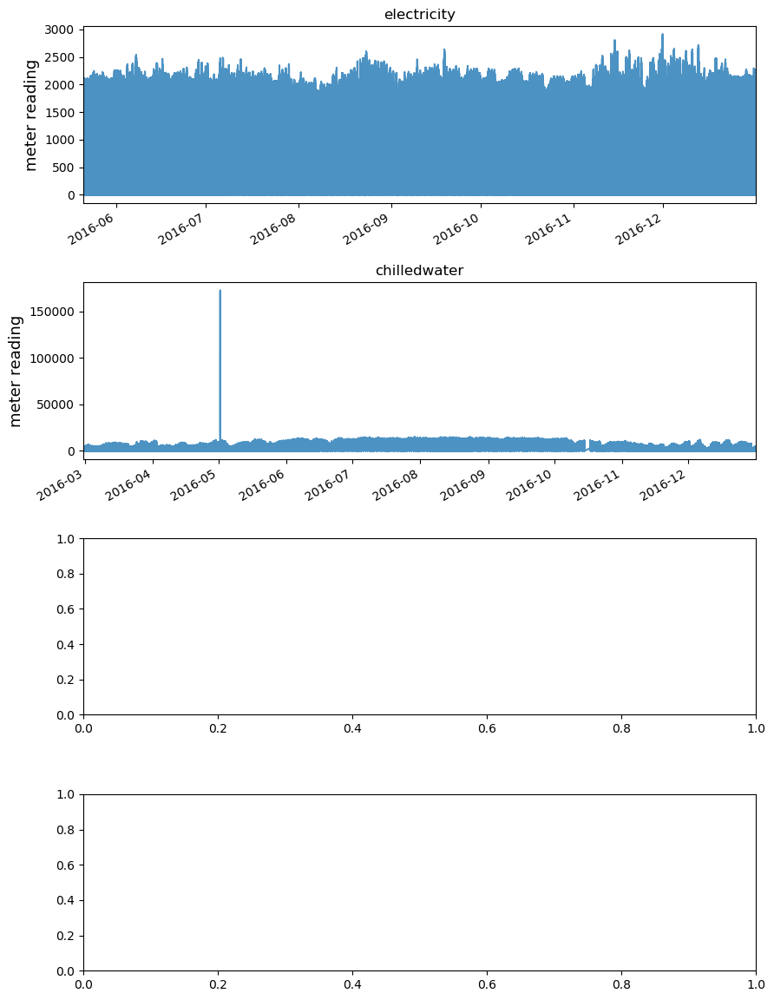

In [14]:
site_plot(0)

As we can see, there is an outlier. Lets find out which building caused this.

In [15]:
train_df.query('site_id == 0 & meter_reading > 50000')

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
6203009,60,1,2016-05-01 19:00:00,172611.0,0,Education,81576,1997.0,NaN


We found out that it is building_id = 60. Lets delete it and see how the plot looks like.

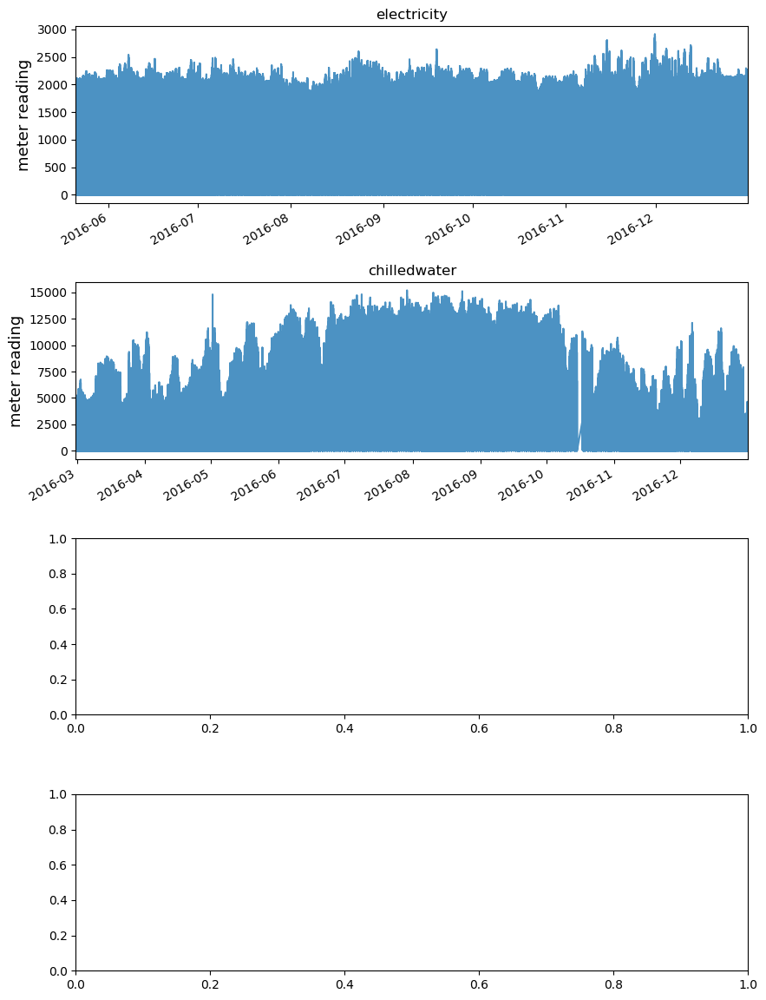

In [16]:
train_df.drop(train_df.query('site_id == 0 & meter_reading > 25000').index, inplace=True)
site_plot(0)

## Meter 0

#### Drop electricity meter readings on another high or low level at the start of 2016

In [17]:
site_buildings.unique()[0]

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104])

,meter_reading
count,5399.000000
mean,237.838120
std,48.827457
min,49.144299
25%,208.863007
50%,240.944000
75%,261.420990
max,330.359009


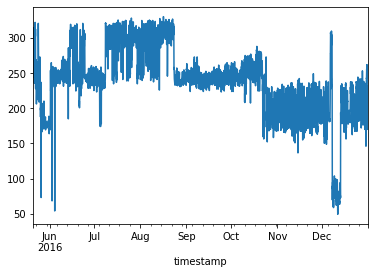

In [18]:
building_0_elec = train_df[(train_df['building_id'] == 0) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp')
building_0_elec['meter_reading'].plot()

building_0_elec.describe() ## Dont know why author delete 

In [19]:
def single_building_plot(building_id, meter, axe, plot_title):
    building_reading = train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == meter)]
    building_reading[['timestamp', 'meter_reading']].set_index('timestamp')['meter_reading'].plot(ax=axe)
    axe.title.set_text(plot_title)
    del building_reading
    gc.collect()

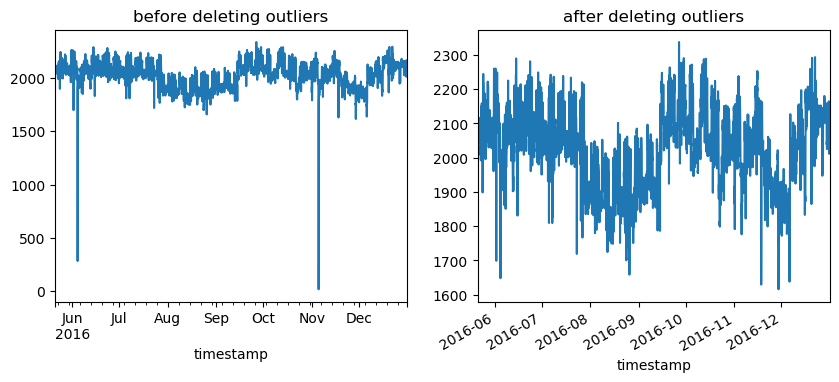

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
single_building_plot(18, 0, axes[0], 'before deleting outliers')

train_df.drop(train_df.query('building_id == 18 and meter == 0 and meter_reading < 1500').index, inplace=True)
single_building_plot(18, 0, axes[1], 'after deleting outliers')

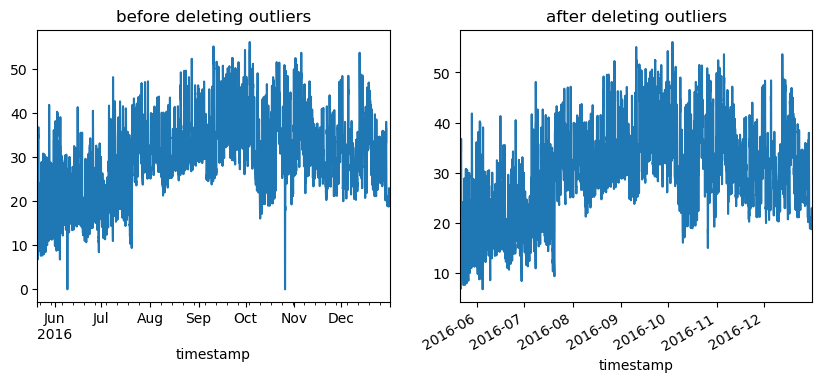

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
single_building_plot(22, 0, axes[0], 'before deleting outliers')

train_df.drop(train_df.query('building_id == 22 and meter == 0 and meter_reading == 0').index, inplace=True)
single_building_plot(22, 0, axes[1], 'after deleting outliers')

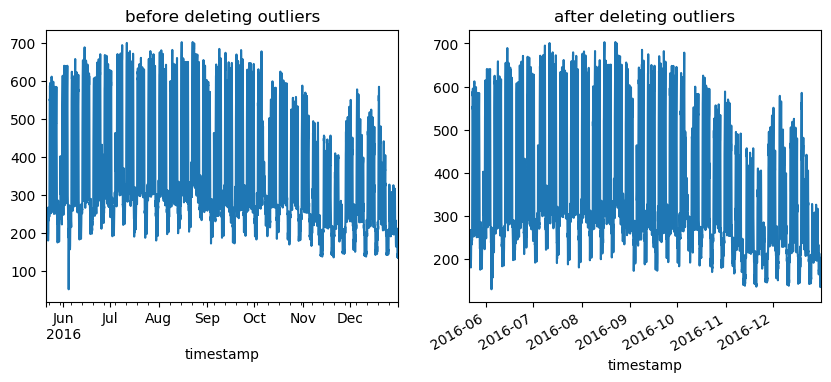

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 25
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 100').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

,meter_reading
count,5390.000000
mean,490.101166
std,76.926575
min,323.260010
25%,418.886993
50%,476.528992
75%,561.679016
max,661.263977


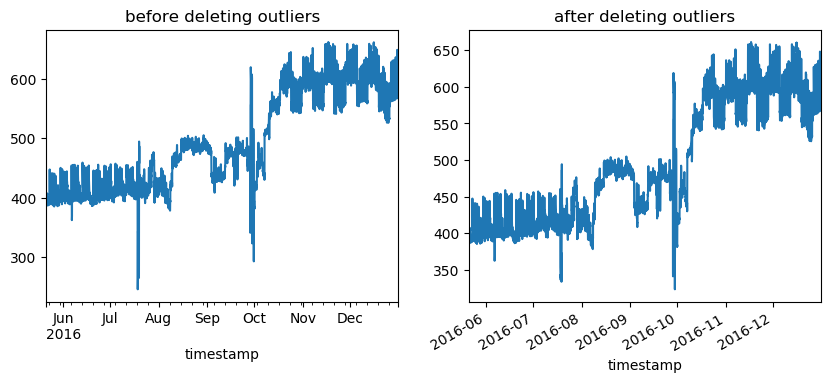

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 38
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 300').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

,meter_reading
count,5399.000000
mean,207.907883
std,35.383377
min,37.813801
25%,191.354004
50%,211.000000
75%,231.536499
max,291.272003


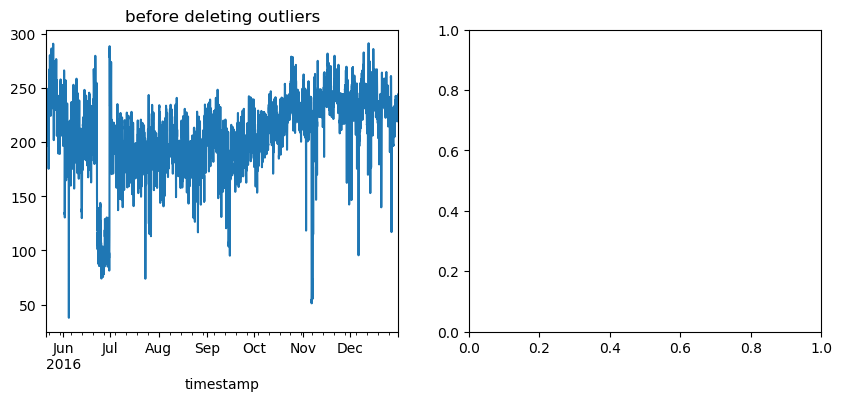

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 41
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

#train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 300').index, inplace=True)
#single_building_plot(building_id, 0, axes[1], 'after deleting outliers')
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

As we can see, most electricity meter_readings (at least 75%) for building 53 is 0, so better option is to delete all of the building 53's electricity meter_readings.

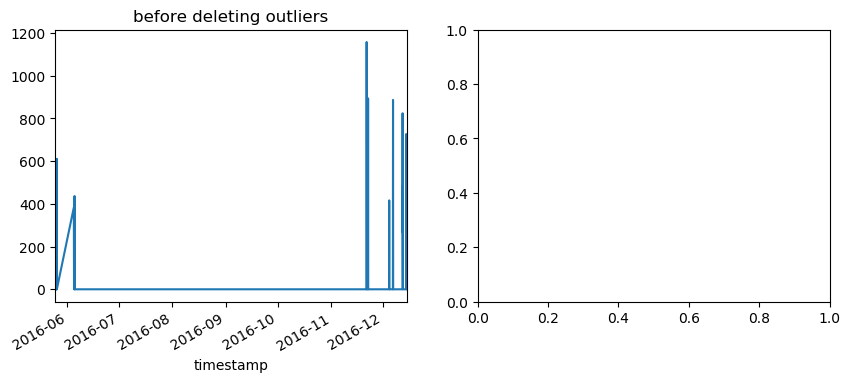

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 53
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()
train_df.drop(train_df.query('building_id == @building_id and meter == 0').index, inplace=True)

#single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

,meter_reading
count,5399.000000
mean,171.148438
std,41.426952
min,62.795502
25%,137.604004
50%,171.459000
75%,202.037994
max,329.266998


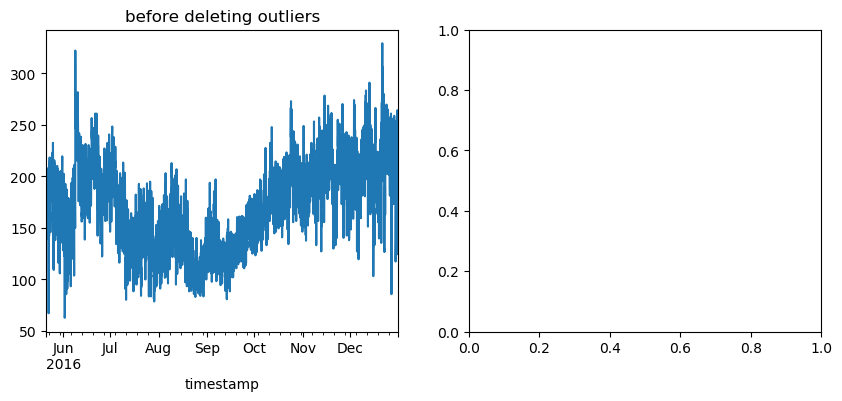

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 77
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

#train_df.drop(train_df.query('building_id == @building_id and meter == 0').index, inplace=True)
#single_building_plot(building_id, 0, axes[1], 'after deleting outliers')
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

,meter_reading
count,5332.000000
mean,321.726990
std,105.892822
min,44.775902
25%,218.419006
50%,332.542999
75%,393.154999
max,989.439026


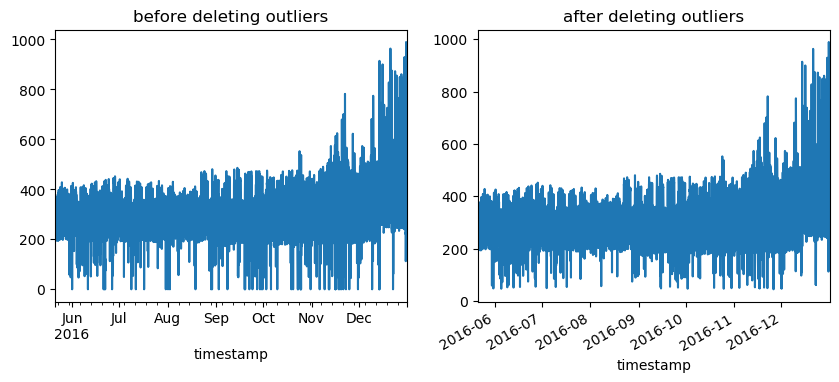

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 78
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading == 0').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

,meter_reading
count,5399.000000
mean,86.961014
std,37.837227
min,0.000000
25%,56.241249
50%,79.040497
75%,112.349499
max,252.755997


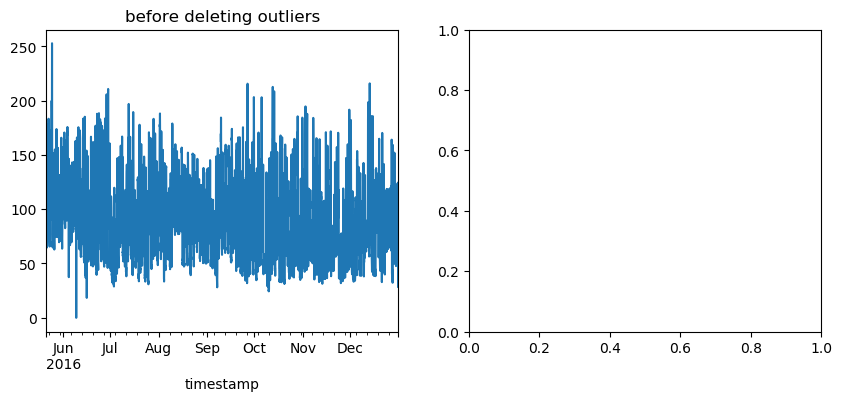

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 86
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

#train_df.drop(train_df.query('building_id == @building_id and meter == 0').index, inplace=True)
#single_building_plot(building_id, 0, axes[1], 'after deleting outliers')
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

,meter_reading
count,5397.000000
mean,99.137550
std,31.232683
min,0.000000
25%,75.900703
50%,96.923500
75%,127.501999
max,160.537994


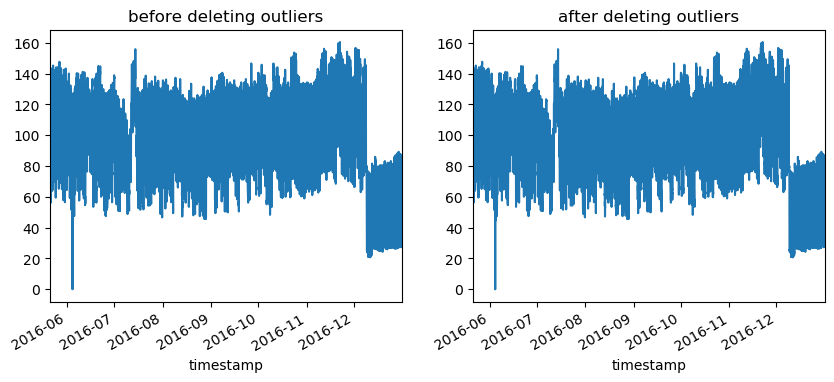

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 101
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading > 400').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

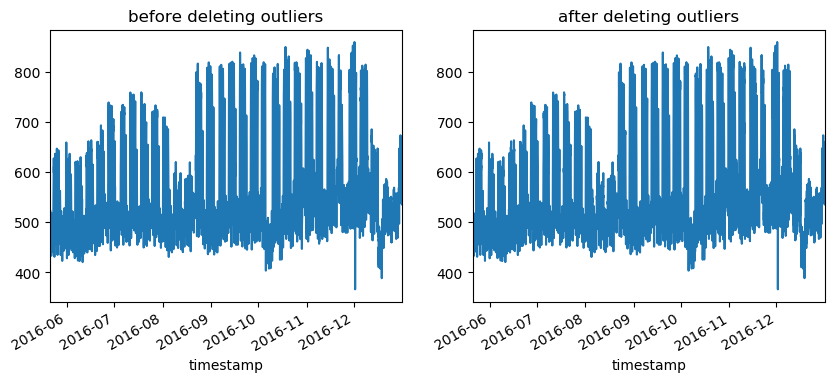

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 7
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 200').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

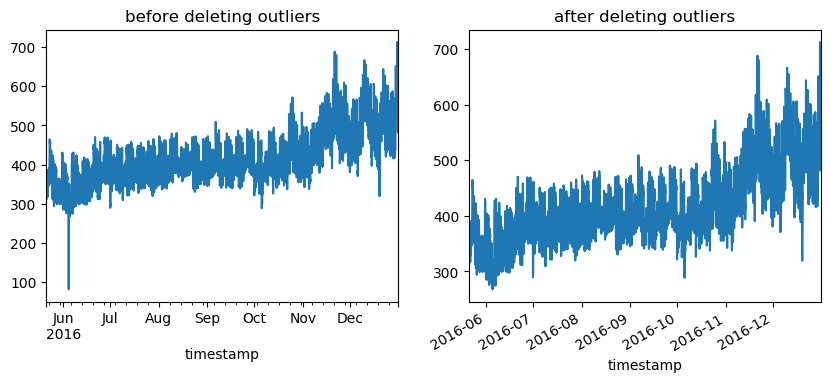

In [32]:
building_id = 8
train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == 0)][['timestamp', 'meter_reading']].set_index('timestamp').describe()

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 200').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

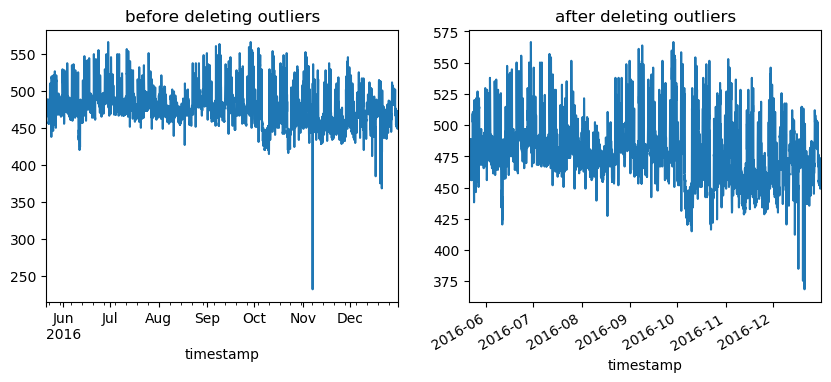

In [34]:
building_id = 11
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 300').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

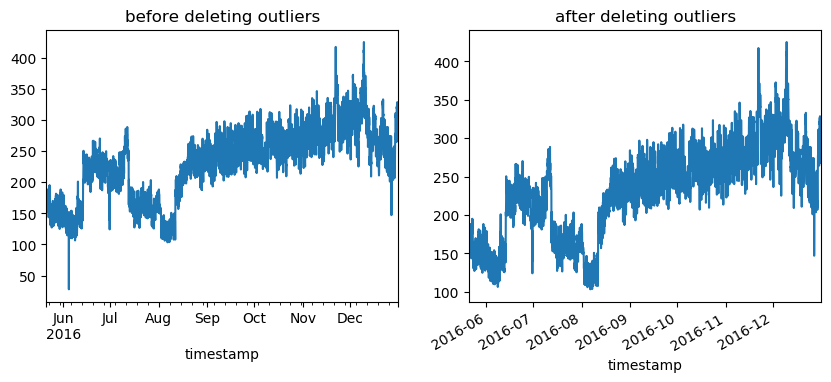

In [35]:
building_id = 12
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 50').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

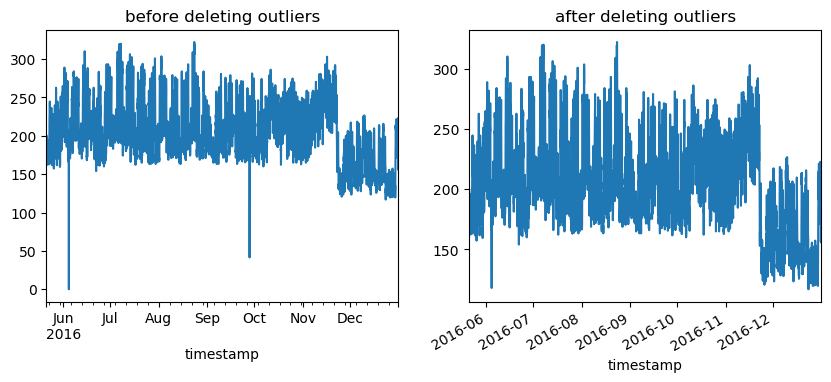

In [37]:
building_id = 19
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 50').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

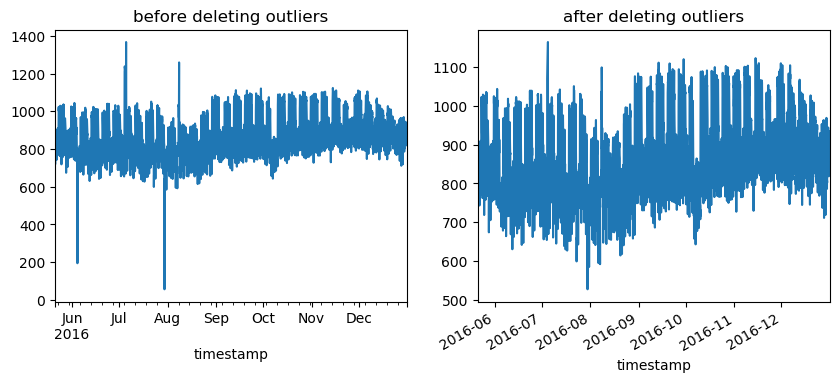

In [36]:
building_id = 23
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and (meter_reading < 400 or meter_reading > 1200)').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

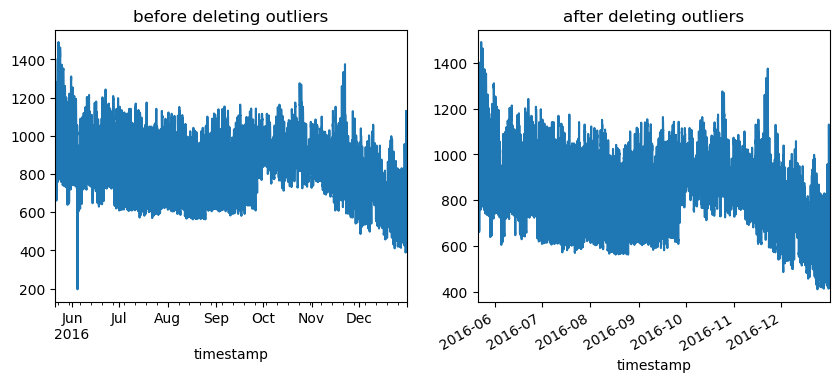

In [38]:
building_id = 24
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 400').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

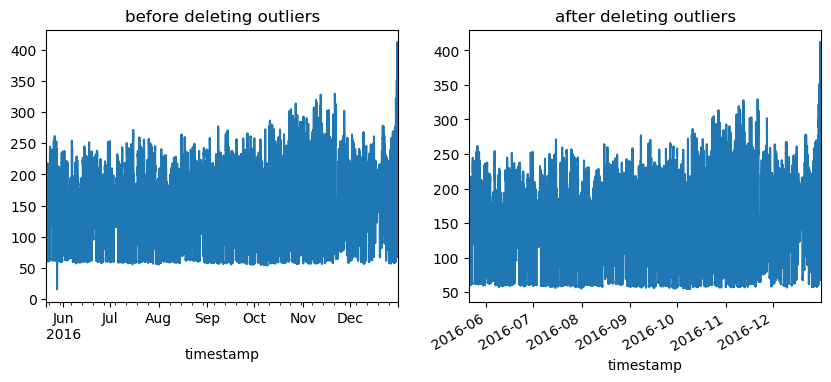

In [39]:
building_id = 26
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 50').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

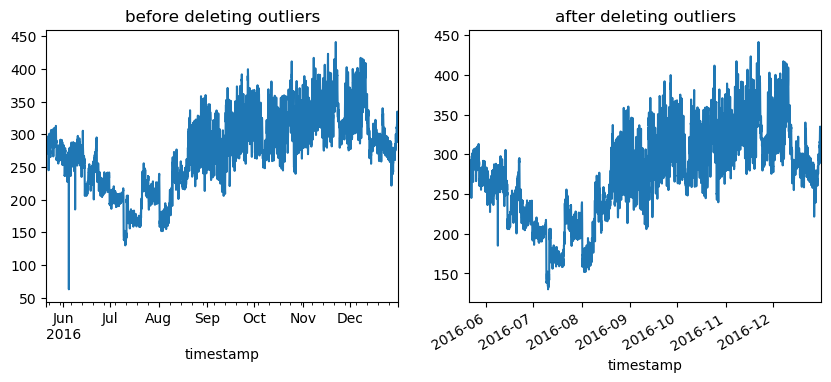

In [40]:
building_id = 27
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 100').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

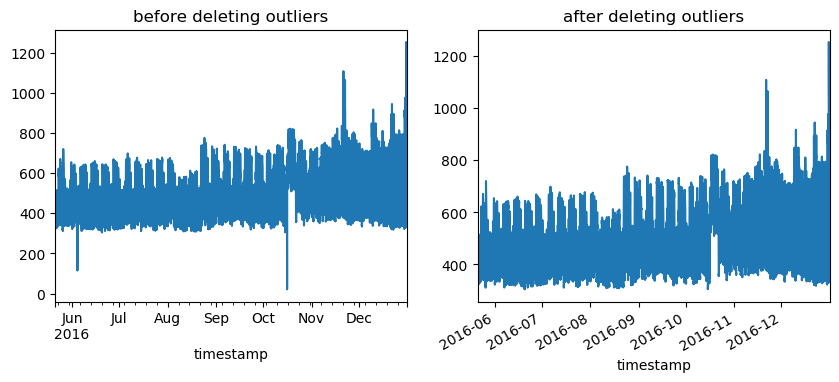

In [41]:
building_id = 30
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 250').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

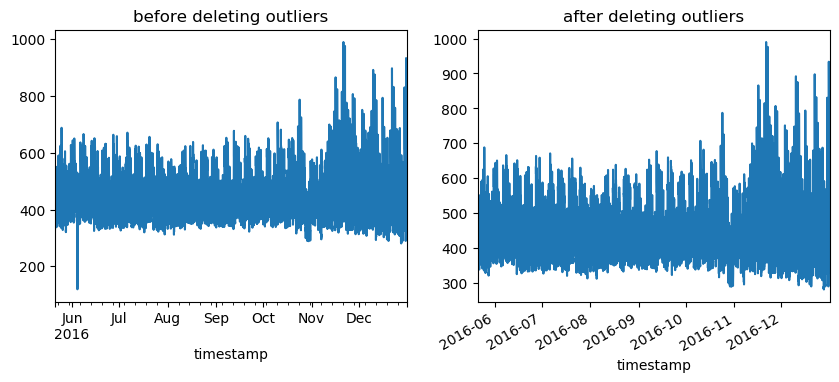

In [42]:
building_id = 31
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 200').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

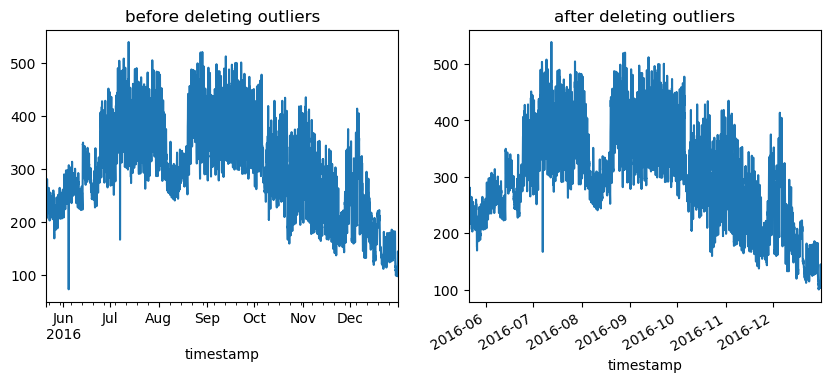

In [43]:
building_id = 34
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 100').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

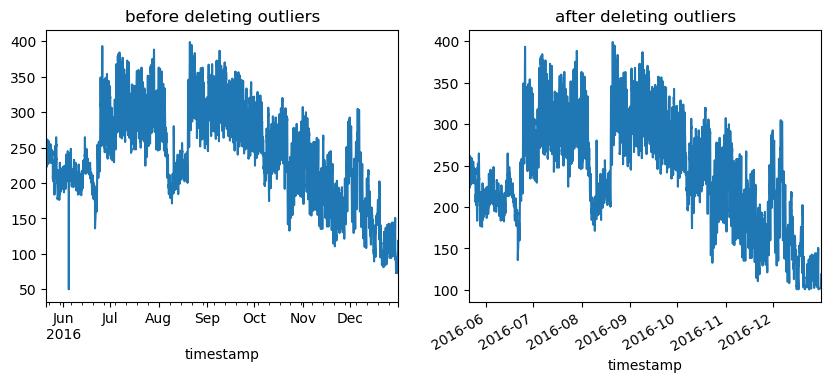

In [44]:
building_id = 35
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 100').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

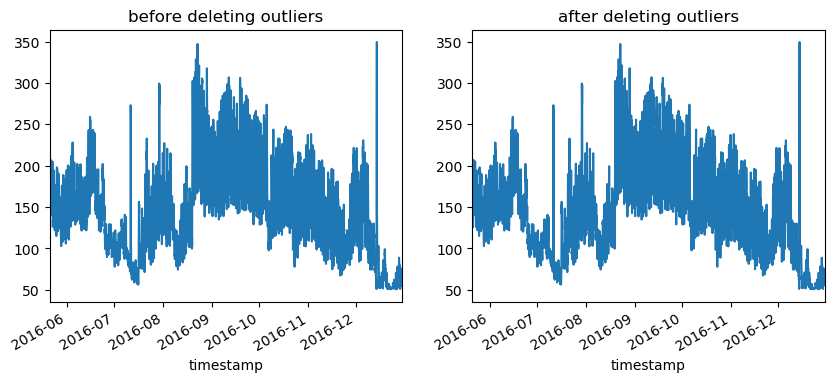

In [437]:
building_id = 36
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and (meter_reading < 50 or meter_reading > 350)').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

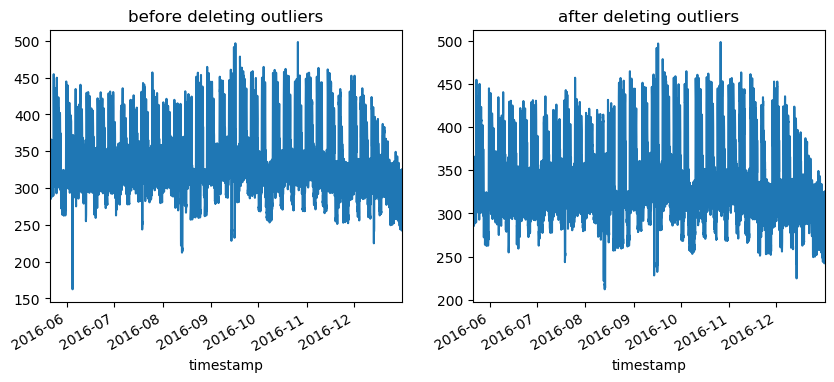

In [440]:
building_id = 39
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and (meter_reading > 500 or meter_reading < 200)').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

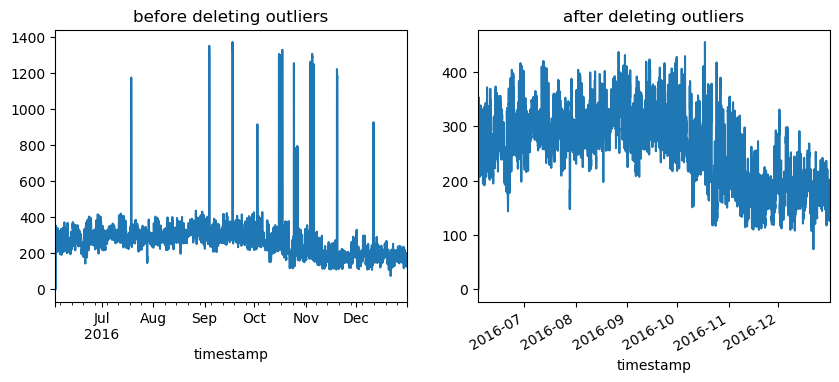

In [47]:
building_id = 40
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading > 600').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

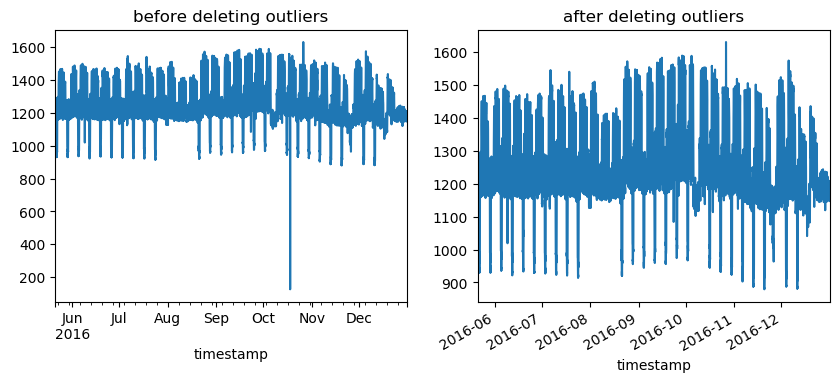

In [48]:
building_id = 42
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 600').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

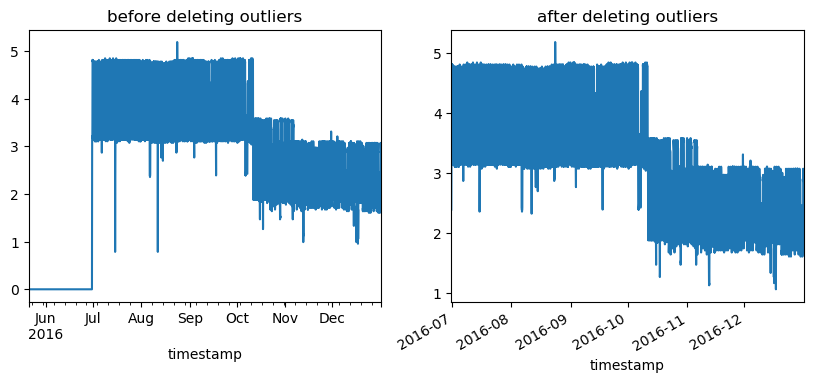

In [49]:
building_id = 45
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 1').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

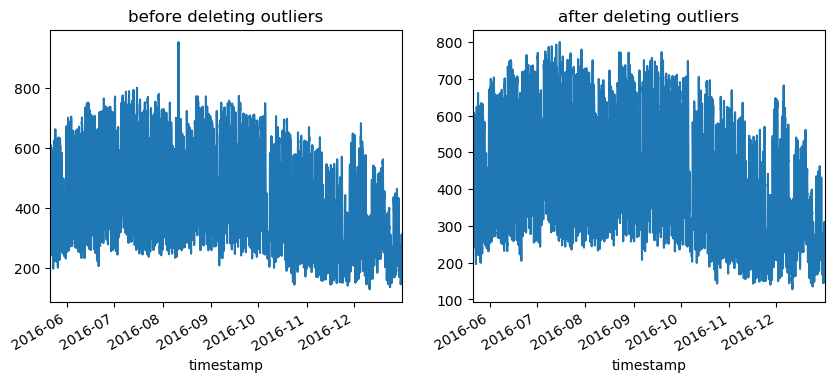

In [50]:
building_id = 47
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading > 800').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

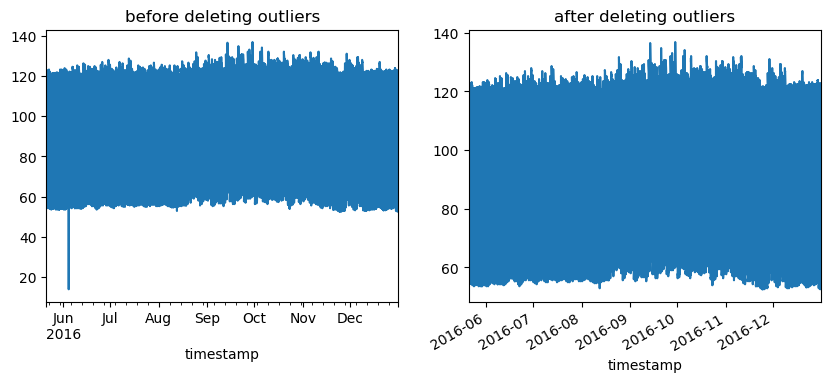

In [51]:
building_id = 51
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 40').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

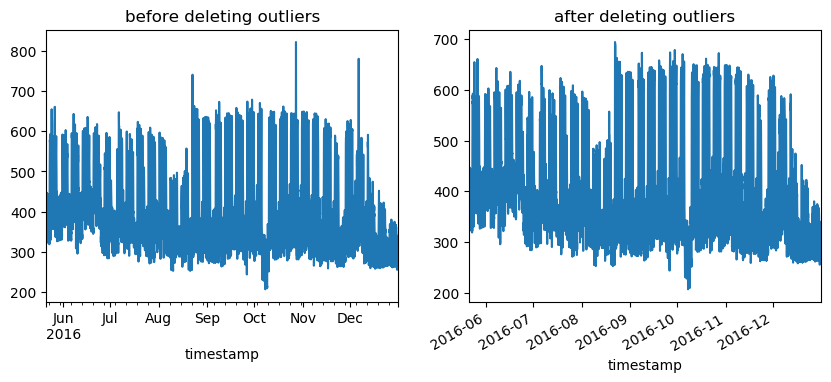

In [52]:
building_id = 52
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading > 700').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

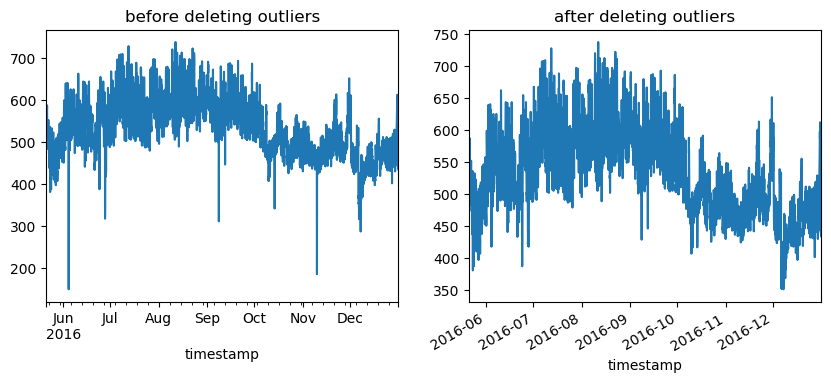

In [53]:
building_id = 54
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 350').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

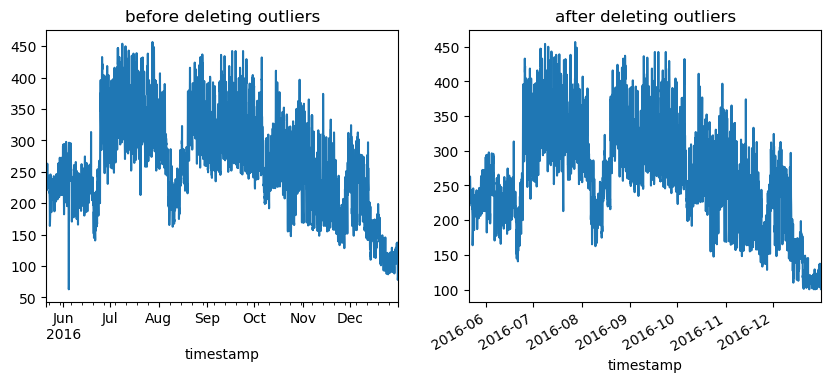

In [54]:
building_id = 61
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 100').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

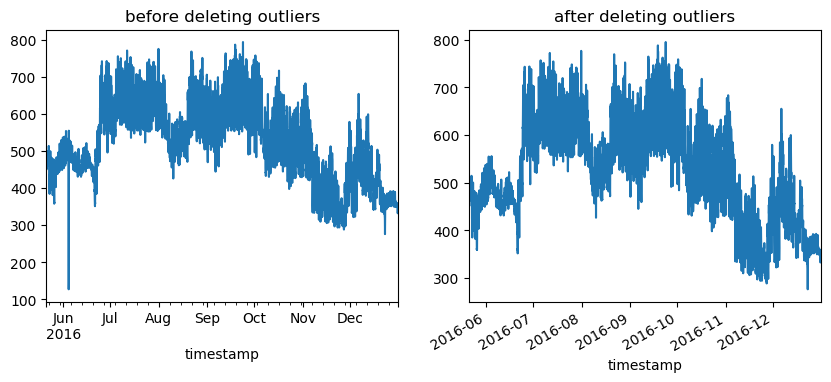

In [55]:
building_id = 62
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 200').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

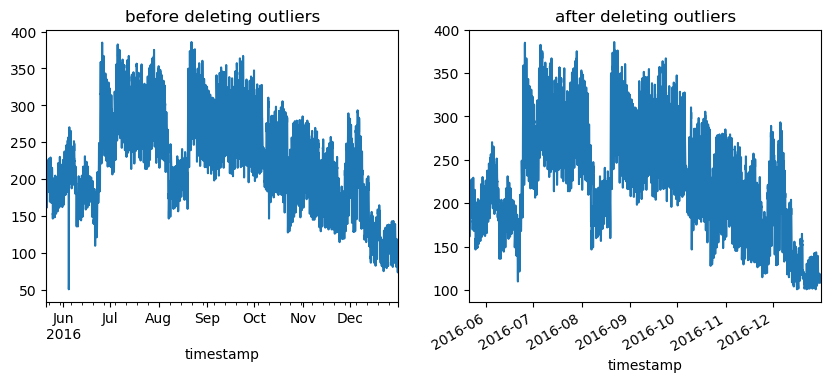

In [56]:
building_id = 63
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 100').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

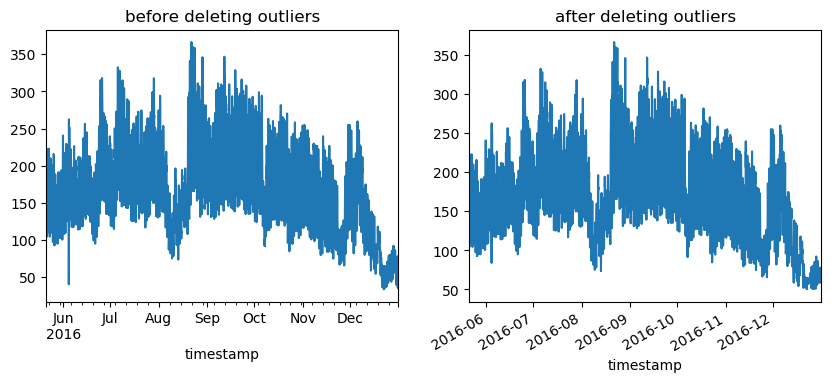

In [57]:
building_id = 65
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 50').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

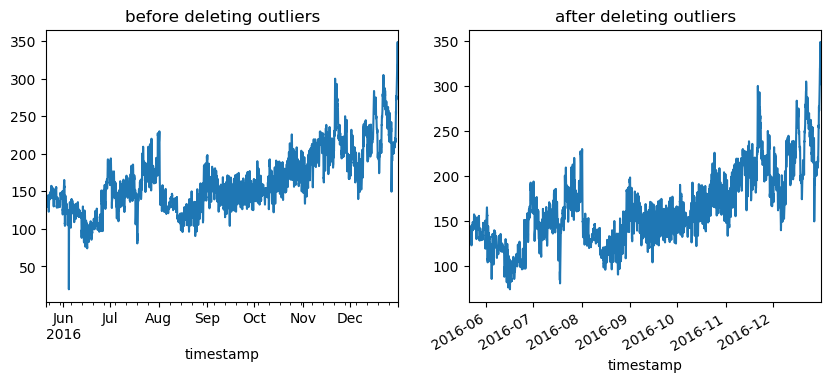

In [58]:
building_id = 66
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 50').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

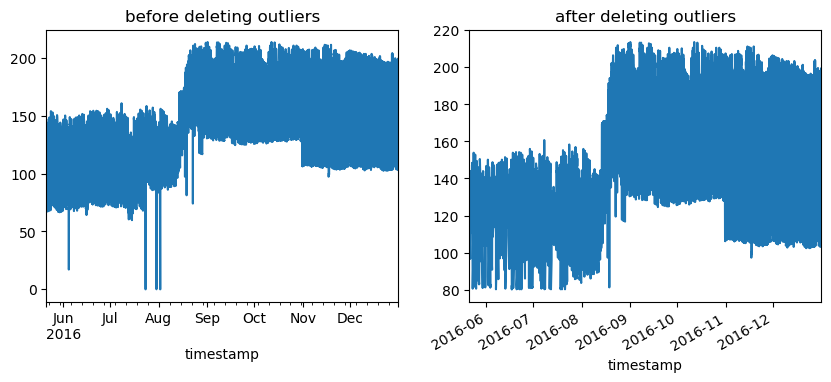

In [59]:
building_id = 71
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 80').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

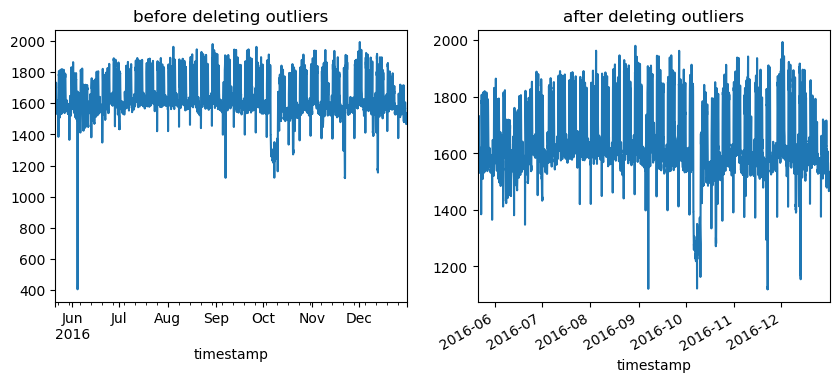

In [60]:
building_id = 76
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 1000').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

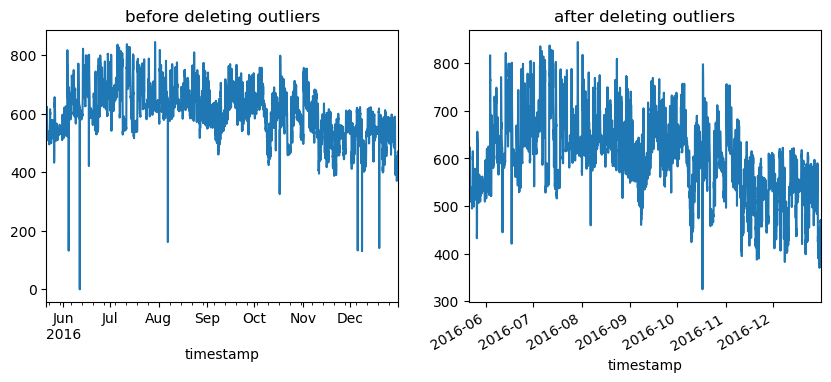

In [61]:
building_id = 79
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 300').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

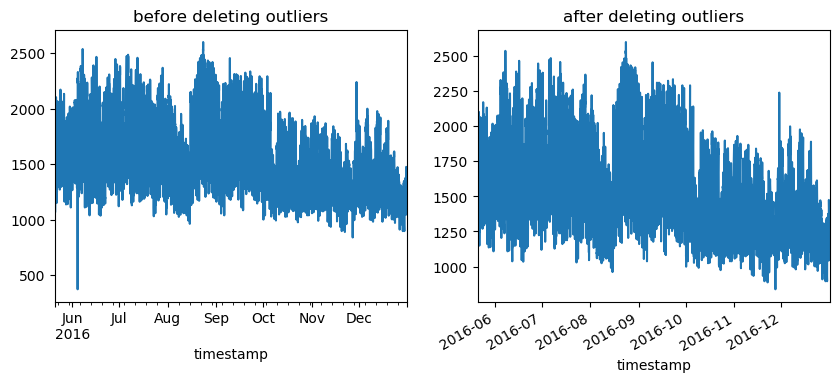

In [62]:
building_id = 80
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 500').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

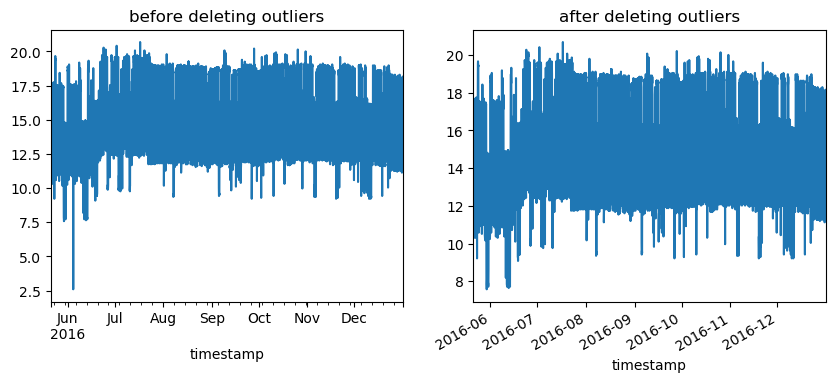

In [63]:
building_id = 81
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 5').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

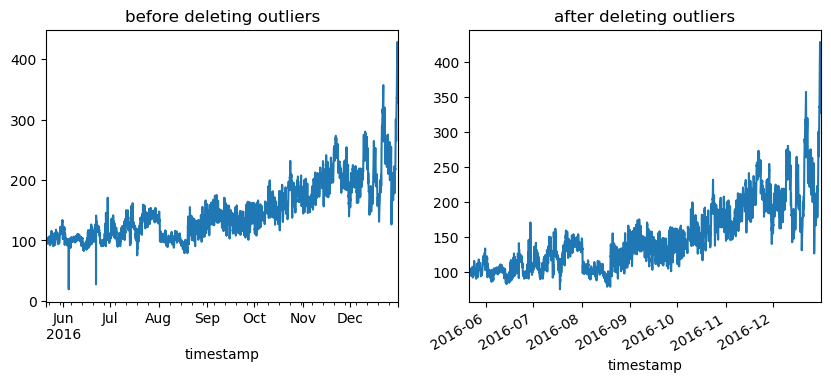

In [64]:
building_id = 85
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 50').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

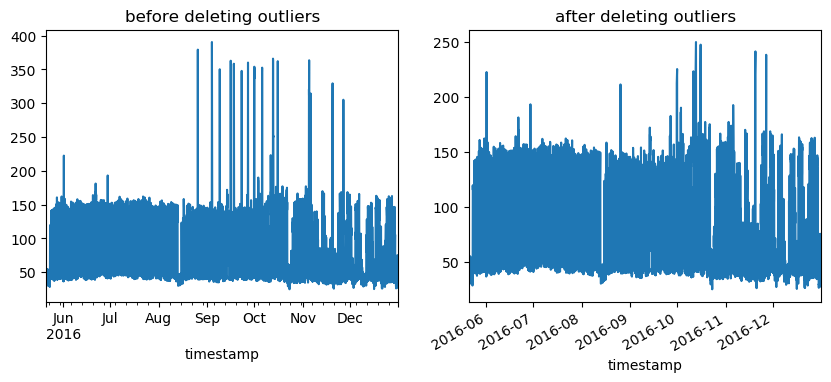

In [65]:
building_id = 87
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading > 250').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

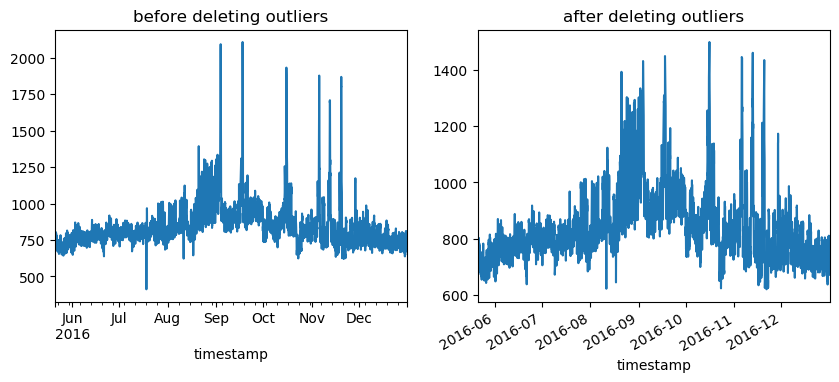

In [66]:
building_id = 88
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and (meter_reading < 500 or meter_reading > 1500)').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

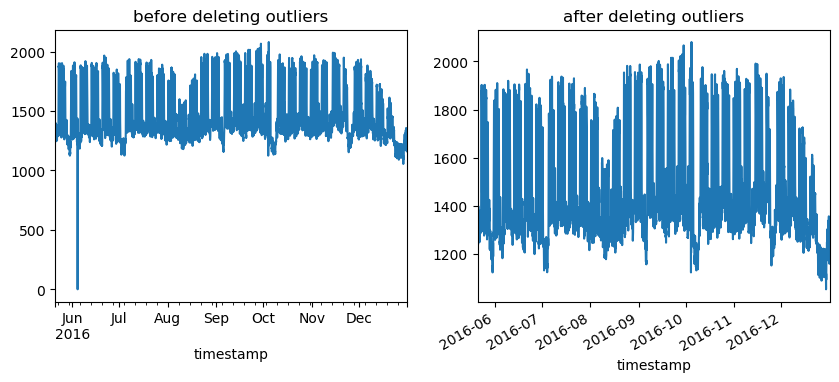

In [67]:
building_id = 89
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 1000').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

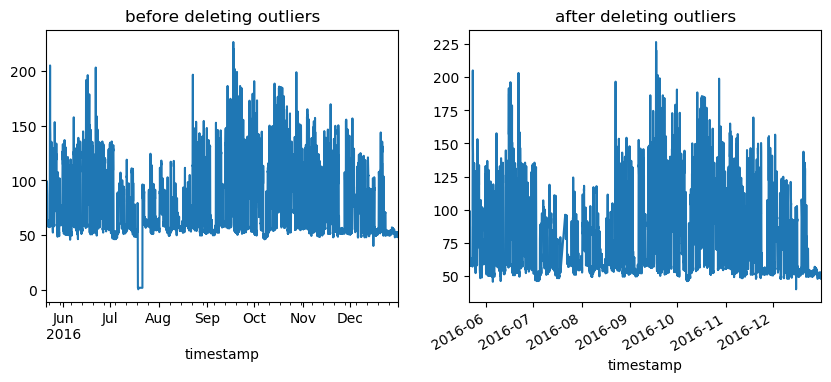

In [68]:
building_id = 94
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 10').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

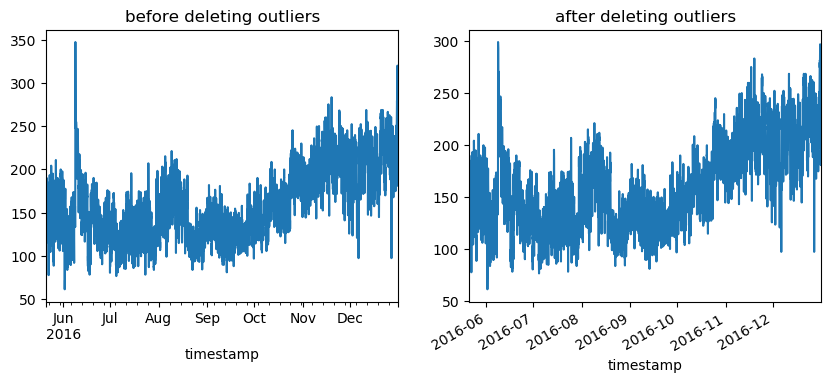

In [69]:
building_id = 100
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading > 300').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

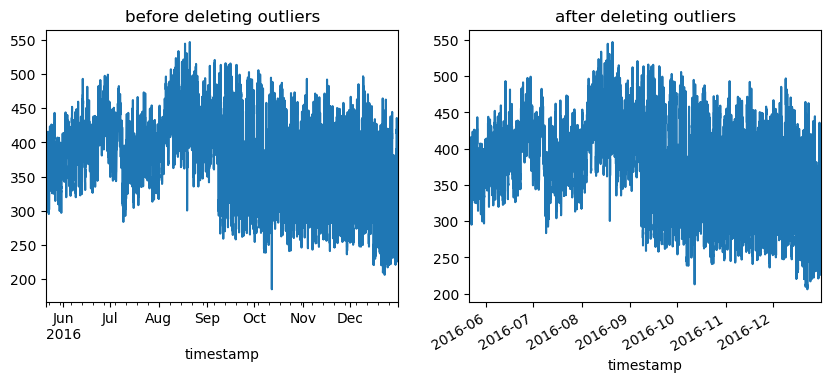

In [70]:
building_id = 104
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

single_building_plot(building_id, 0, axes[0], 'before deleting outliers')
train_df.drop(train_df.query('building_id == @building_id and meter == 0 and meter_reading < 200').index, inplace=True)
single_building_plot(building_id, 0, axes[1], 'after deleting outliers')

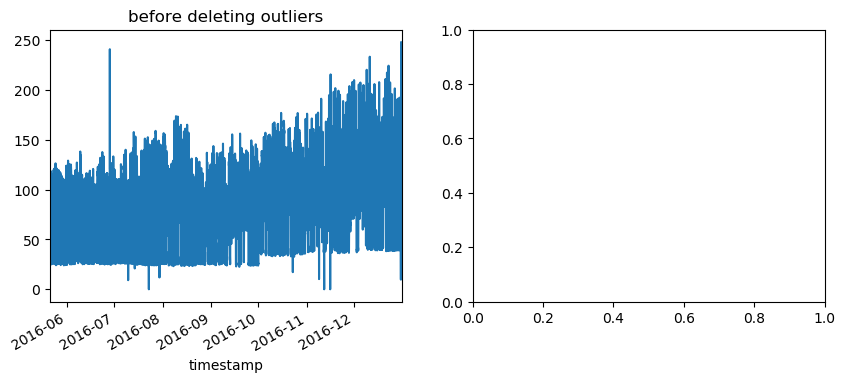

In [73]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
building_id = 103
single_building_plot(building_id, 0, axes[0], 'before deleting outliers')

####  Constant Target 

Constant value series occur frequently in almost every site and every meter type. Function find_constant is used for detecting those series. It takes building_id, meter and min_length parameters and returns the indices of constant series of the given building and meter type.

    If plot parameter is set to True, function displays the target signal with and without dropped indices for comparison.
    If verbose is set to True, function outputs the length of the series and their dates.


In [74]:
def find_constant(building_id, meter, min_length, plot=False, verbose=False):
    if verbose:
        print("building_id: {}, meter: {}".format(building_id, meter))

    temp_df = train_df[(train_df['building_id'] == building_id) & (train_df['meter'] == meter)]
    target = temp_df['meter_reading'].values
    
    splitted_target = np.split(target, np.where(target[1:] != target[:-1])[0] + 1)
    splitted_date = np.split(temp_df['timestamp'].values, np.where(target[1:] != target[:-1])[0] + 1)

    building_idx = []
    for i, x in enumerate(splitted_date):
        if len(x) > min_length:
            start = x[0]
            end = x[-1]
            value = splitted_target[i][0]
            idx = train_df.query('(@start <= timestamp <= @end) and meter_reading == @value and meter == @meter and building_id == @building_id', engine='python').index.tolist()
            building_idx.extend(idx)
            if verbose:
                print('Length: {},\t{}  -  {},\tvalue: {}'.format(len(x), start, end, value))
                
    building_idx = pd.Int64Index(building_idx)
    if plot:
        fig, axes = plt.subplots(nrows=2, figsize=(16, 18), dpi=100)

        temp_df.set_index('timestamp')['meter_reading'].plot(ax=axes[0])
        # drop rows with constant value
        temp_df.drop(building_idx, axis=0).set_index('timestamp')['meter_reading'].plot(ax=axes[1])

        axes[0].set_title(f'Building {building_id} raw meter readings')
        axes[1].set_title(f'Building {building_id} filtered meter readings')
        
        plt.show()
 
    del temp_df
    gc.collect()
    return building_idx

### Meter 1: Chilled Water

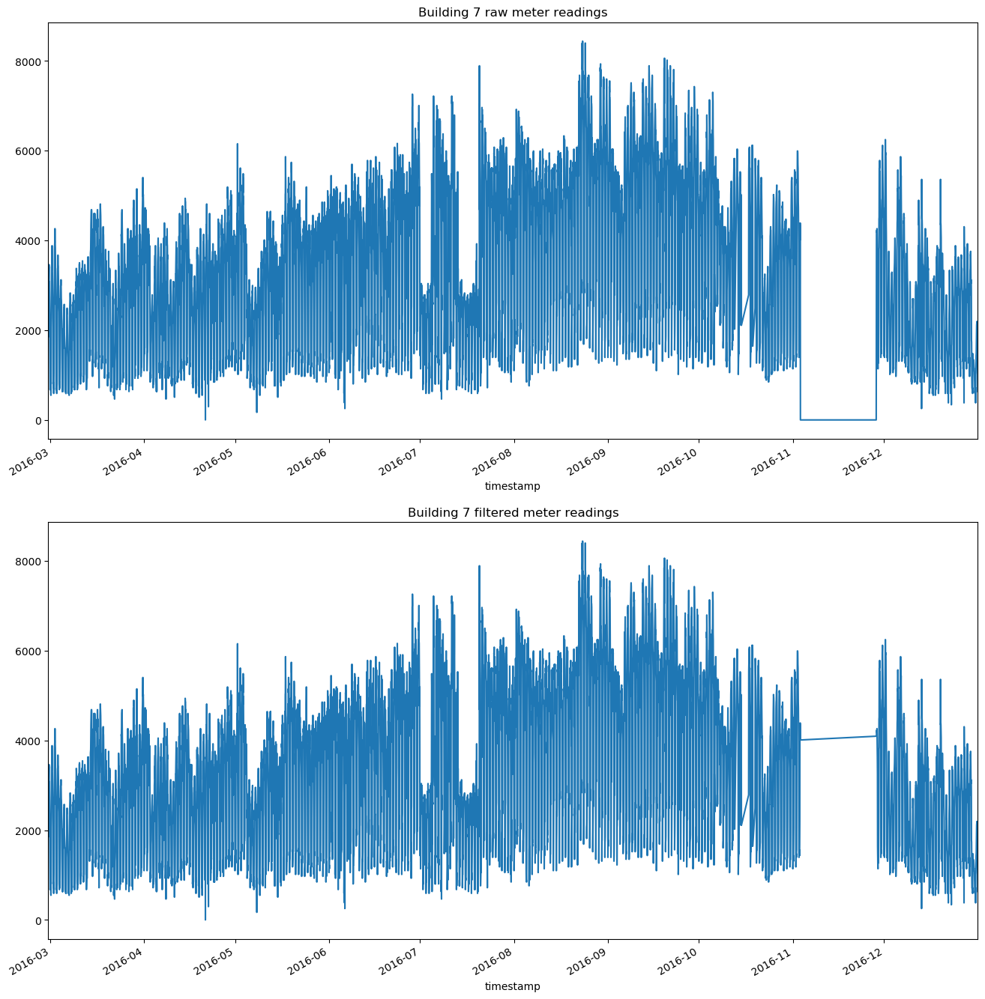

Int64Index([16576122, 16578483, 16580842, 16583200, 16585561, 16587920,
            16590281, 16592641, 16595002, 16597361,
            ...
            17959415, 17961773, 17964132, 17966491, 17968850, 17971208,
            17973565, 17975922, 17978280, 17980637],
           dtype='int64', length=601)

In [75]:
find_constant(7, 1, 50, plot=True)

In [76]:
print('[Site 0 - Chilled Water] Filtering leading constant values')
site0_meter1_thresholds = {
    50: [7, 9, 43, 75, 95, 97, 98]
}

for threshold in site0_meter1_thresholds:
    for building_id in site0_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 0 - Chilled Water] Filtering leading constant values


In [77]:
site_id = 0
site0_chill = train_df[(train_df['site_id'] == site_id) & (train_df['meter'] == 1)]
print(site0_chill[(site0_chill['building_id'] == 100)]['meter_reading'].isnull().all())
print(site0_chill['building_id'].unique())

# builindgs that have non_NAN chillwater meter_readings in site 0
chill_buildings = site0_chill['building_id'].unique()
del site0_chill
gc.collect()

True
[  7   9  13  14  15  29  30  31  43  50  55  60  75  76  78  82  91  92
  95  96  97 103  28  98]


20

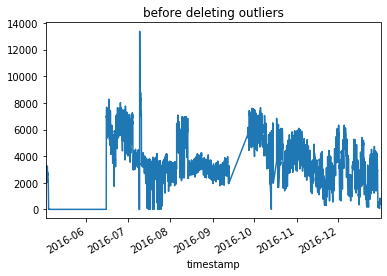

In [78]:
fig = plt.plot()
ax = plt.gca()
building_id = 98
single_building_plot(building_id, 1, ax, 'before deleting outliers')

In [79]:
def single_building_plot_df(df, building_id, meter, axe, plot_title):
    building_reading = df[(df['building_id'] == building_id) & (df['meter'] == meter)][['timestamp', 'meter_reading']]
    building_reading.set_index('timestamp')
    building_reading['meter_reading'].plot(ax=axe)
    axe.title.set_text(plot_title)
    del building_reading
    gc.collect()

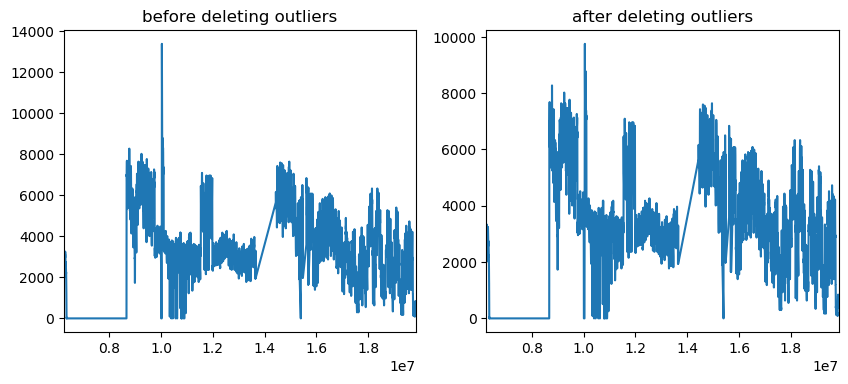

In [81]:
building_id = 98
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, 1, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == 1 and meter_reading > 10000').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, 1, axes[1], 'after deleting outliers')
del train_df_cp
gc.collect()

filtered_idx = train_df.query('building_id == @building_id and meter == 1 and meter_reading > 10000').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

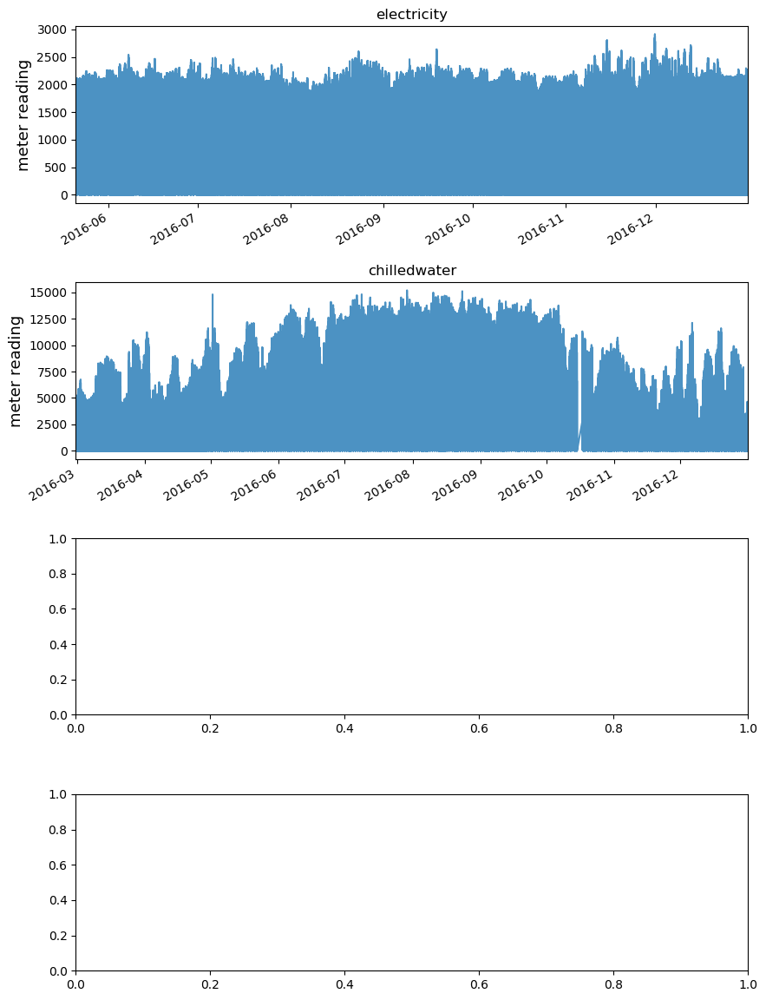

In [82]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(0)

## Site 1

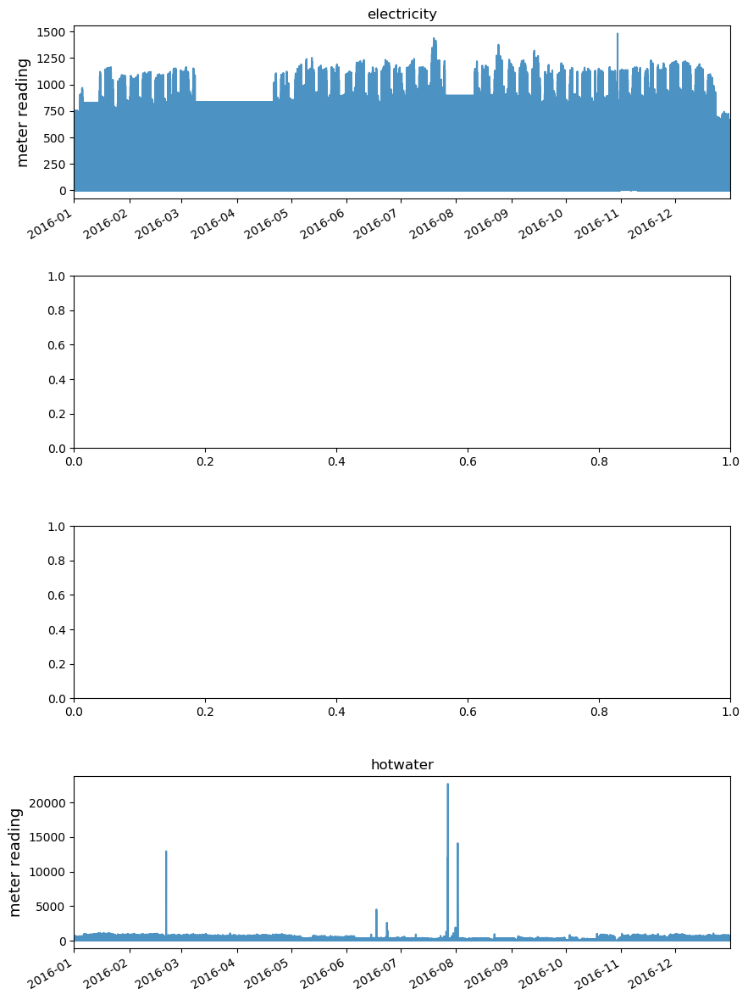

In [83]:
site_plot(1)

In [84]:
train_df.query('site_id == 1 & meter_reading > 10000')

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,IsFiltered
2646458,121,3,2016-02-21 10:00:00,12939.099609,1,Education,150318,1906.0,9.0,NaN
11026274,119,3,2016-07-27 11:00:00,22700.000000,1,Education,91149,2007.0,7.0,NaN
11028626,145,3,2016-07-27 12:00:00,12100.000000,1,Office,14219,NaN,4.0,NaN
11331944,119,3,2016-08-01 23:00:00,14100.000000,1,Education,91149,2007.0,7.0,NaN


45

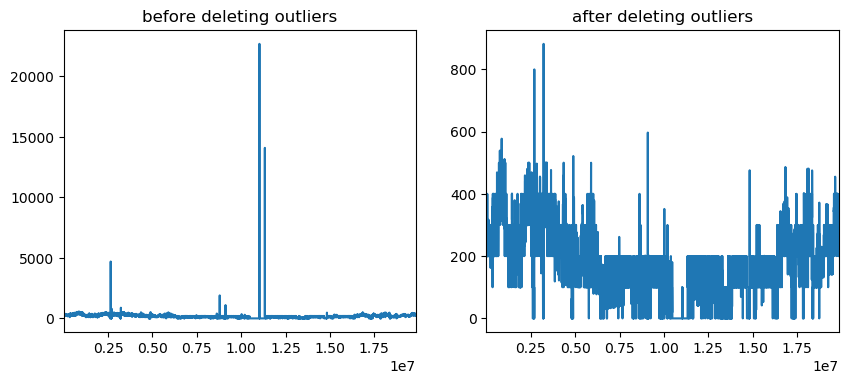

In [85]:
building_id = 119
meter = 3

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 1000').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

filtered_idx = train_df.query('building_id == @building_id and meter == @meter and meter_reading > 1000').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

gc.collect()

45

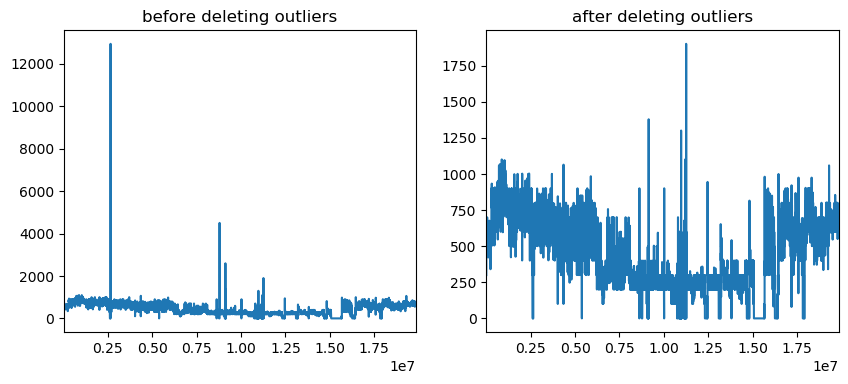

In [86]:
building_id = 121
meter = 3

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 2000').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

filtered_idx = train_df.query('building_id == @building_id and meter == @meter and meter_reading > 2000').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

gc.collect()

45

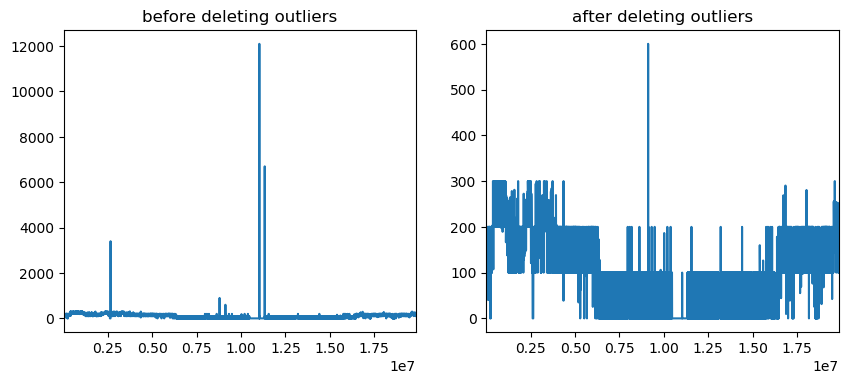

In [87]:
building_id = 145
meter = 3

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 600').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

filtered_idx = train_df.query('building_id == @building_id and meter == @meter and meter_reading > 600').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

gc.collect()

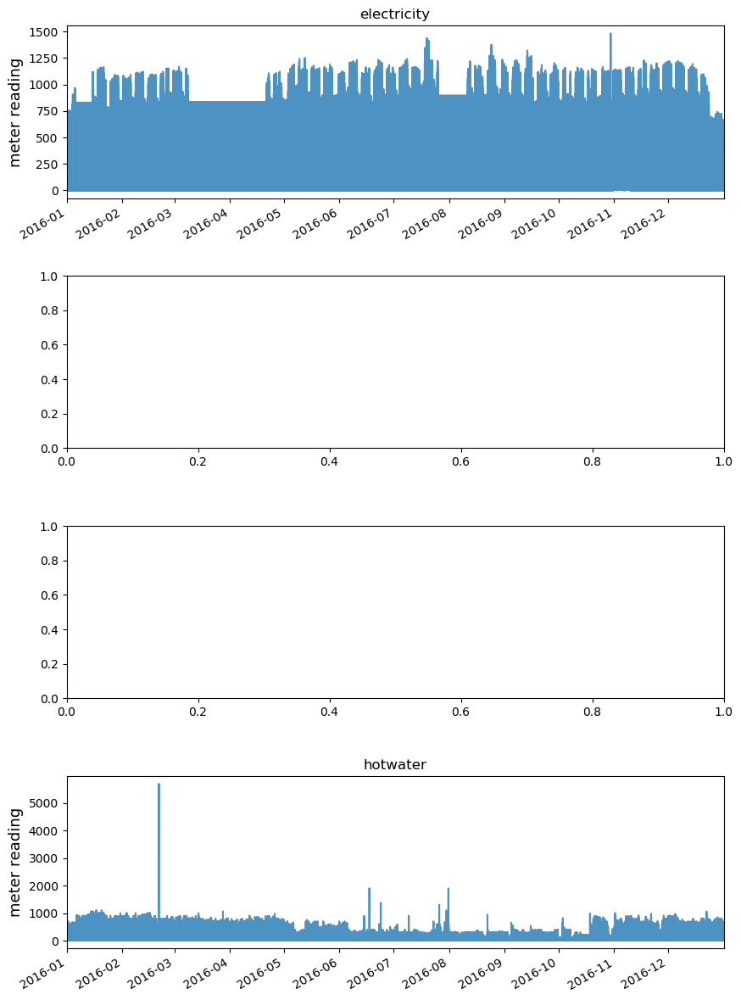

In [88]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(1)

In [109]:
train_df.query('site_id == 1 & meter_reading > 1500')

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,IsFiltered
11260001,121,3,2016-07-31 16:00:00,1900.0,1,Education,150318,1906.0,9.0,NaN


45

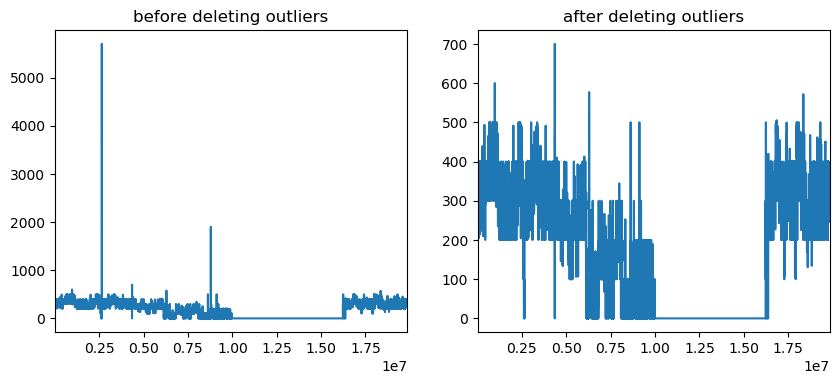

In [90]:
building_id = 114
meter = 3

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 1000').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

filtered_idx = train_df.query('building_id == @building_id and meter == @meter and meter_reading > 1000').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

gc.collect()

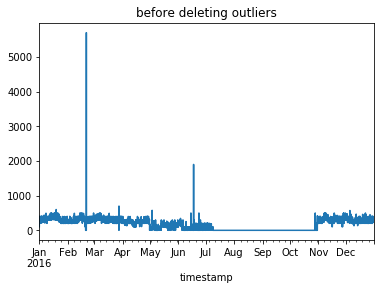

In [91]:
fig = plt.plot()
ax = plt.gca()
building_id = 114
single_building_plot(building_id, 3, ax, 'before deleting outliers')

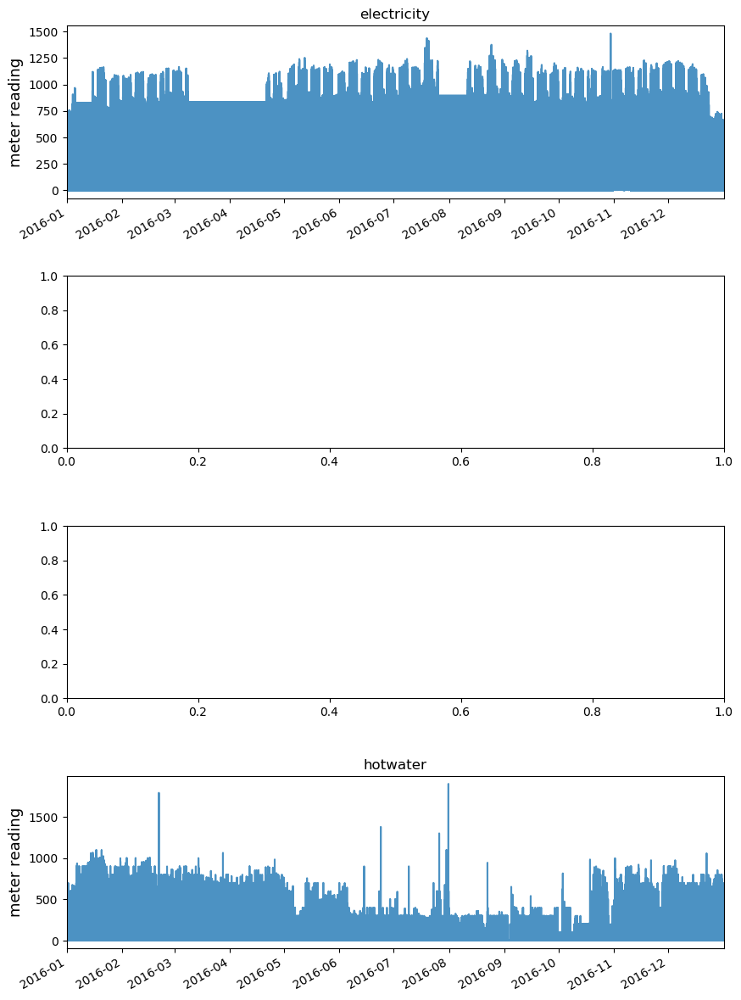

In [92]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(1)

We conclude above code more concisely here:

In [93]:
train_df.loc[train_df.query('building_id == 119 and meter == 3 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 121 and meter == 3 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 145 and meter == 3 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 114 and meter == 3 and meter_reading > 1000').index, 'IsFiltered'] = 1

### Meter 3

45

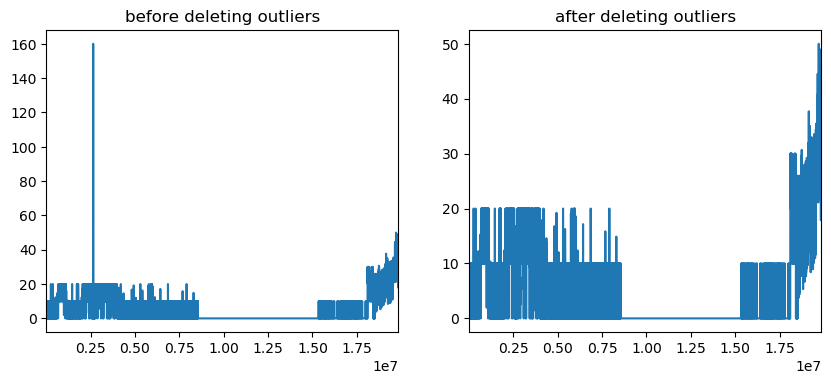

In [94]:
building_id = 144
meter = 3

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 100').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

filtered_idx = train_df.query('building_id == @building_id and meter == @meter and meter_reading > 100').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

gc.collect()

45

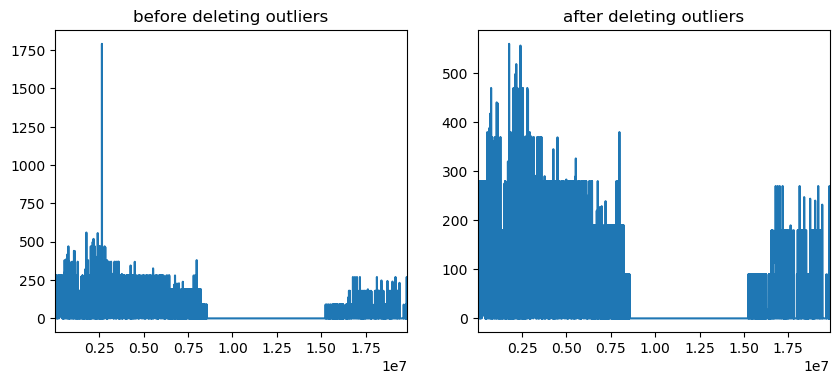

In [95]:
building_id = 112
meter = 3

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 1000').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

filtered_idx = train_df.query('building_id == @building_id and meter == @meter and meter_reading > 1000').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

gc.collect()

45

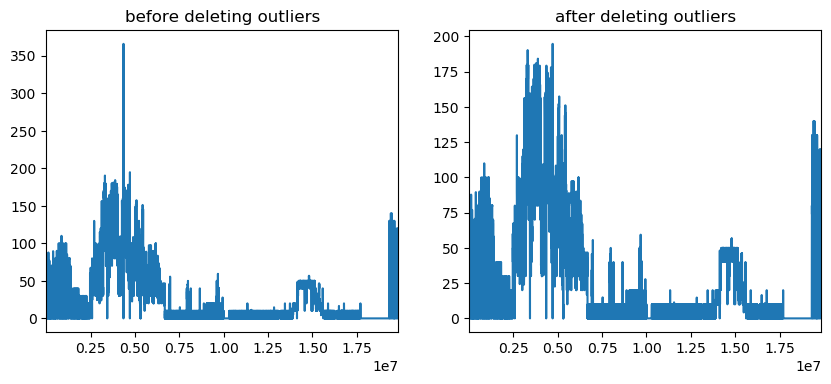

In [96]:
building_id = 138
meter = 3

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 250').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

filtered_idx = train_df.query('building_id == @building_id and meter == @meter and meter_reading > 250').index
train_df.loc[filtered_idx, 'IsFiltered'] = 1

gc.collect()

In [97]:
site_id = 1
meter = 3
site1_hot = train_df[(train_df['site_id'] == site_id) & (train_df['meter'] == meter)]
print(site1_hot['building_id'].unique())

del site1_hot
gc.collect()

[106 109 112 113 114 117 119 121 138 139 144 145]


20

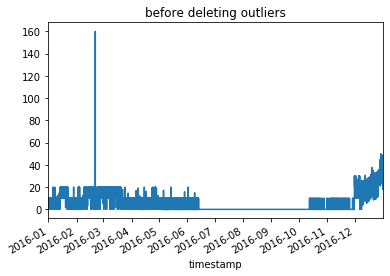

In [98]:
fig = plt.plot()
ax = plt.gca()
building_id = 144
single_building_plot(building_id, 3, ax, 'before deleting outliers')

We conclude above code more concisely here:

In [99]:
train_df.loc[train_df.query('building_id == 144 and meter == 3 and meter_reading > 100').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 112 and meter == 3 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 138 and meter == 3 and meter_reading > 250').index, 'IsFiltered'] = 1

In [100]:
print('[Site 1 - Hot Water] Filtering leading constant values')
site1_meter3_thresholds = {
    40: [106, 109, 112, 113, 114, 117, 119, 121, 138, 139, 144, 145]    
}

for threshold in site1_meter3_thresholds:
    for building_id in site1_meter3_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 3, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 1 - Hot Water] Filtering leading constant values


### Meter 0: electricity

In [101]:
# site_buildings = building_df.groupby('site_id')['building_id']
site_buildings.unique()[1]

array([105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155])

In [102]:
print('[Site 1 - Electricity] Filtering leading constant values')
site1_meter0_thresholds = {
    20: [106],
    50: [105, 107, 108, 109, 110, 111, 112, 113, 114, 115, 117, 119, 120, 127, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 147, 149, 152, 155]
}

for threshold in site1_meter0_thresholds:
    for building_id in site1_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 1 - Electricity] Filtering leading constant values


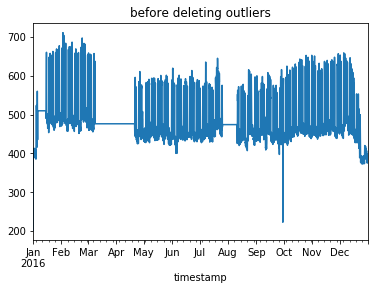

In [103]:
# 110, 113, 115
fig = plt.plot()
ax = plt.gca()
building_id = 115
meter = 0

single_building_plot(building_id, meter, ax, 'before deleting outliers')

0

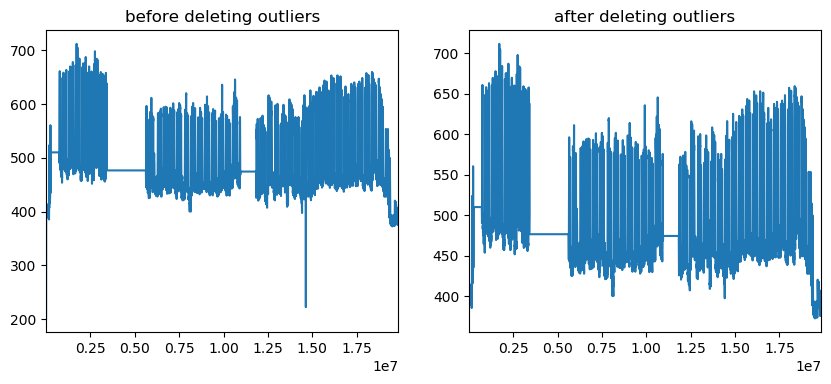

In [106]:
building_id = 115
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading < 300').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

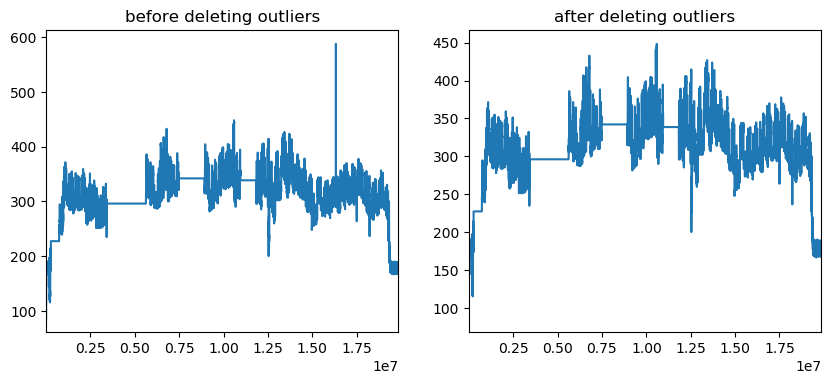

In [104]:
building_id = 110
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 500').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

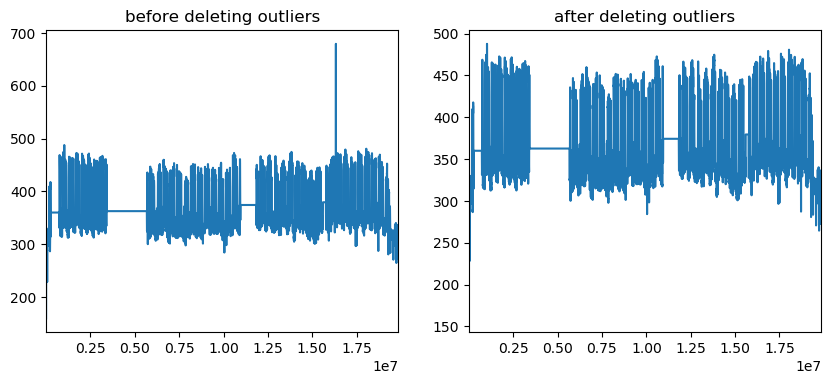

In [105]:
building_id = 113
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 600').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

In [107]:
train_df.loc[train_df.query('building_id == 115 and meter == 0 and meter_reading < 300').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 110 and meter == 0 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 113 and meter == 0 and meter_reading > 600').index, 'IsFiltered'] = 1

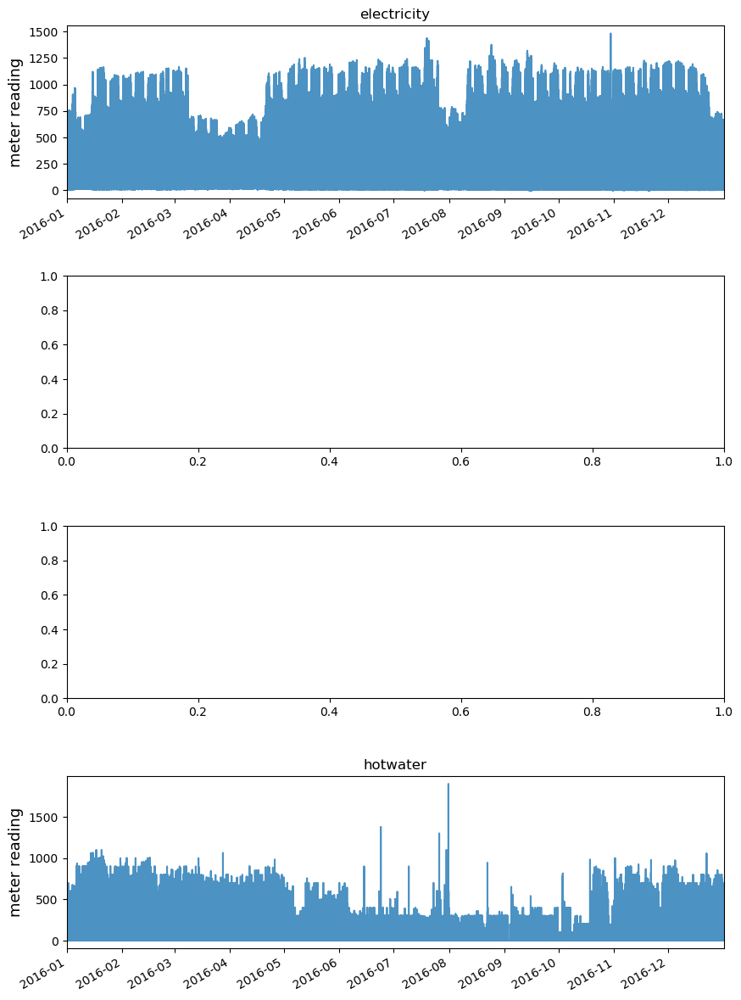

In [108]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(1)

## Site 2

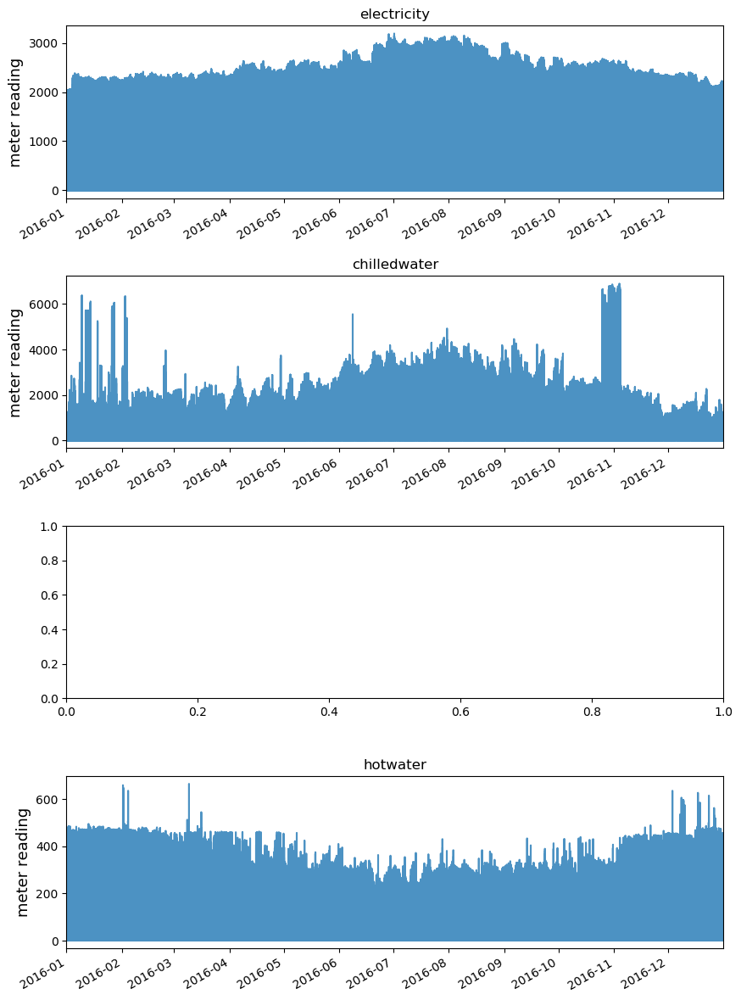

In [111]:
site_plot(2)

In [112]:
site_buildings.unique()[2]

array([156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181,
       182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194,
       195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207,
       208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220,
       221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233,
       234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246,
       247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259,
       260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272,
       273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285,
       286, 287, 288, 289, 290])

### Meter 0

In [113]:
print('[Site 2 - Electricity] Filtering leading constant values')
site2_meter0_thresholds = {
    40: [278],
    100: [177, 258, 269],
    1000: [180]
}

for threshold in site2_meter0_thresholds:
    for building_id in site2_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 2 - Electricity] Filtering leading constant values


### Meter 1

0

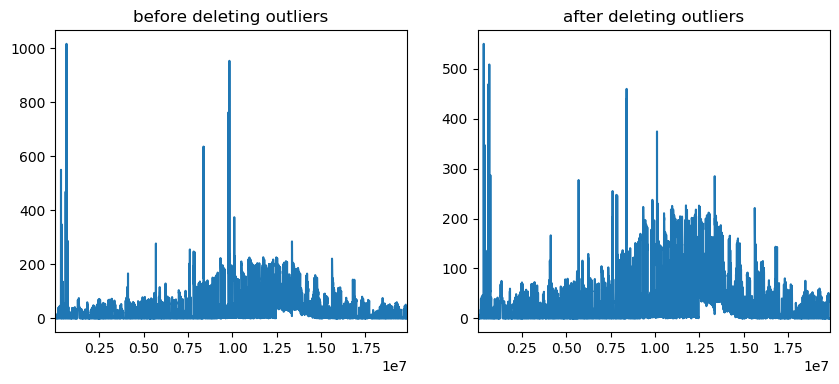

In [114]:
building_id = 187
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 600').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

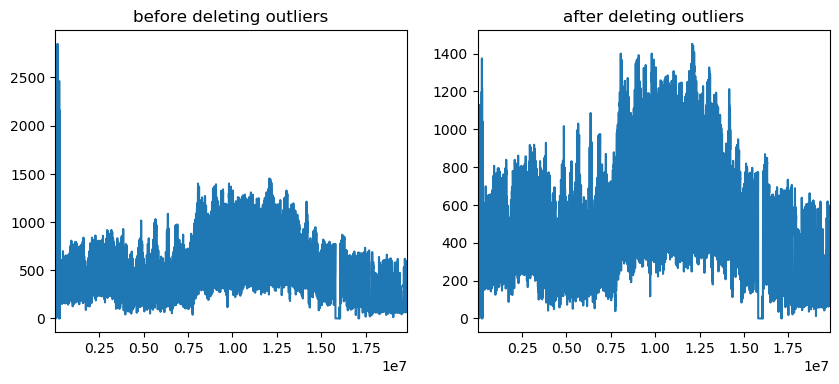

In [115]:
building_id = 254
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 1600').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

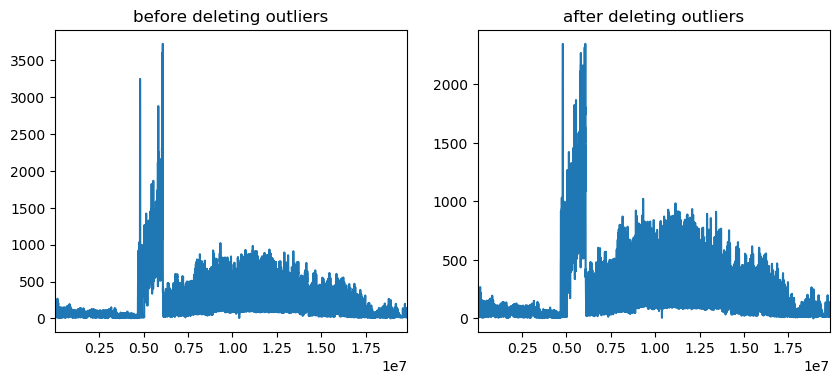

In [116]:
building_id = 273
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 2600').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

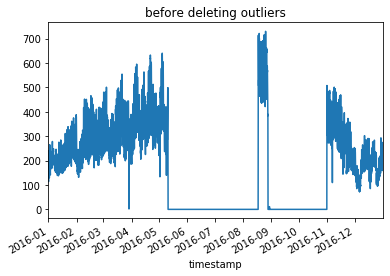

In [117]:
# 187, 254, 273
fig = plt.plot()
ax = plt.gca()
building_id = 260
meter = 1

single_building_plot(building_id, meter, ax, 'before deleting outliers')

In [118]:
train_df.loc[train_df.query('building_id == 187 and meter == 1 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 254 and meter == 1 and meter_reading > 1600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 273 and meter == 1 and meter_reading > 2600').index, 'IsFiltered'] = 1

In [119]:
print('[Site 2 - Chilled Water] Filtering leading constant values')
site2_meter1_thresholds = {
    100: [207],
    1000: [260]
}

for threshold in site2_meter1_thresholds:
    for building_id in site2_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 2 - Chilled Water] Filtering leading constant values


## Site 3

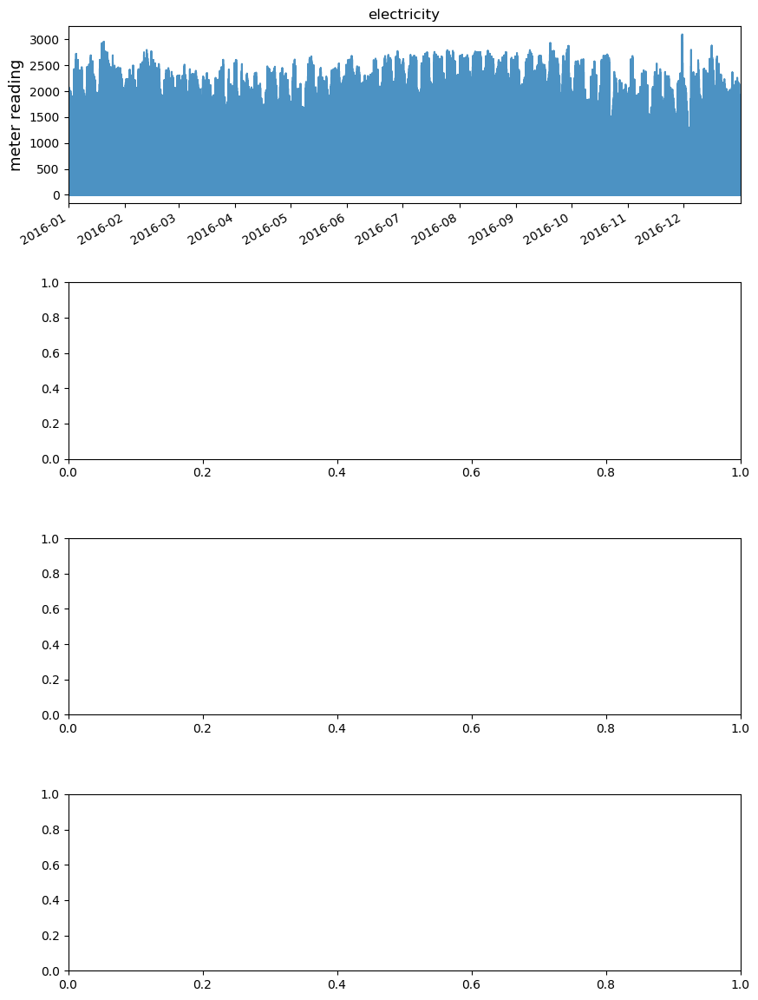

In [120]:
site_plot(3)

In [121]:
site_buildings.unique()[3]

array([291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303,
       304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316,
       317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329,
       330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342,
       343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355,
       356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368,
       369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381,
       382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394,
       395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407,
       408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420,
       421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433,
       434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446,
       447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459,
       460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 47

In [123]:
print('[Site 3 - Electricity] Filtering leading constant values')
site3_meter0_thresholds = {
    100: [545]
}

for threshold in site3_meter0_thresholds:
    for building_id in site3_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 3 - Electricity] Filtering leading constant values


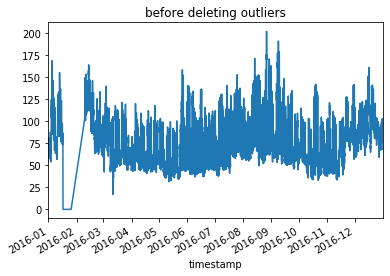

In [124]:
fig = plt.plot()
ax = plt.gca()
building_id = 545
meter = 0

single_building_plot(building_id, meter, ax, 'before deleting outliers')

## Site 4

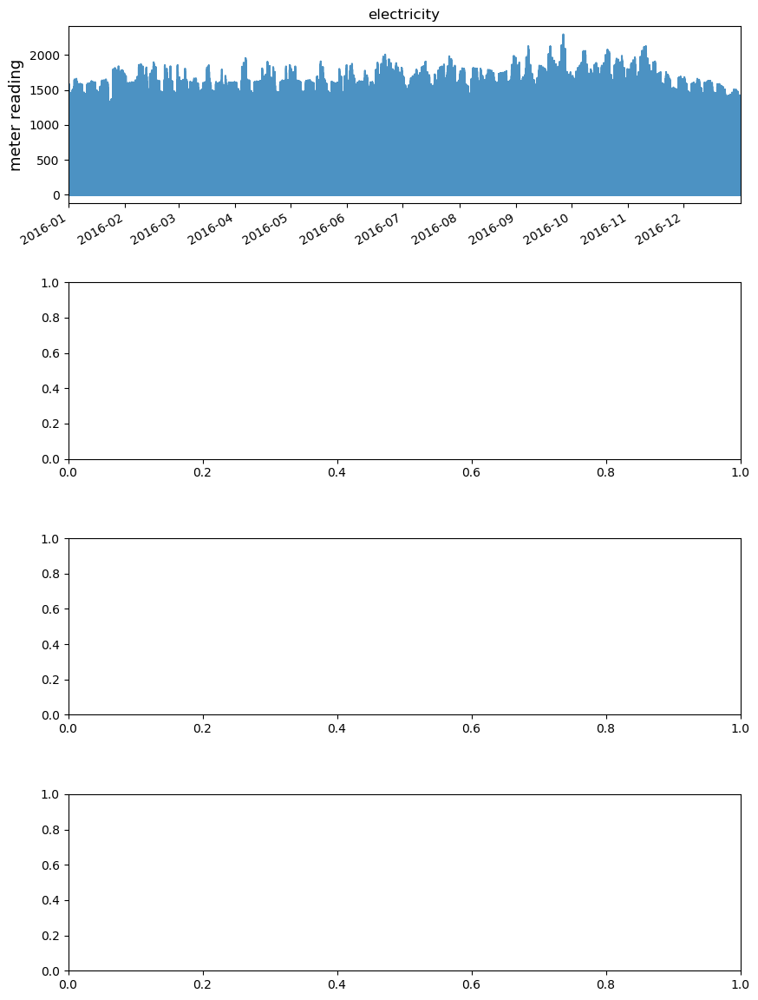

In [125]:
site_plot(4)

In [126]:
site_buildings.unique()[4]

array([565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577,
       578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590,
       591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602, 603,
       604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 614, 615, 616,
       617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 627, 628, 629,
       630, 631, 632, 633, 634, 635, 636, 637, 638, 639, 640, 641, 642,
       643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655])

0

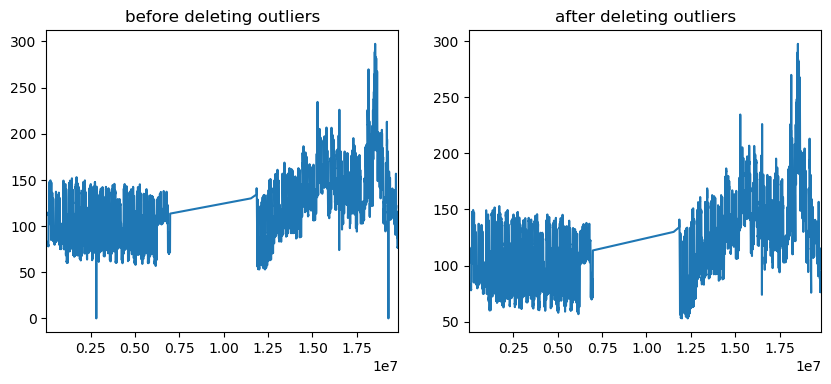

In [127]:
building_id = 626
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading < 10').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

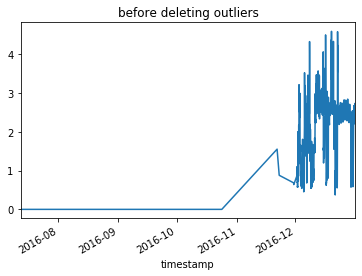

In [128]:
# 592, 609, 620, 626, 627, 632, 645
fig = plt.plot()
ax = plt.gca()
building_id = 604
meter = 0

single_building_plot(building_id, meter, ax, 'before deleting outliers')

In [129]:
print('[Site 4 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 592 and meter == 0 and meter_reading < 100').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 609 and meter == 0 and meter_reading < 300').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 620 and meter == 0 and meter_reading < 750').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 626 and meter == 0 and meter_reading < 10').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 627 and meter == 0 and meter_reading < 85').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 632 and meter == 0 and meter_reading < 30').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 645 and meter == 0 and meter_reading < 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 654 and meter == 0 and meter_reading < 40').index, 'IsFiltered'] = 1

[Site 4 - Electricity] Filtering outliers


In [130]:
print('[Site 4 - Electricity] Filtering leading constant values')
site4_meter0_thresholds = {
    100: [577, 604]
}

for threshold in site4_meter0_thresholds:
    for building_id in site4_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 4 - Electricity] Filtering leading constant values


## Site 5

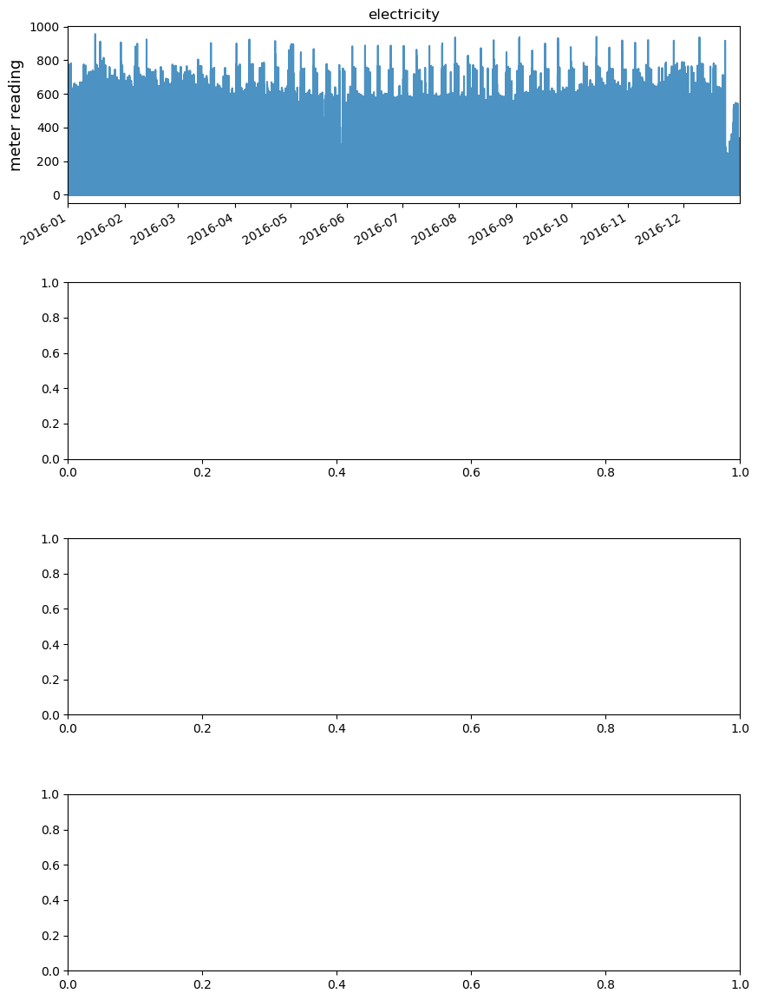

In [131]:
site_plot(5)

In [132]:
site_buildings.unique()[5]

array([656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668,
       669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681,
       682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694,
       695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707,
       708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720,
       721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733,
       734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744])

In [133]:
print('[Site 5 - Electricity] Filtering leading constant values')
site5_meter0_thresholds = {
    100: [681, 723, 733, 739],
    1000: [693]
}

for threshold in site5_meter0_thresholds:
    for building_id in site5_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 5 - Electricity] Filtering leading constant values


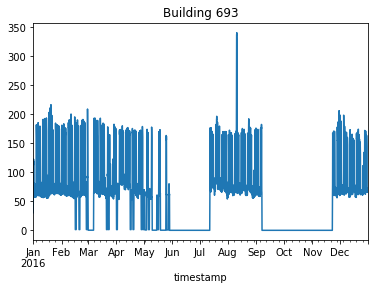

In [134]:
fig = plt.plot()
ax = plt.gca()
building_id = 693
meter = 0

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

0

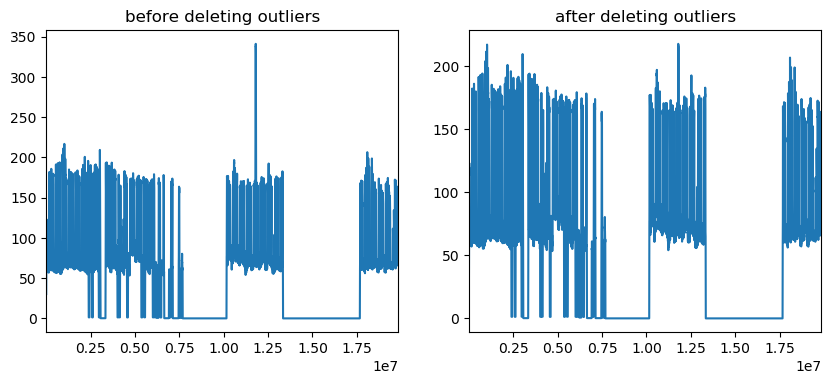

In [135]:
building_id = 693
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 250').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

In [138]:
train_df.loc[train_df.query('building_id == 693 and meter == 0 and meter_reading > 250').index, 'IsFiltered'] = 1

## Site 6

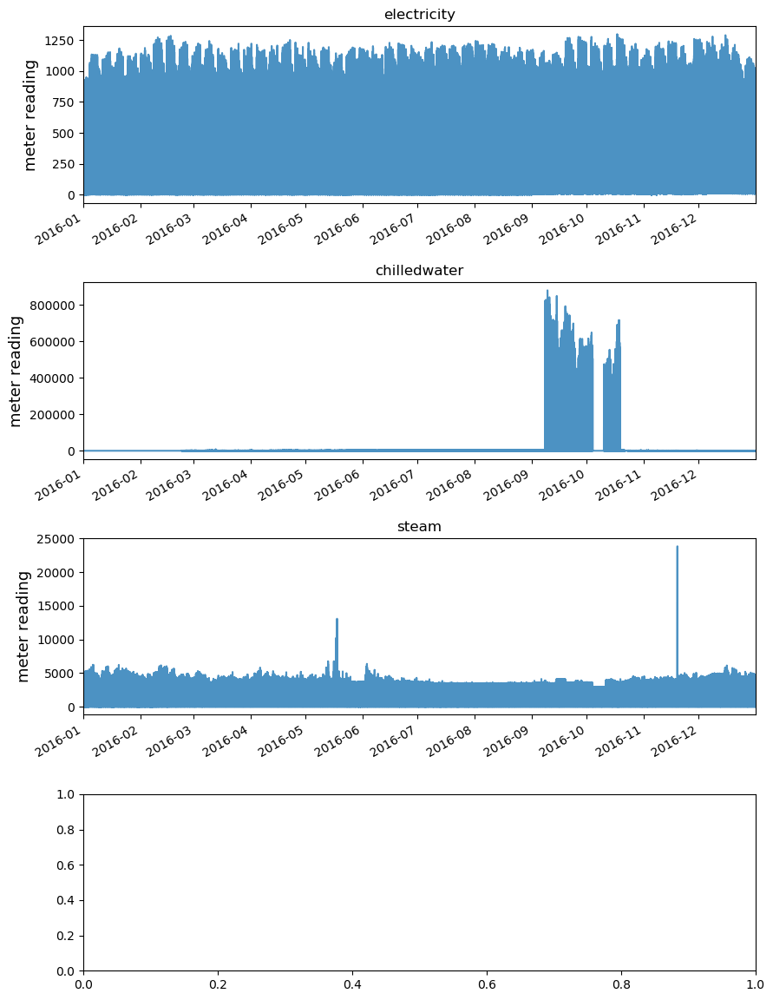

In [139]:
site_plot(6)

In [140]:
train_df.query('site_id == 6 and meter == 2 and meter_reading > 10000')

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,IsFiltered
7054750,766,2,2016-05-17 15:00:00,10175.500000,6,Office,64818,NaN,NaN,NaN
7079393,766,2,2016-05-18 02:00:00,10553.799805,6,Office,64818,NaN,NaN,NaN
7081634,766,2,2016-05-18 03:00:00,10849.599609,6,Office,64818,NaN,NaN,NaN
7083874,766,2,2016-05-18 04:00:00,13073.500000,6,Office,64818,NaN,NaN,NaN
7086114,766,2,2016-05-18 05:00:00,11343.299805,6,Office,64818,NaN,NaN,NaN
17470663,776,2,2016-11-19 10:00:00,23836.599609,6,Office,104667,NaN,NaN,NaN


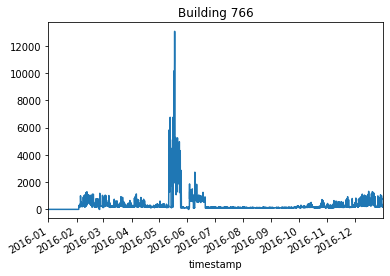

In [145]:
fig = plt.plot()
ax = plt.gca()
building_id = 766
meter = 2

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [141]:
site_buildings.unique()[6]

array([745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757,
       758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770,
       771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783,
       784, 785, 786, 787, 788])

### Meter 0

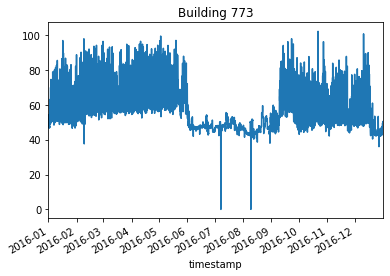

In [142]:
# 749, 
fig = plt.plot()
ax = plt.gca()
building_id = 773
meter = 0

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

0

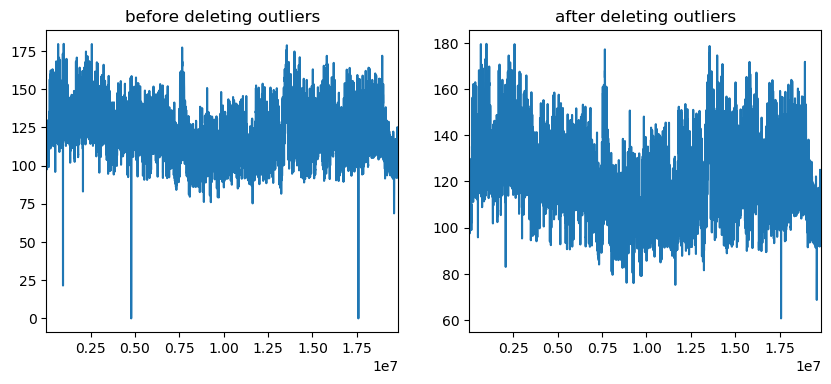

In [143]:
building_id = 781
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading < 50').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

In [146]:
train_df.loc[train_df.query('building_id == 781 and meter == 0 and meter_reading < 50').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 785 and meter == 0 and meter_reading < 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 778 and meter == 0 and meter_reading < 50').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 749 and meter == 0 and meter_reading < 10').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 758 and meter == 0 and meter_reading < 10').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 769 and meter == 0 and meter_reading < 10').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 770 and meter == 0 and meter_reading < 10').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 773 and meter == 0 and meter_reading < 10').index, 'IsFiltered'] = 1

### Meter 1

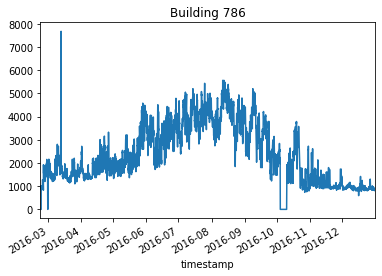

In [147]:
fig = plt.plot()
ax = plt.gca()
building_id = 786
meter = 1

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [148]:
print('[Site 6 - Chilled Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 745 and meter == 1 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 750 and meter == 1 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 753 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 755 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 765 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 769 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 770 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 771 and meter == 1 and meter_reading > 20').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 776 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 777 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 780 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 786 and meter == 1 and meter_reading > 7000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 787 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1

[Site 6 - Chilled Water] Filtering outliers


In [149]:
print('[Site 6 - Chilled Water] Filtering leading constant values')
site6_meter1_thresholds = {
    100: [748, 750, 752, 763, 767, 776, 786]
}

for threshold in site6_meter1_thresholds:
    for building_id in site6_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 6 - Chilled Water] Filtering leading constant values


### Meter 2

0

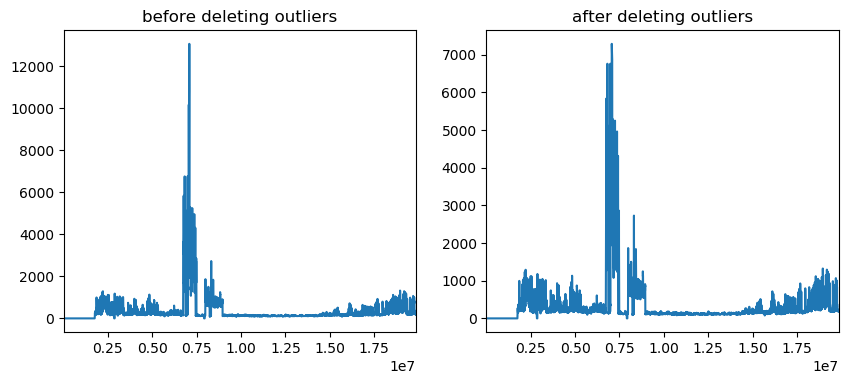

In [150]:
building_id = 766
meter = 2

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 8000').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

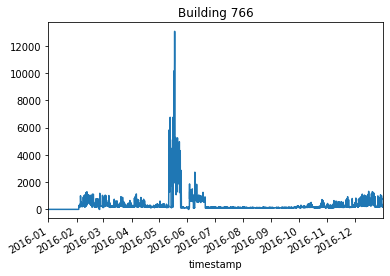

In [151]:
fig = plt.plot()
ax = plt.gca()
building_id = 766
meter = 2

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [152]:
train_df.loc[train_df.query('building_id == 745 and meter == 2 and meter_reading < 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 776 and meter == 2 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 769 and meter == 2 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 764 and meter == 2 and meter_reading < 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 762 and meter == 2 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 766 and meter == 2 and meter_reading > 8000').index, 'IsFiltered'] = 1

In [153]:
print('[Site 6 - Steam] Filtering leading constant values')
site6_meter2_thresholds = {
    150: [750, 751, 753, 770, 766],
    500: [774]
}

for threshold in site6_meter2_thresholds:
    for building_id in site6_meter2_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 2, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 6 - Steam] Filtering leading constant values


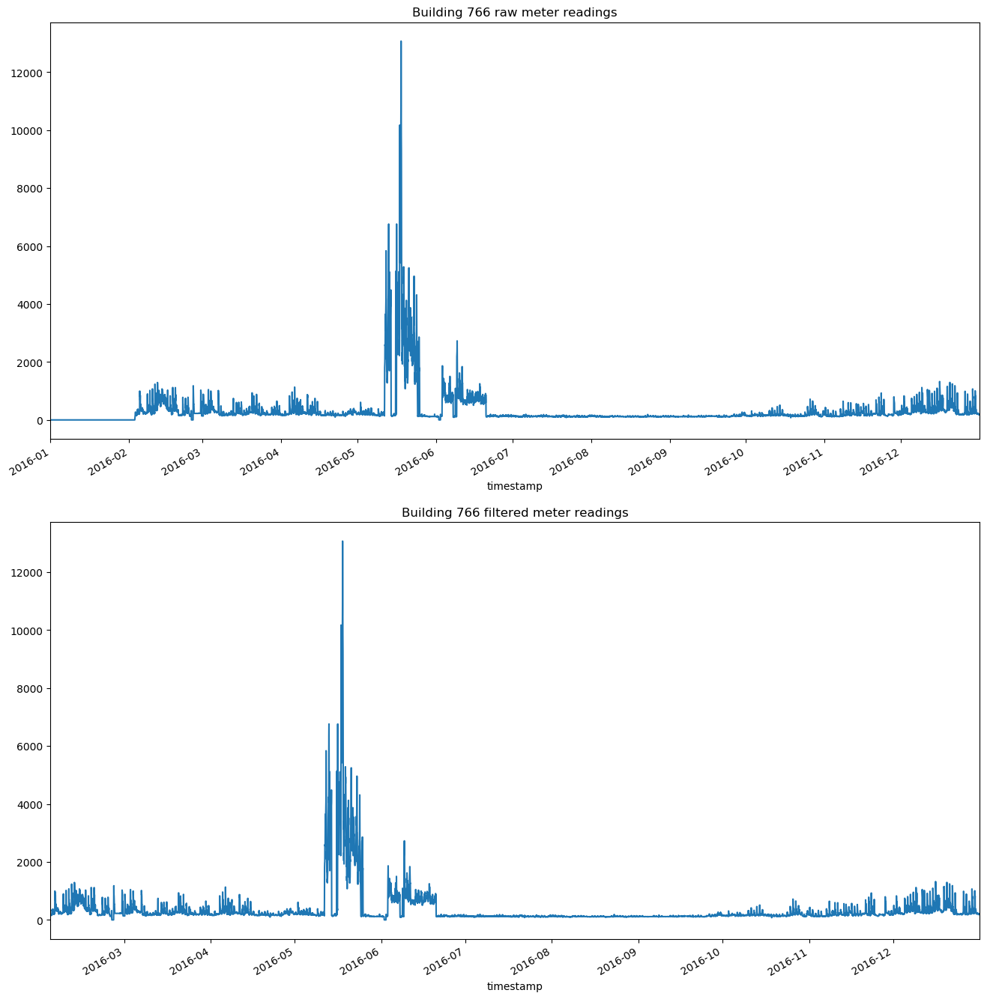

Int64Index([    822,    3016,    5206,    7399,    9589,   11779,   13968,
              16154,   18345,   20535,
            ...
            1732937, 1735138, 1737337, 1739534, 1741731, 1743930, 1746129,
            1748327, 1750517, 1752705],
           dtype='int64', length=800)

In [154]:
find_constant(766, 2, 150, plot=True)

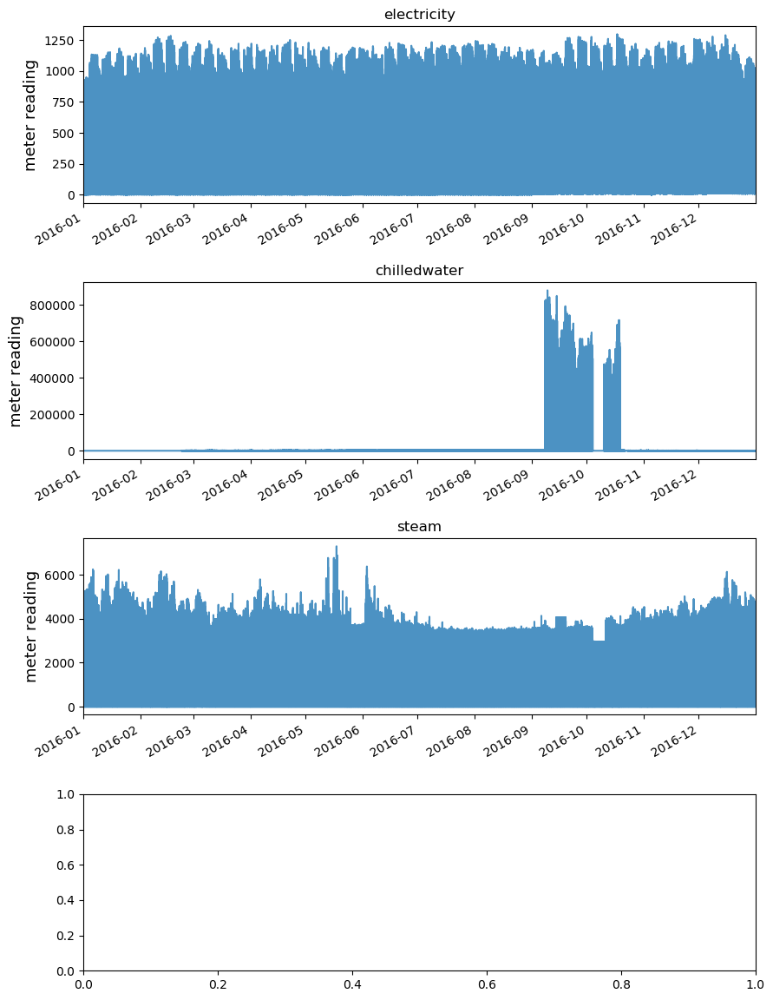

In [155]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(6)

## Site 7

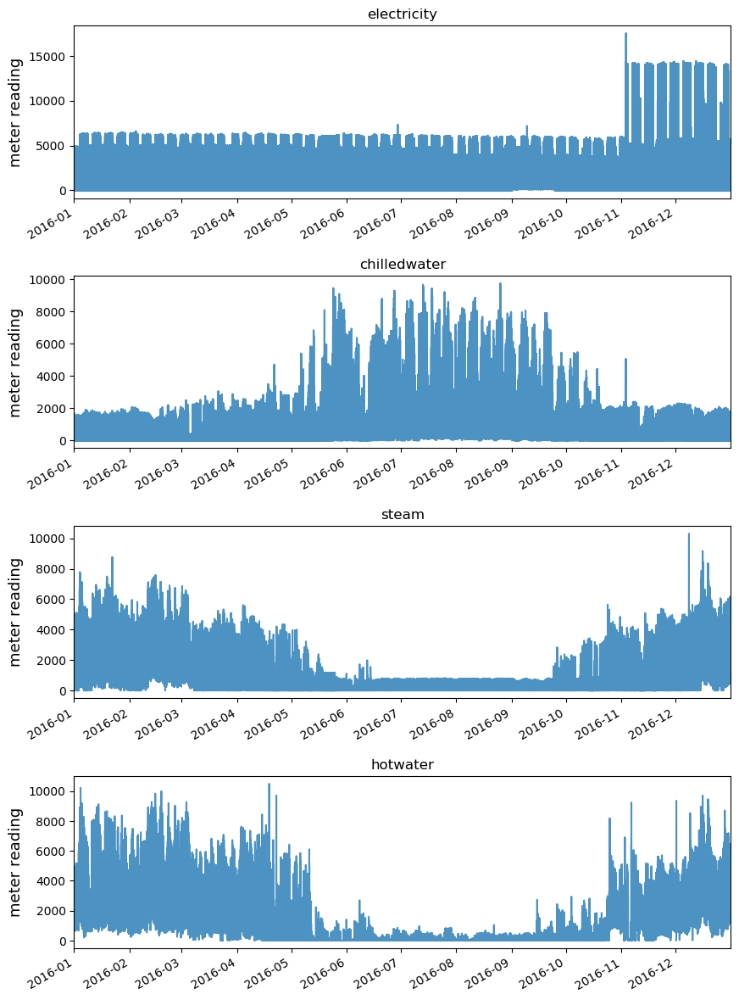

In [156]:
site_plot(7)

In [157]:
site_buildings.unique()[7]

array([789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801,
       802, 803])

### Meter 0

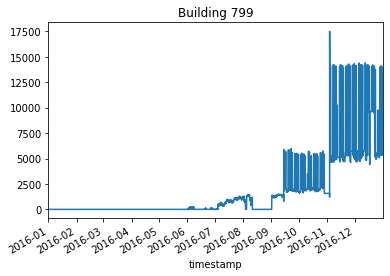

In [158]:
fig = plt.plot()
ax = plt.gca()
building_id = 799
meter = 0

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [159]:
print('[Site 7 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 800 and meter == 0 and meter_reading < 75').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 801 and meter == 0 and meter_reading < 3000').index, 'IsFiltered'] = 1

print('[Site 7 - Electricity] Filtering leading constant values')
site7_meter0_thresholds = {
    100: [799, 800, 802]
}

for threshold in site7_meter0_thresholds:
    for building_id in site7_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 7 - Electricity] Filtering outliers
[Site 7 - Electricity] Filtering leading constant values


### Meter 1

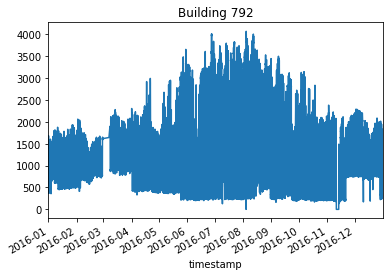

In [160]:
fig = plt.plot()
ax = plt.gca()
building_id = 792
meter = 1

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [161]:
print('[Site 7 - Chilled Water] Filtering leading constant values')
site7_meter1_thresholds = {
    50: [789, 790, 792]
}

for threshold in site7_meter1_thresholds:
    for building_id in site7_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 7 - Chilled Water] Filtering leading constant values


### Meter 2

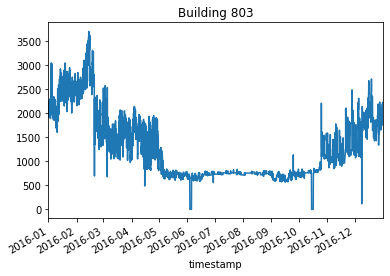

In [162]:
fig = plt.plot()
ax = plt.gca()
building_id = 803
meter = 2

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

0

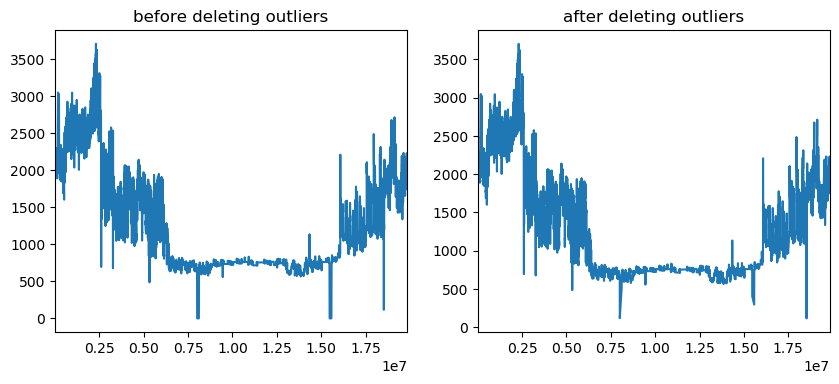

In [163]:
building_id = 803
meter = 2

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading == 0').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

In [164]:
print('[Site 7 - Steam] Filtering outliers')
train_df.loc[train_df.query('building_id == 797 and meter == 2 and meter_reading > 8000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 800 and meter == 2 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 803 and meter == 2 and meter_reading == 0').index, 'IsFiltered'] = 1

[Site 7 - Steam] Filtering outliers


In [165]:
print('[Site 7 - Steam] Filtering leading constant values')
site7_meter2_thresholds = {
    100: [800]
}

for threshold in site7_meter2_thresholds:
    for building_id in site7_meter2_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 2, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 7 - Steam] Filtering leading constant values


## Site 8

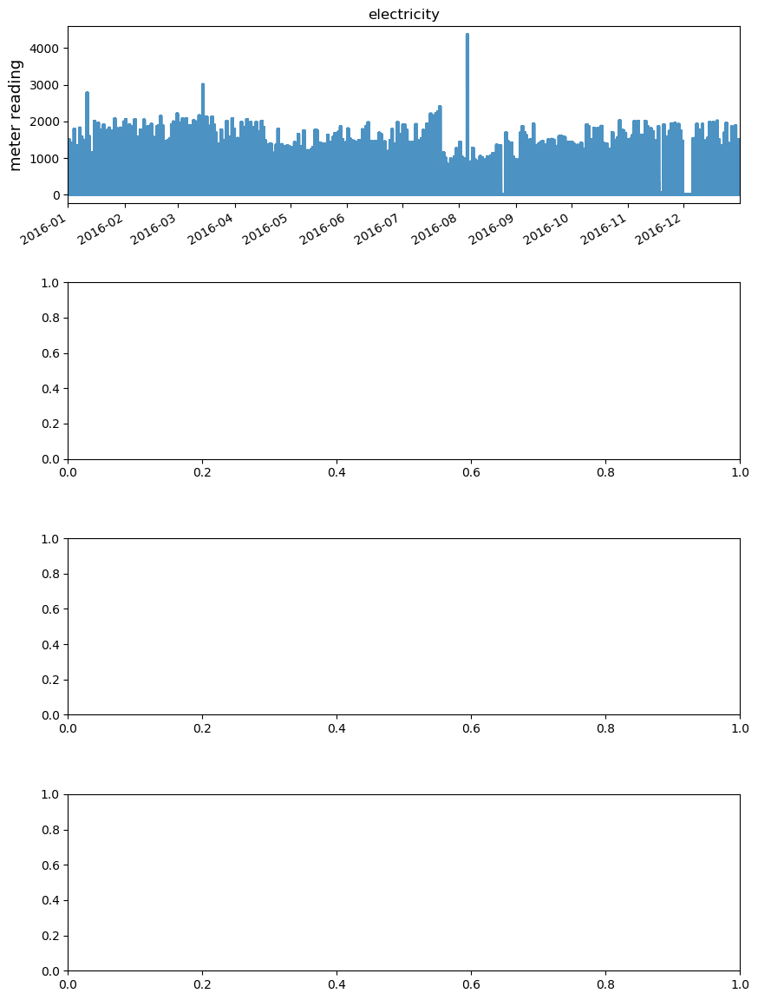

In [166]:
site_plot(8)

In [167]:
site_buildings.unique()[8]

array([804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816,
       817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829,
       830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842,
       843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855,
       856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 868,
       869, 870, 871, 872, 873])

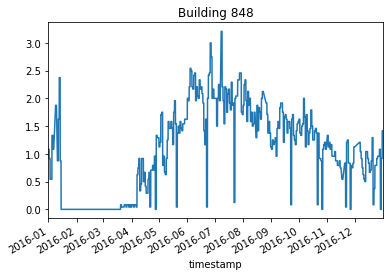

In [168]:
fig = plt.plot()
ax = plt.gca()
building_id = 848
meter = 0

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

0

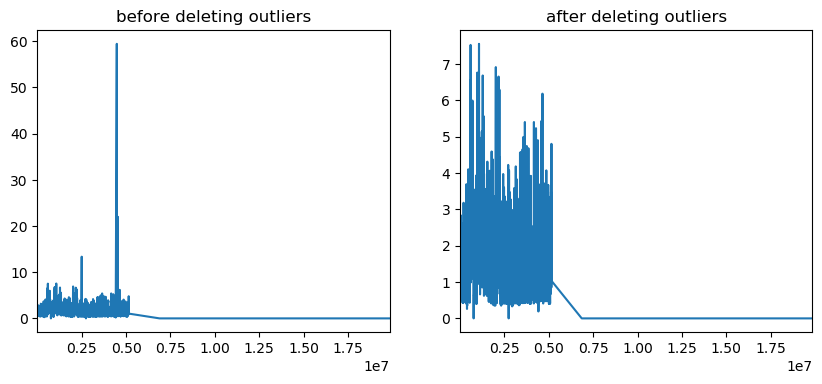

In [169]:
building_id = 857
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 10').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

In [170]:
print('[Site 8 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 857 and meter == 0 and meter_reading > 10').index, 'IsFiltered'] = 1

[Site 8 - Electricity] Filtering outliers


In [171]:
print('[Site 8 - Electricity] Filtering leading constant values')
site8_meter0_thresholds = {
    1000: [815, 848]
}

for threshold in site8_meter0_thresholds:
    for building_id in site8_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 8 - Electricity] Filtering leading constant values


## Site 9

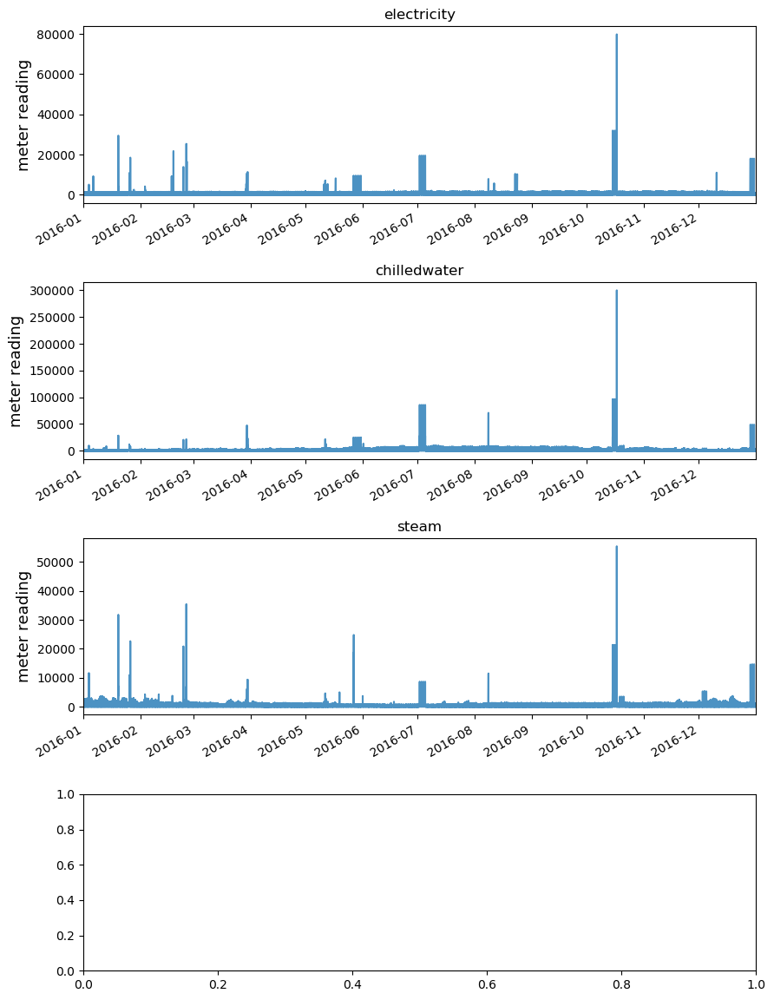

In [172]:
site_plot(9)

In [173]:
site_buildings.unique()[9]

array([874, 875, 876, 877, 878, 879, 880, 881, 882, 883, 884, 885, 886,
       887, 888, 889, 890, 891, 892, 893, 894, 895, 896, 897, 898, 899,
       900, 901, 902, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912,
       913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925,
       926, 927, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938,
       939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951,
       952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964,
       965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977,
       978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990,
       991, 992, 993, 994, 995, 996, 997])

0

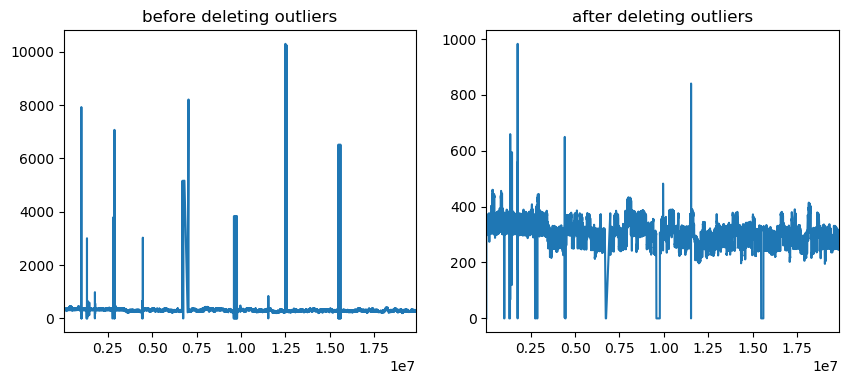

In [174]:
building_id = 983
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 2000').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

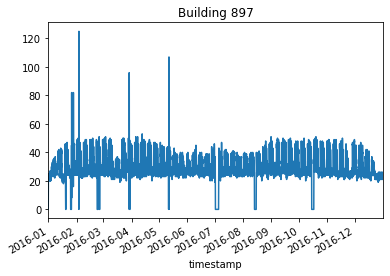

In [175]:
fig = plt.plot()
ax = plt.gca()
building_id = 897
meter = 0

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [176]:
print('[Site 9 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 886 and meter == 0 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 904 and meter == 0 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 921 and meter == 0 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 927 and meter == 0 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 949 and meter == 0 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 954 and meter == 0 and meter_reading > 6000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 955 and meter == 0 and meter_reading > 4000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 956 and meter == 0 and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 961 and meter == 0 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 962 and meter == 0 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 966 and meter == 0 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 977 and meter == 0 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 983 and meter == 0 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 986 and meter == 0 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 990 and meter == 0 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 993 and meter == 0 and meter_reading > 6000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 997 and meter == 0 and meter_reading > 500').index, 'IsFiltered'] = 1

[Site 9 - Electricity] Filtering outliers


In [177]:
print('[Site 9 - Electricity] Filtering leading constant values')
site9_meter0_thresholds = {
    40: [897],
    50: [874, 875, 876, 877, 878, 879, 880, 881, 882, 883, 884, 885, 886, 887, 888, 889, 890, 891, 892, 893, 894, 895, 896, 898, 899,
         900, 901, 902, 903, 904, 905, 906, 907, 908, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925,
         926, 927, 928, 929, 930, 931, 932, 935, 936, 937, 938, 939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951, 952,
         953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977,
         978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997],
    100: [909],
}

for threshold in site9_meter0_thresholds:
    for building_id in site9_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 9 - Electricity] Filtering leading constant values


### Meter 1

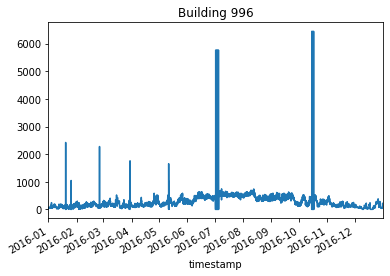

In [178]:
fig = plt.plot()
ax = plt.gca()
building_id = 996
meter = 1

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [179]:
print('[Site 9 - Chilled Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 879 and meter == 1 and meter_reading > 8000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 880 and meter == 1 and meter_reading > 8000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 885 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 891 and meter == 1 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 900 and meter == 1 and meter_reading > 5000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 903 and meter == 1 and meter_reading > 20000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 906 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 907 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 908 and meter == 1 and meter_reading > 2500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 910 and meter == 1 and meter_reading > 4000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 920 and meter == 1 and meter_reading > 4000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 923 and meter == 1 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 925 and meter == 1 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 926 and meter == 1 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 927 and meter == 1 and meter_reading > 5000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 929 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 931 and meter == 1 and meter_reading > 6000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 934 and meter == 1 and meter_reading > 2500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 946 and meter == 1 and meter_reading > 10000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 948 and meter == 1 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 949 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 954 and meter == 1 and meter_reading > 50000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 955 and meter == 1 and meter_reading > 10000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 956 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 957 and meter == 1 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 961 and meter == 1 and meter_reading > 8000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 963 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 964 and meter == 1 and meter_reading > 5000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 965 and meter == 1 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 967 and meter == 1 and meter_reading > 1750').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 969 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 973 and meter == 1 and meter_reading > 2500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 976 and meter == 1 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 978 and meter == 1 and meter_reading > 4000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 983 and meter == 1 and meter_reading > 3800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 989 and meter == 1 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 990 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 993 and meter == 1 and meter_reading > 10000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 994 and meter == 1 and meter_reading > 2500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 996 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1

[Site 9 - Chilled Water] Filtering outliers


In [180]:
print('[Site 9 - Chilled Water] Filtering leading constant values')
site9_meter1_thresholds = {
    50: [874, 875, 879, 880, 883, 885, 886, 887, 888, 889, 890, 891, 893, 894, 895, 896, 898, 899, 900, 901, 903, 905, 906, 907, 908,
         910, 911, 912, 913, 914, 915, 916, 917, 918, 920, 921, 922, 923, 924, 925, 926, 927, 928, 929, 931, 932, 933, 934, 935, 942,
         945, 946, 948, 949, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 971, 972,
         973, 974, 975, 976, 978, 979, 980, 981, 983, 987, 989, 990, 991, 992, 993, 994, 995, 996, 997]
}

for threshold in site9_meter1_thresholds:
    for building_id in site9_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 9 - Chilled Water] Filtering leading constant values


### Meter 2

0

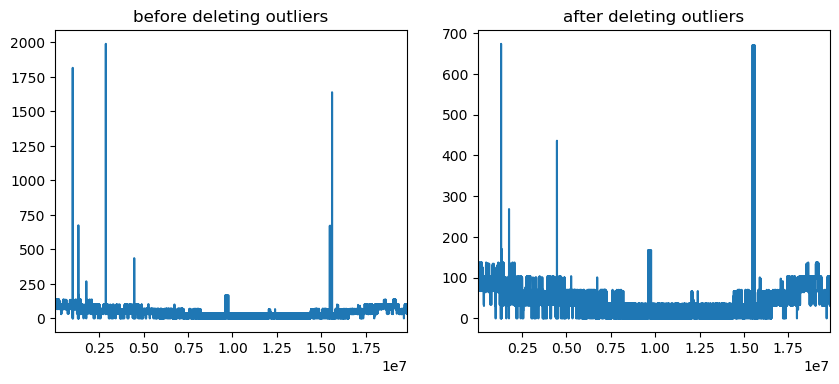

In [181]:
building_id = 898
meter = 2

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and meter_reading > 1500').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

In [182]:
print('[Site 9 - Steam] Filtering outliers')
train_df.loc[train_df.query('building_id == 875 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 876 and meter == 2 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 878 and meter == 2 and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 879 and meter == 2 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 880 and meter == 2 and meter_reading > 1200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 880 and meter == 2 and meter_reading > 600 and ("2016-06-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 885 and meter == 2 and meter_reading > 250').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 886 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 886 and meter == 2 and meter_reading > 300 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 887 and meter == 2 and meter_reading > 325').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 888 and meter == 2 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 889 and meter == 2 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 890 and meter == 2 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 894 and meter == 2 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 895 and meter == 2 and meter_reading > 400').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 896 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 896 and meter == 2 and meter_reading > 400 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 898 and meter == 2 and meter_reading > 150 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 898 and meter == 2 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 899 and meter == 2 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 899 and meter == 2 and meter_reading > 800 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 900 and meter == 2 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 901 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 903 and meter == 2 and meter_reading > 2400').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 905 and meter == 2 and meter_reading > 140').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 906 and meter == 2 and meter_reading > 400').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 907 and meter == 2 and meter_reading > 300').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 907 and meter == 2 and meter_reading > 200 and ("2016-07-01" < timestamp < "2016-08-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 908 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 908 and meter == 2 and meter_reading > 300 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 910 and meter == 2 and meter_reading > 300 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 911 and meter == 2 and meter_reading > 1250').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 912 and meter == 2 and meter_reading > 120').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 912 and meter == 2 and meter_reading > 90 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 913 and meter == 2 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 914 and meter == 2 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 915 and meter == 2 and meter_reading > 750').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 915 and meter == 2 and meter_reading > 185 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 916 and meter == 2 and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 917 and meter == 2 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 918 and meter == 2 and meter_reading > 300').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 920 and meter == 2 and meter_reading > 490').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 921 and meter == 2 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 922 and meter == 2 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 922 and meter == 2 and meter_reading > 200 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 924 and meter == 2 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 926 and meter == 2 and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 926 and meter == 2 and meter_reading > 70 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 927 and meter == 2 and meter_reading > 4000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 928 and meter == 2 and meter_reading > 1250').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 929 and meter == 2 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 931 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 931 and meter == 2 and meter_reading > 400 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 932 and meter == 2 and meter_reading > 1750').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 933 and meter == 2 and meter_reading > 75').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 934 and meter == 2 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 942 and meter == 2 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 945 and meter == 2 and meter_reading > 1200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 946 and meter == 2 and meter_reading > 1200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 948 and meter == 2 and meter_reading > 120').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 949 and meter == 2 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 951 and meter == 2 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 952 and meter == 2 and meter_reading > 1600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 953 and meter == 2 and meter_reading > 1250').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 954 and meter == 2 and meter_reading > 10000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 955 and meter == 2 and meter_reading > 1750').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 956 and meter == 2 and meter_reading > 350').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 957 and meter == 2 and meter_reading > 1200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 957 and meter == 2 and meter_reading > 350 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 958 and meter == 2 and meter_reading > 1200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 959 and meter == 2 and meter_reading > 2500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 960 and meter == 2 and meter_reading > 350').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 960 and meter == 2 and meter_reading > 100 and ("2016-07-01" < timestamp < "2016-11-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 961 and meter == 2 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 963 and meter == 2 and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 964 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 965 and meter == 2 and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 966 and meter == 2 and meter_reading > 1750').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 966 and meter == 2 and meter_reading > 500 and ("2016-07-01" < timestamp < "2016-08-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 967 and meter == 2 and meter_reading > 575').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 968 and meter == 2 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 969 and meter == 2 and meter_reading > 700').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 969 and meter == 2 and meter_reading > 400 and ("2016-07-01" < timestamp < "2016-08-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 971 and meter == 2 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 972 and meter == 2 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 973 and meter == 2 and meter_reading > 450').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 974 and meter == 2 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 976 and meter == 2 and meter_reading > 60').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 978 and meter == 2 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 978 and meter == 2 and meter_reading > 1250 and ("2016-07-01" < timestamp < "2016-08-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 980 and meter == 2 and meter_reading > 150').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 981 and meter == 2 and meter_reading > 400').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 983 and meter == 2 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 983 and meter == 2 and meter_reading > 1750 and ("2016-05-01" < timestamp < "2016-08-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 987 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 989 and meter == 2 and meter_reading > 400').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 991 and meter == 2 and meter_reading > 400').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 991 and meter == 2 and meter_reading > 200 and ("2016-06-01" < timestamp < "2016-08-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 992 and meter == 2 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 993 and meter == 2 and meter_reading > 6000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 994 and meter == 2 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 995 and meter == 2 and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 996 and meter == 2 and meter_reading > 260').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 997 and meter == 2 and meter_reading > 300').index, 'IsFiltered'] = 1
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)

[Site 9 - Steam] Filtering outliers


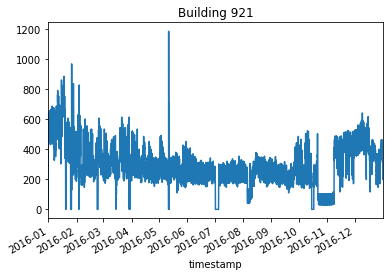

In [183]:
fig = plt.plot()
ax = plt.gca()
building_id = 921
meter = 2

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [184]:
print('[Site 9 - Steam] Filtering leading constant values')
site9_meter2_thresholds = {
    40: [889, 910, 934, 955, 962, 974, 976],
    50: [874, 875, 876, 878, 879, 880, 885, 886, 887, 888, 890, 894, 895, 896, 898, 901, 903, 905, 906, 907, 908, 911, 912, 913, 914, 915, 916, 917, 918, 920, 921,
         922, 924, 925, 926, 927, 928, 929, 931, 932, 933, 942, 945, 946, 948, 949, 951, 952, 953, 954, 956, 957, 958, 959, 960, 961, 963, 964, 965, 966, 967, 968, 
         969, 971, 972, 973, 978, 979, 980, 981, 983, 987, 989, 991, 992, 993, 994, 995, 996, 997]
}

for threshold in site9_meter2_thresholds:
    for building_id in site9_meter2_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 2, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 9 - Steam] Filtering leading constant values


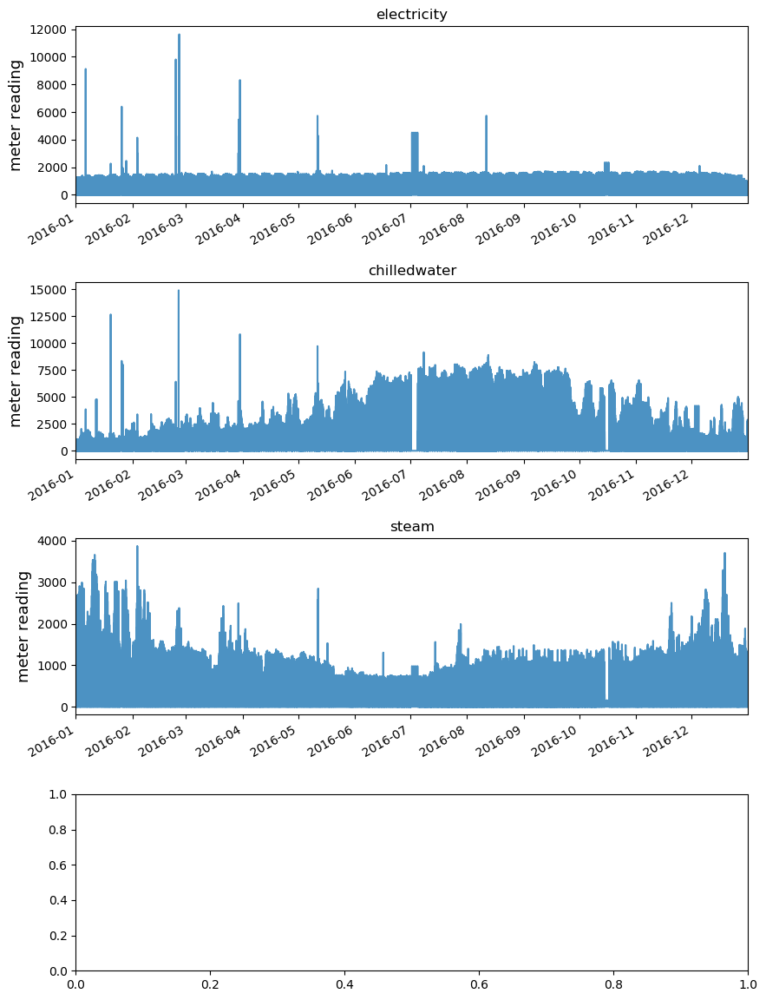

In [185]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(9)

In [196]:
train_df.query('site_id == 9 and meter == 0 and meter_reading > 4000')['building_id'].unique()

array([881, 903, 993, 975, 929, 883], dtype=uint64)

0

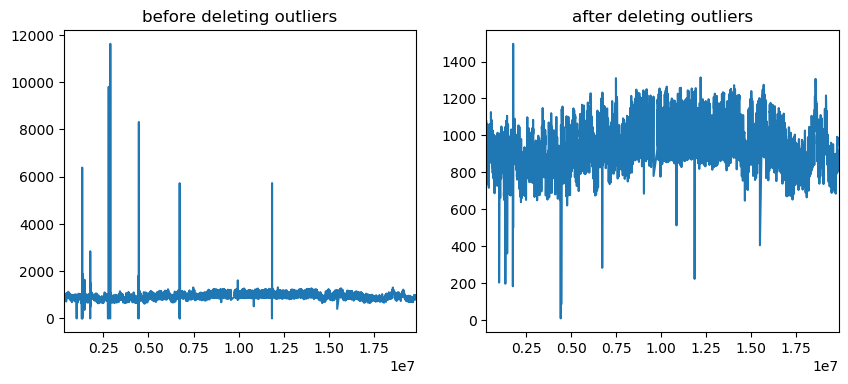

In [194]:
building_id = 881
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

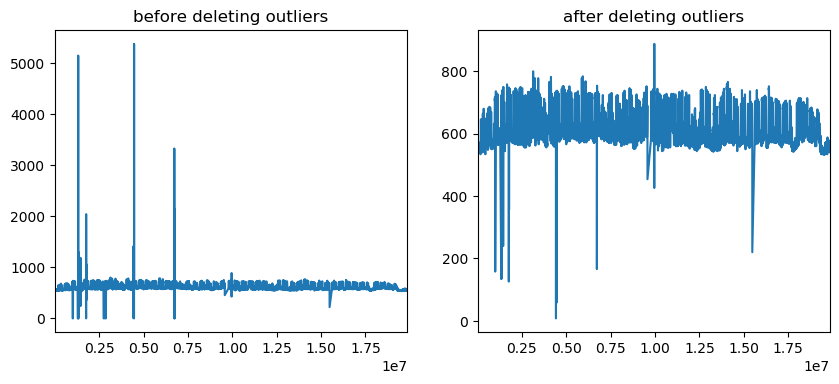

In [199]:
building_id = 903
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

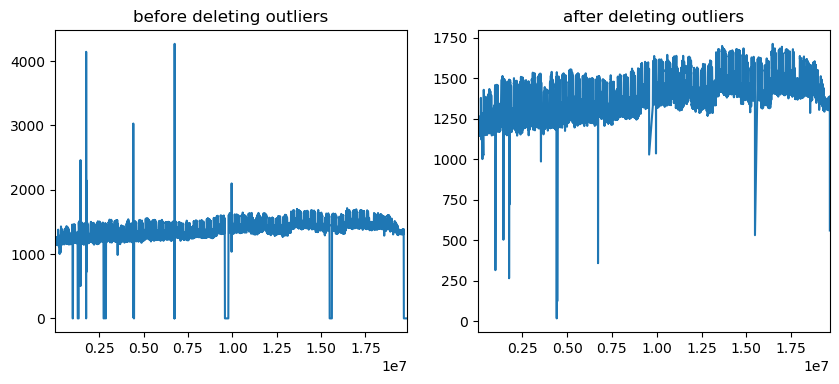

In [201]:
building_id = 993
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

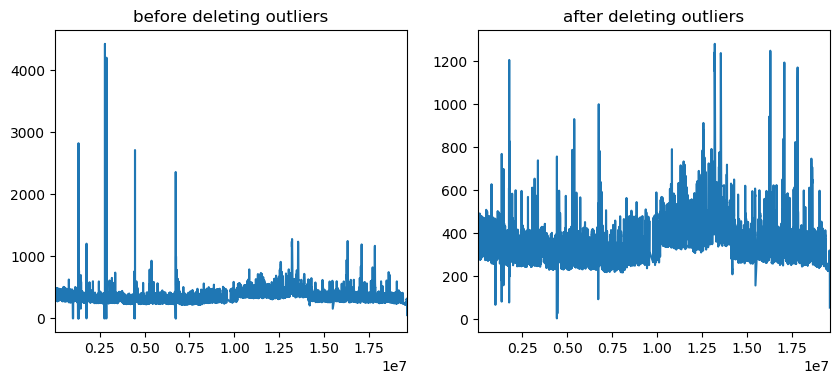

In [204]:
building_id = 975
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

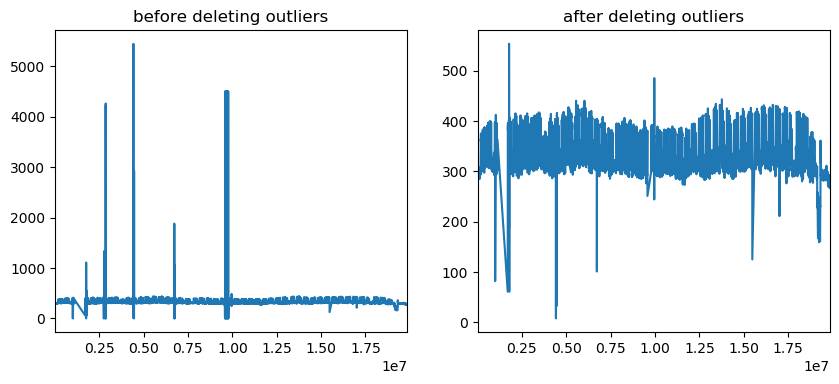

In [209]:
building_id = 929
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 600 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

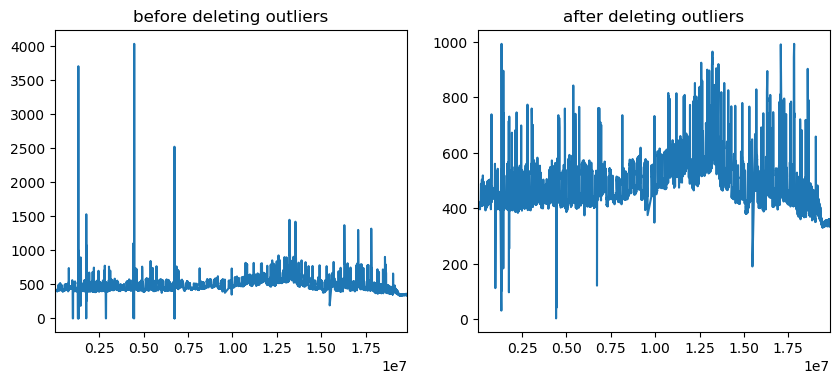

In [212]:
building_id = 883
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

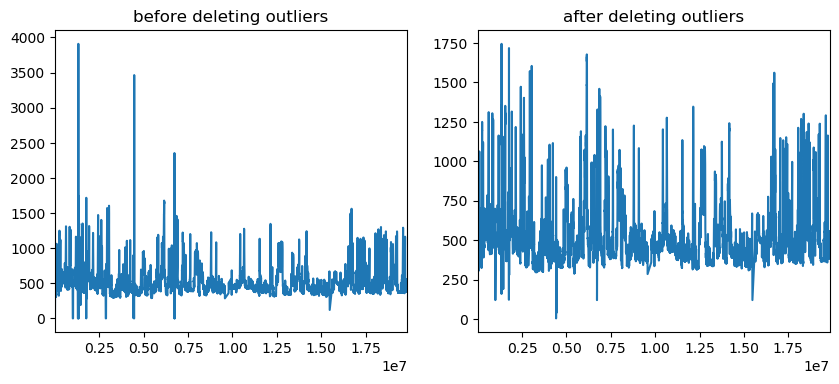

In [225]:
building_id = 913
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

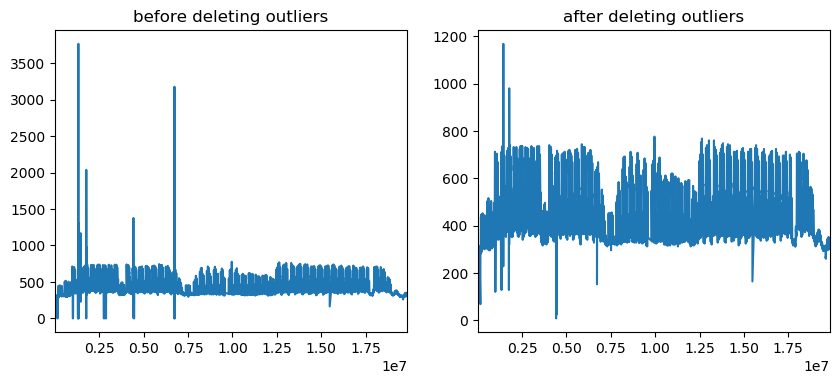

In [228]:
building_id = 928
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1200 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

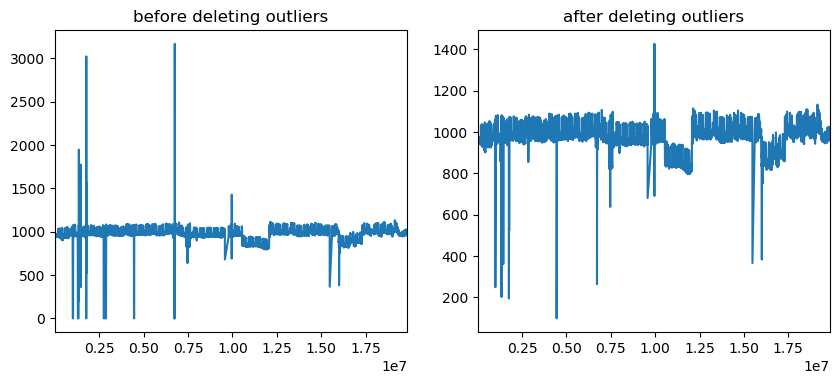

In [230]:
building_id = 955
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

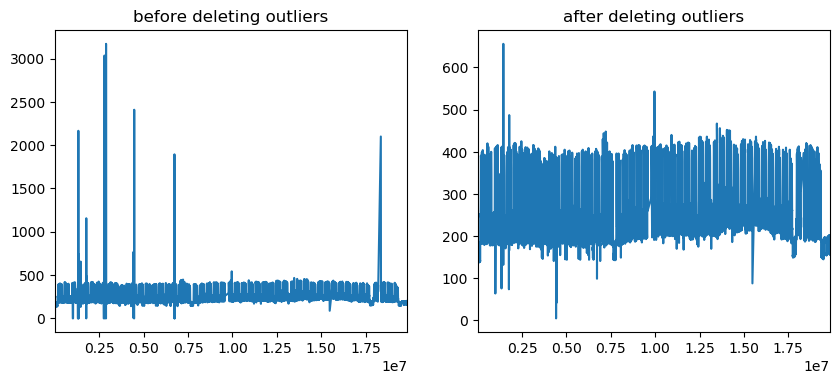

In [233]:
building_id = 945
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 700 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

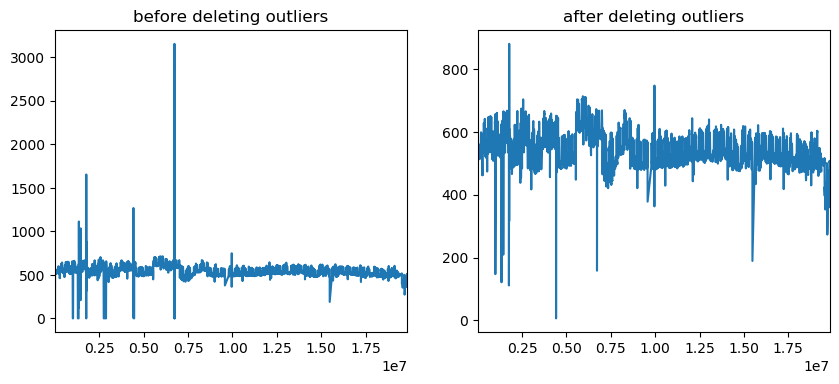

In [236]:
building_id = 946
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

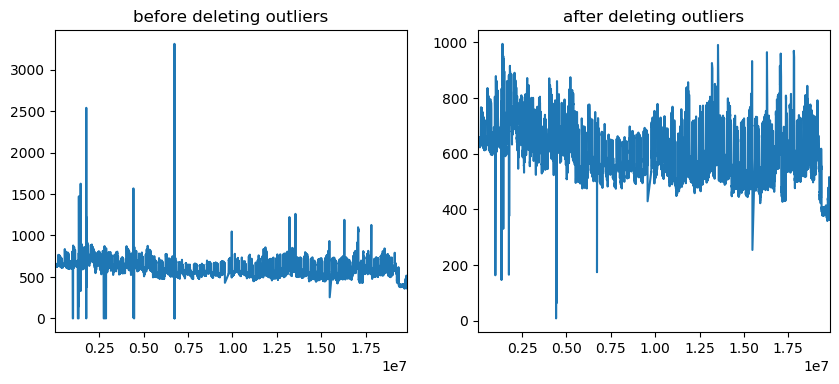

In [237]:
building_id = 953
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

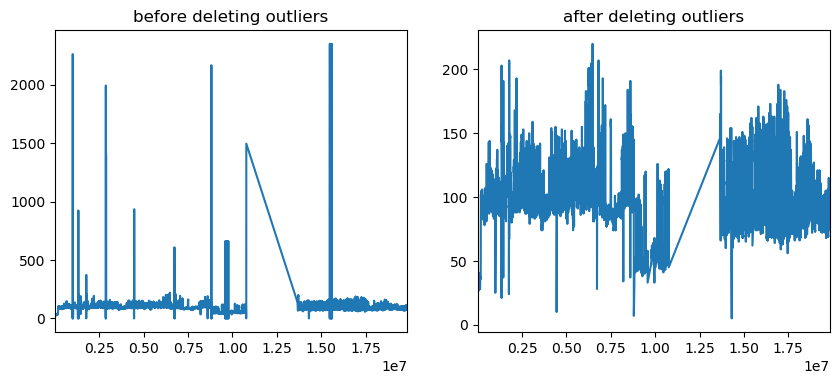

In [244]:
building_id = 994
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 250 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

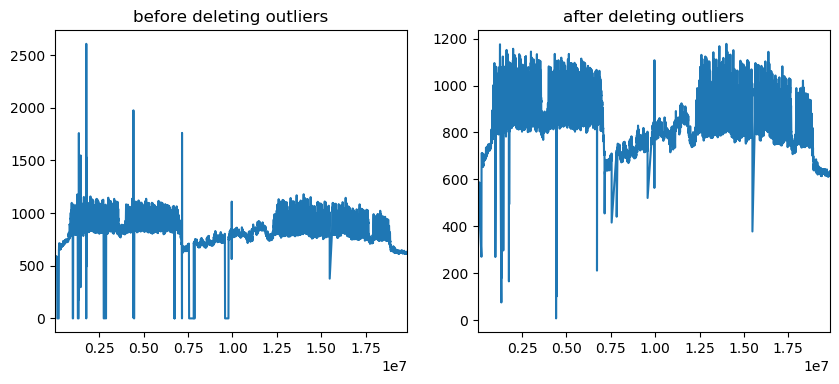

In [246]:
building_id = 927
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

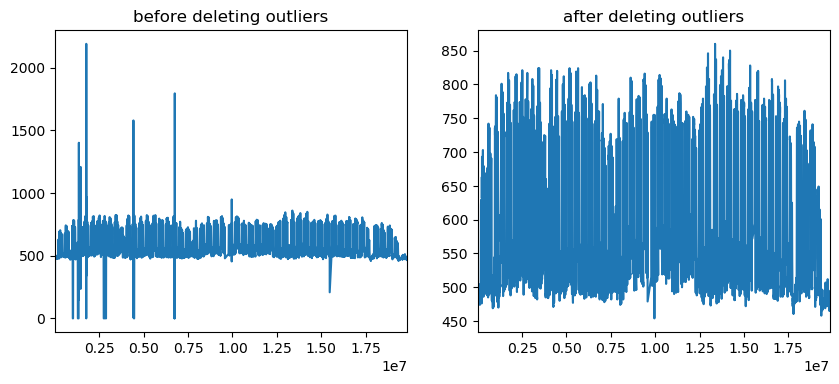

In [251]:
building_id = 966
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 900 or meter_reading < 400)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

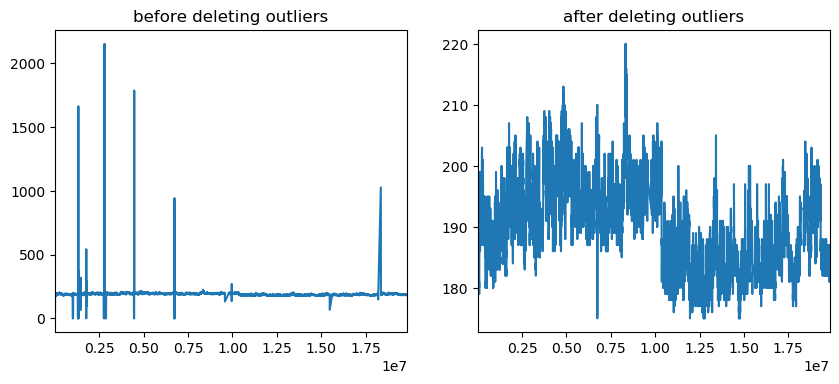

In [255]:
building_id = 902
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 250  or meter_reading < 170)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

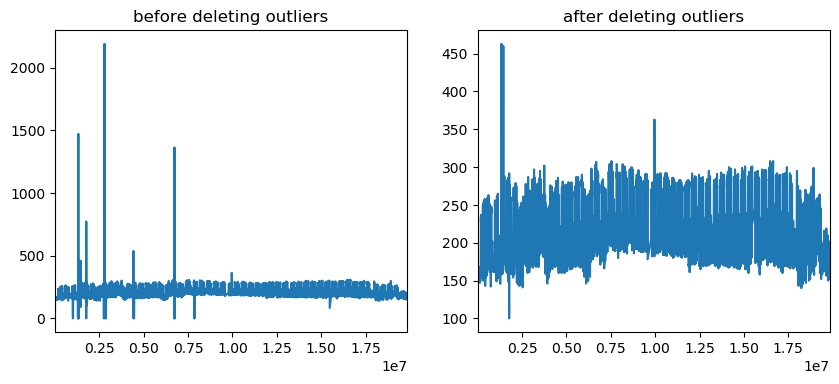

In [258]:
building_id = 924
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 500  or meter_reading < 100)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

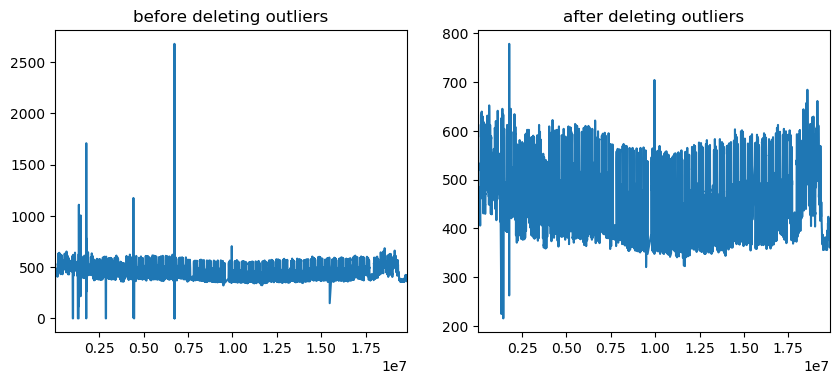

In [261]:
building_id = 874
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1000  or meter_reading < 200)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

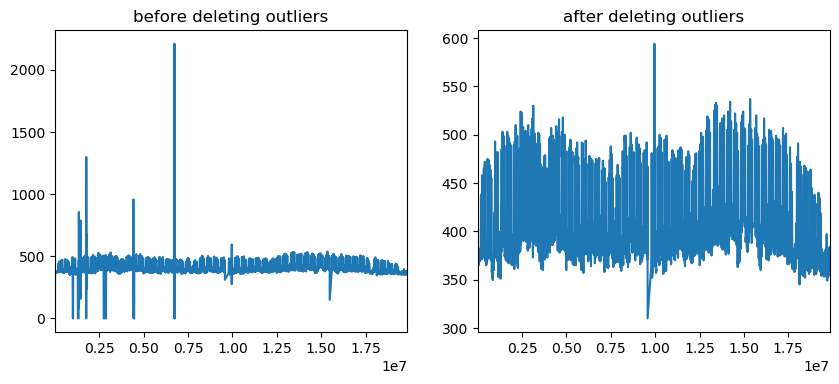

In [265]:
building_id = 890
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 600  or meter_reading < 300)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

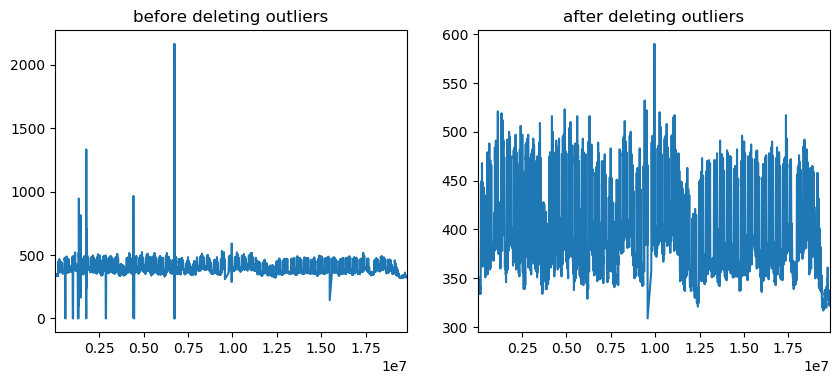

In [270]:
building_id = 914
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 600  or meter_reading < 300)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

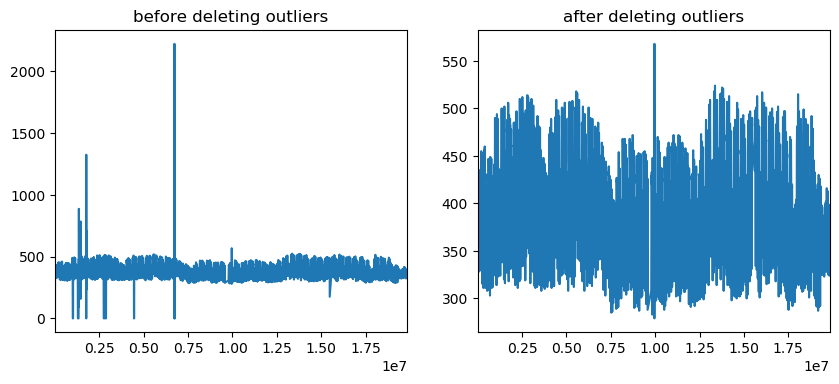

In [275]:
building_id = 917
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 600  or meter_reading < 250)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

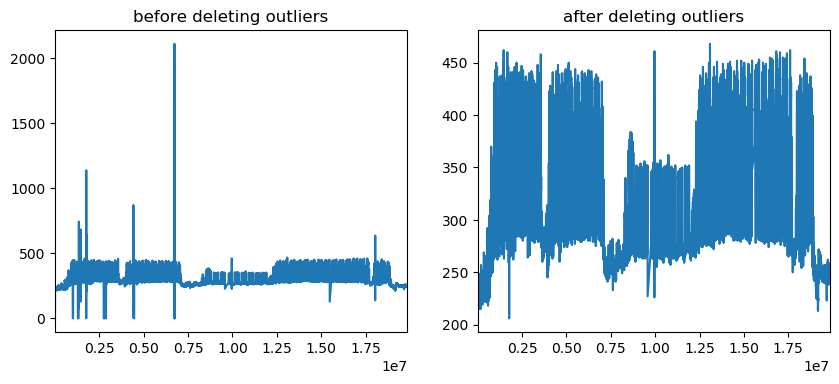

In [278]:
building_id = 932
meter = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 500  or meter_reading < 200)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

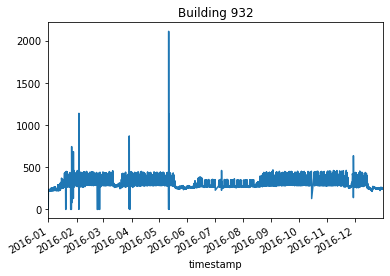

In [274]:
# [913, 928, 955, 945, 946, 953] > 3000
# [994, 927, 966, 902, 924, 874, 890, 914, 917, 932] > 2000
fig = plt.plot()
ax = plt.gca()
building_id = 932
meter = 0

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [279]:
train_df.loc[train_df.query('building_id == 881 and meter == 0 and (meter_reading > 1500 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 903 and meter == 0 and (meter_reading > 1000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 993 and meter == 0 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 975 and meter == 0 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 929 and meter == 0 and (meter_reading > 600 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 883 and meter == 0 and (meter_reading > 1000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 913 and meter == 0 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 928 and meter == 0 and (meter_reading > 1200 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 955 and meter == 0 and (meter_reading > 1500 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 945 and meter == 0 and (meter_reading > 700 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 946 and meter == 0 and (meter_reading > 1000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 953 and meter == 0 and (meter_reading > 1000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 994 and meter == 0 and (meter_reading > 250 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 927 and meter == 0 and (meter_reading > 1500 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 966 and meter == 0 and (meter_reading > 900 or meter_reading < 400)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 902 and meter == 0 and (meter_reading > 250  or meter_reading < 170)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 924 and meter == 0 and (meter_reading > 500  or meter_reading < 100)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 874 and meter == 0 and (meter_reading > 1000  or meter_reading < 200)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 890 and meter == 0 and (meter_reading > 600  or meter_reading < 300)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 914 and meter == 0 and (meter_reading > 600  or meter_reading < 300)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 917 and meter == 0 and (meter_reading > 600  or meter_reading < 250)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 932 and meter == 0 and (meter_reading > 500  or meter_reading < 200)').index, 'IsFiltered'] = 1

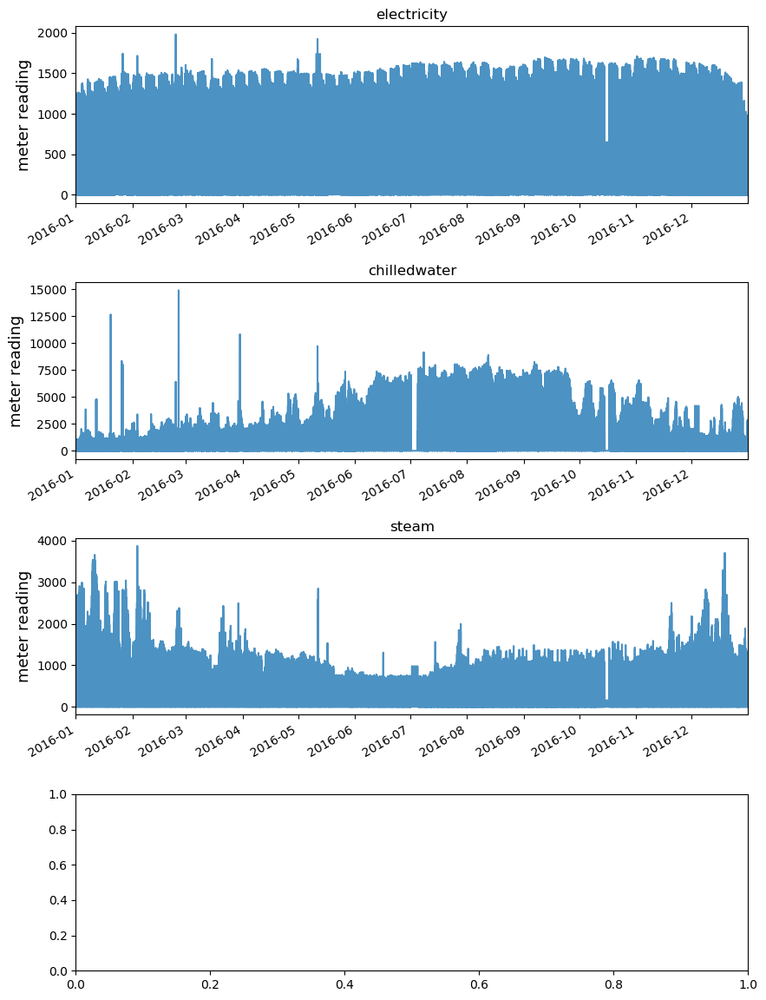

In [280]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(9)

In [366]:
train_df.query('site_id == 9 and meter == 1 and meter_reading > 4000')['building_id'].unique()

array([886, 896, 968, 964, 993, 927, 931, 961, 971, 987, 954, 913, 945],
      dtype=uint64)

0

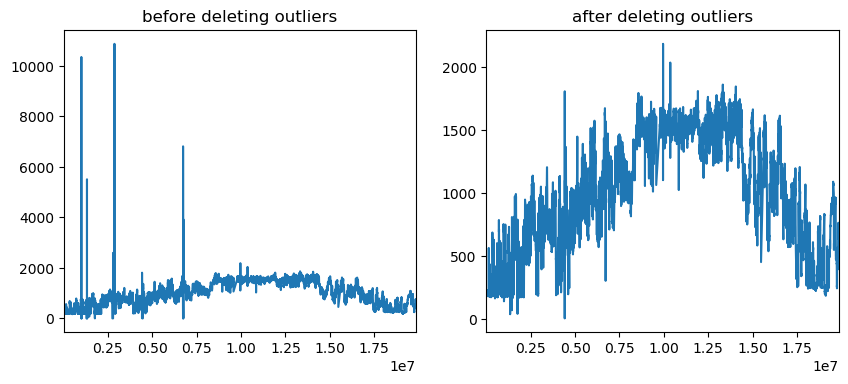

In [284]:
building_id = 932
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2500 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

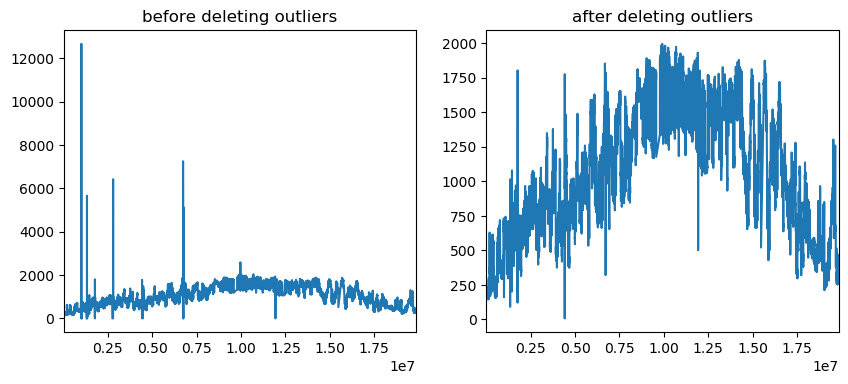

In [289]:
building_id = 962
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

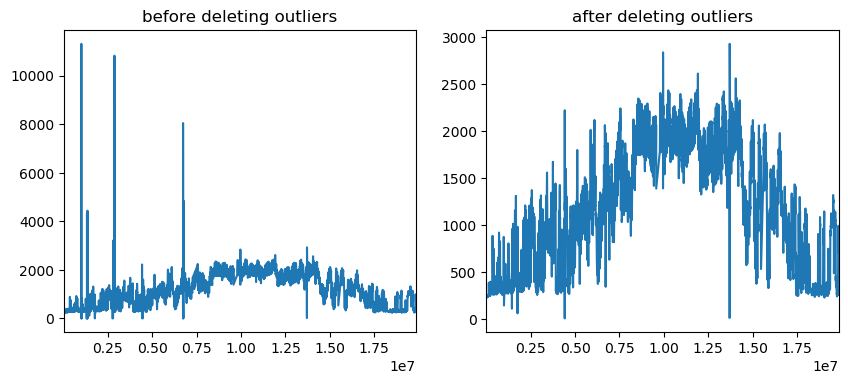

In [294]:
building_id = 966
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

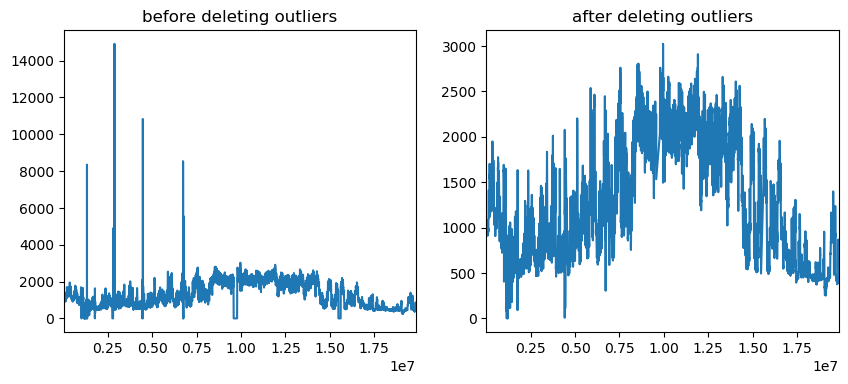

In [296]:
building_id = 903
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 4000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

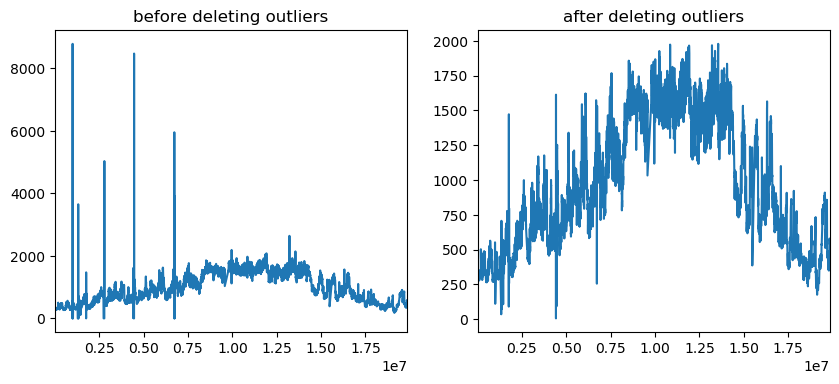

In [304]:
building_id = 883
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

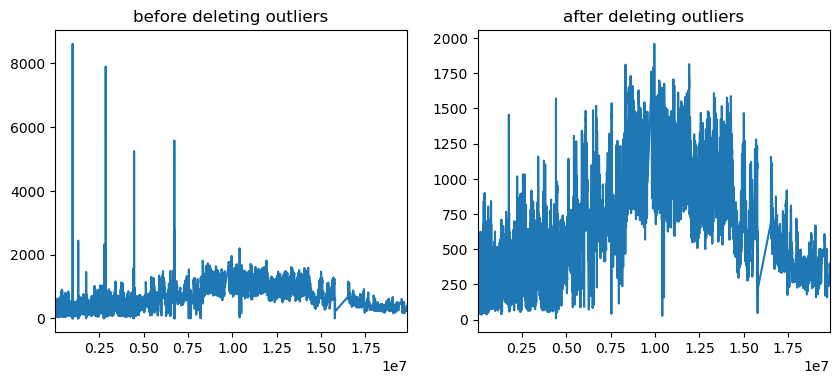

In [305]:
building_id = 911
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

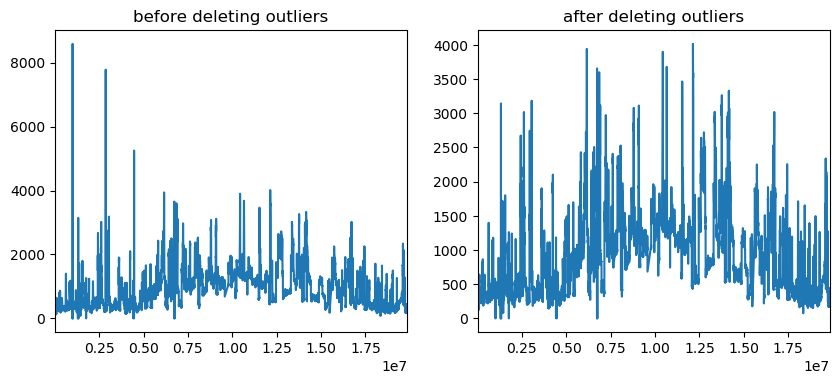

In [308]:
building_id = 913
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 4200)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

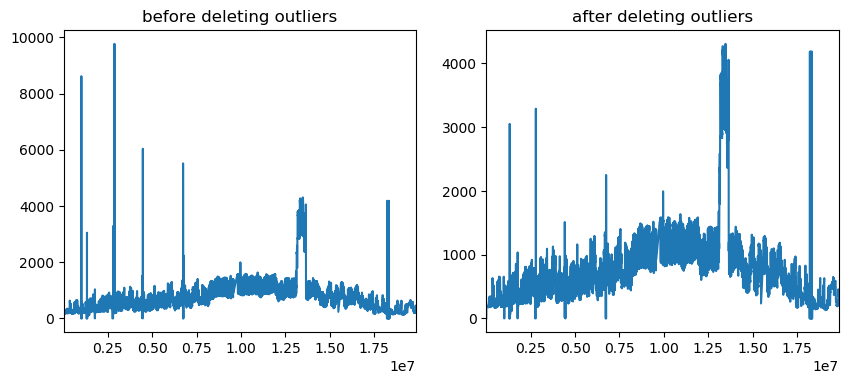

In [310]:
building_id = 945
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 5000)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

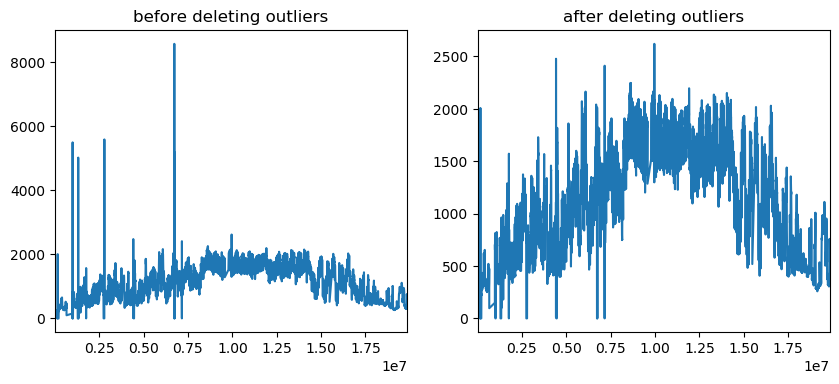

In [315]:
building_id = 928
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3000)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

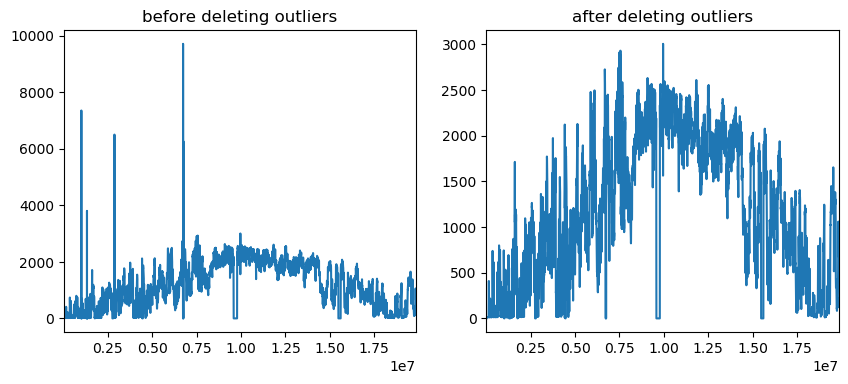

In [316]:
building_id = 955
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3500)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

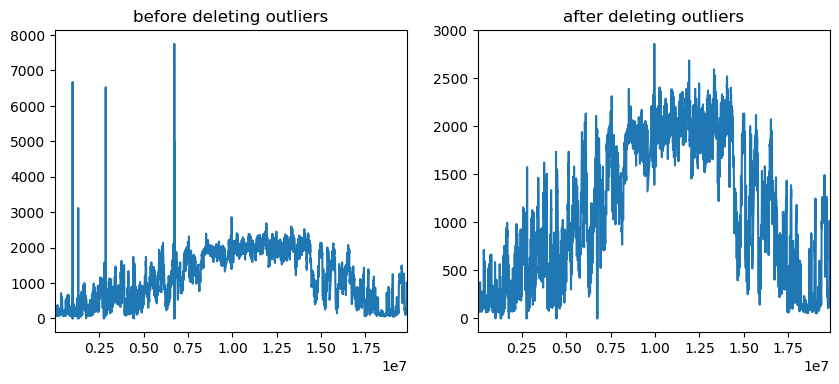

In [336]:
building_id = 890
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3000)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

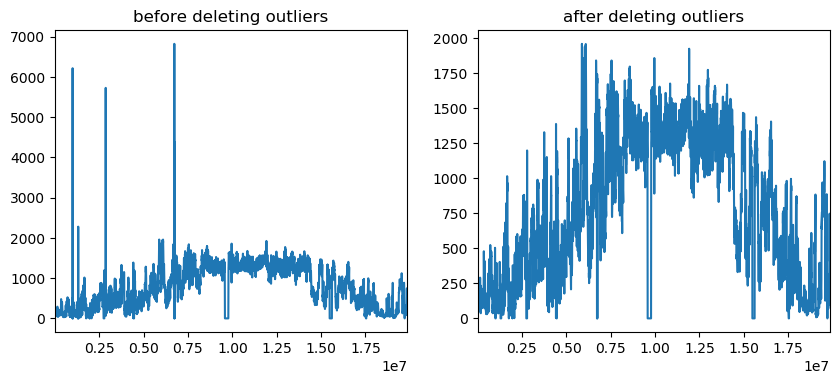

In [338]:
building_id = 946
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

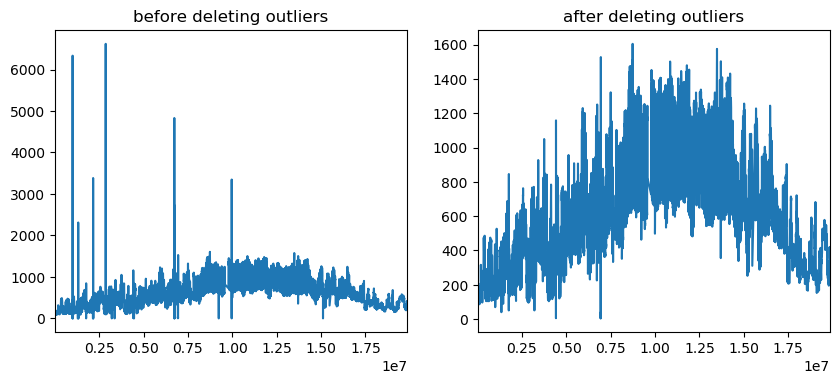

In [341]:
building_id = 972
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

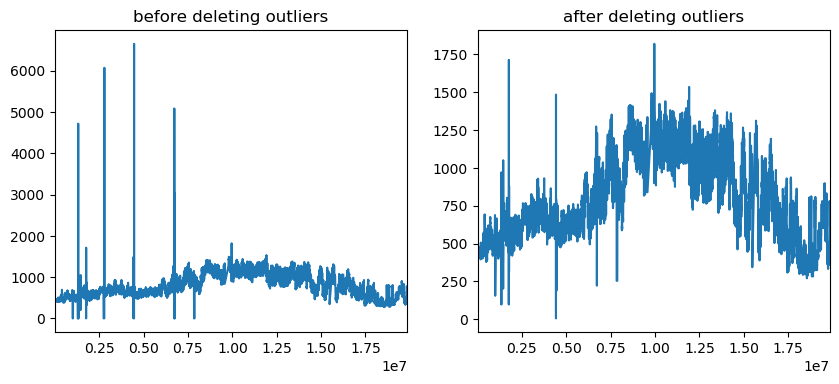

In [345]:
building_id = 924
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

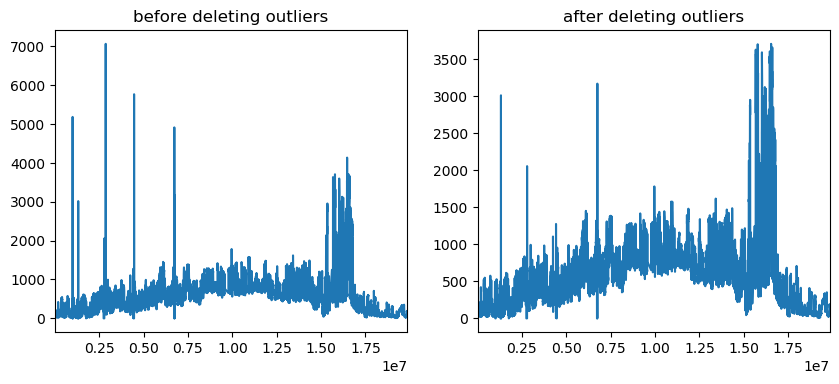

In [347]:
building_id = 958
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 4000)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

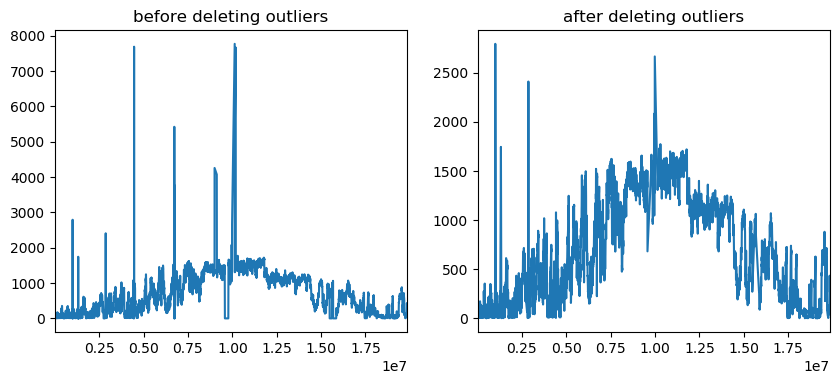

In [350]:
building_id = 879
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

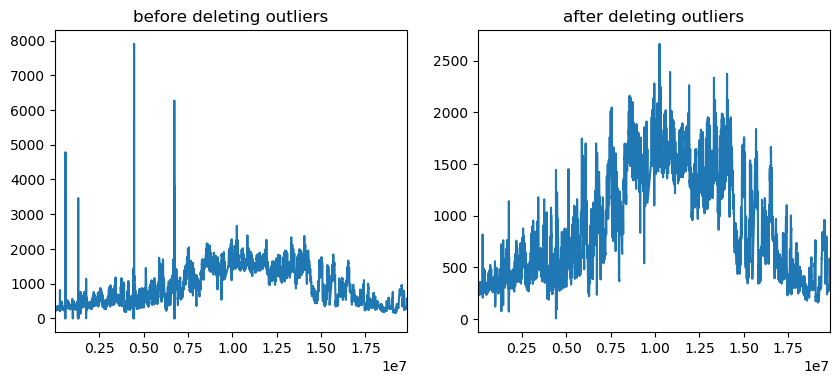

In [358]:
building_id = 914
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

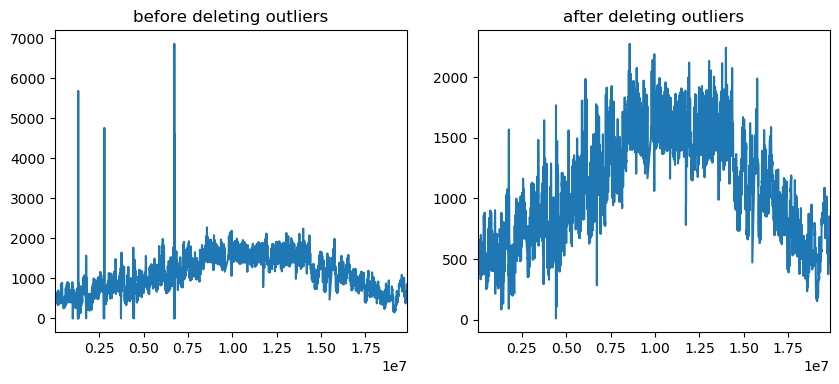

In [356]:
building_id = 921
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

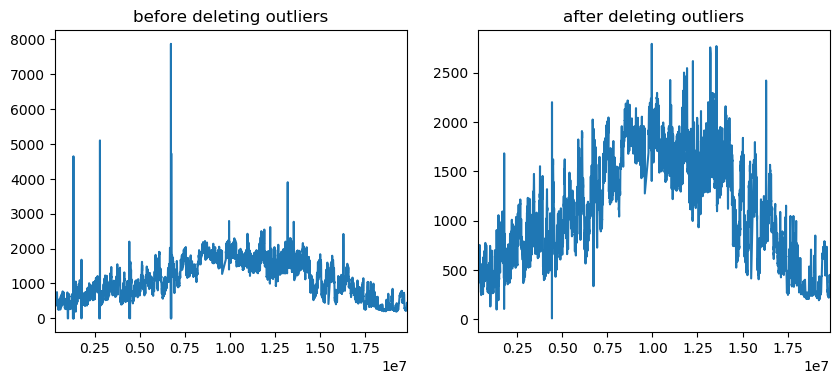

In [360]:
building_id = 953
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 3000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

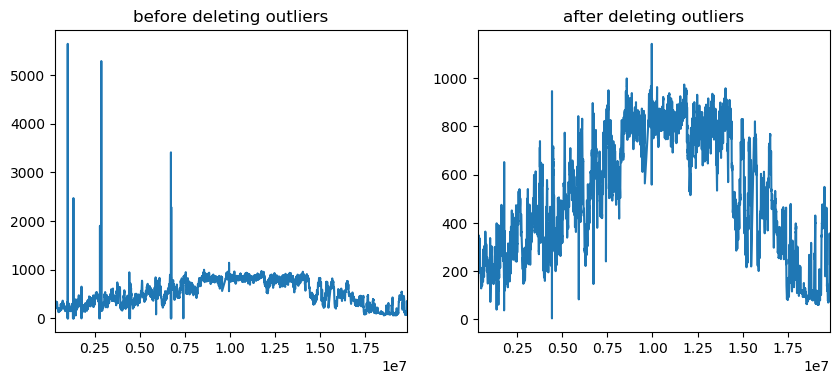

In [371]:
building_id = 886
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

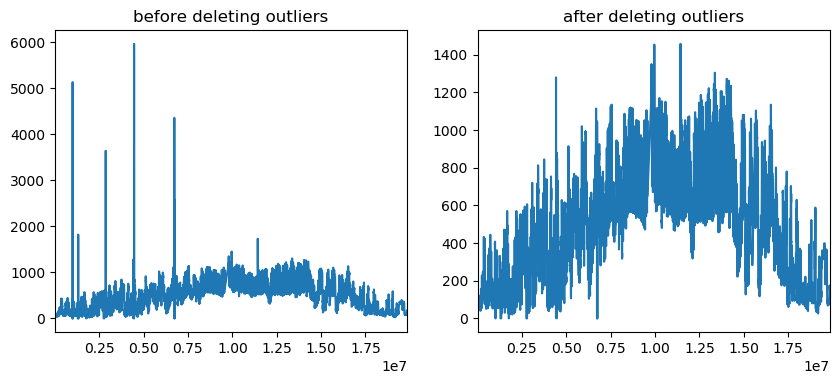

In [372]:
building_id = 896
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

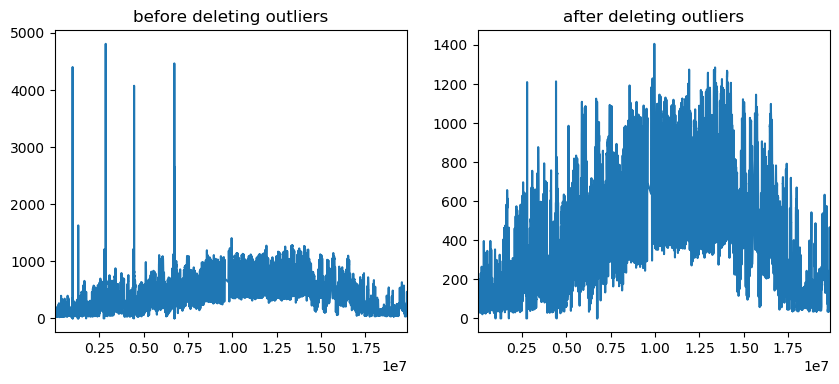

In [374]:
building_id = 968
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

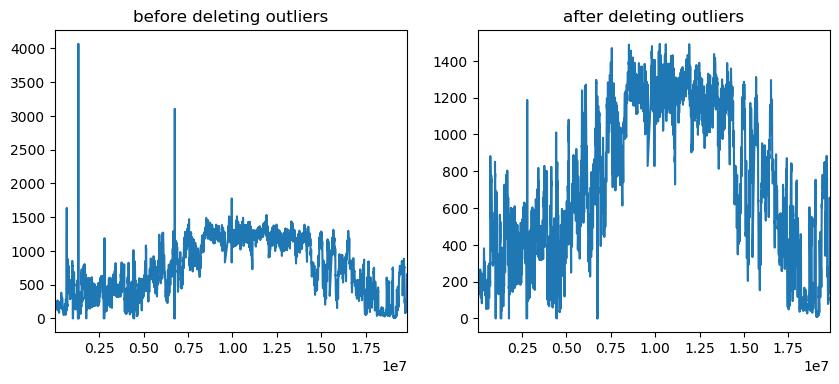

In [376]:
building_id = 964
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

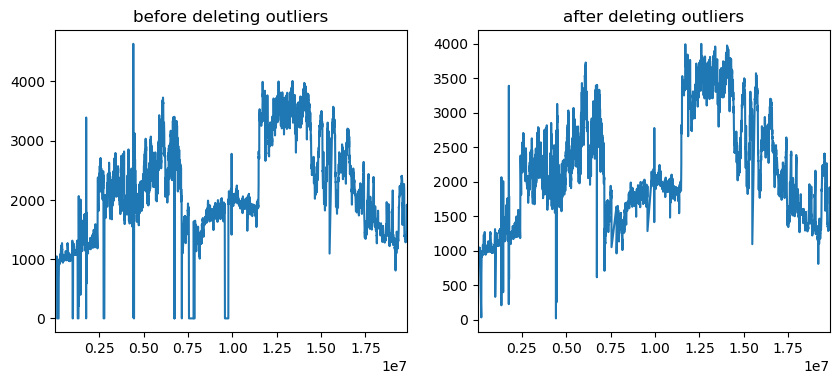

In [378]:
building_id = 927
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 4000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

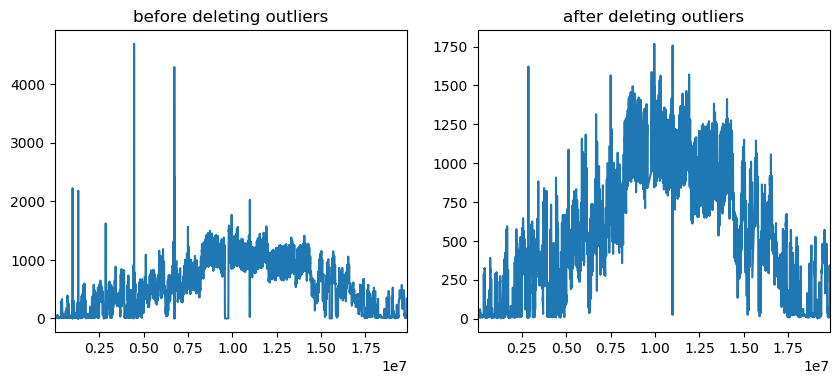

In [382]:
building_id = 931
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

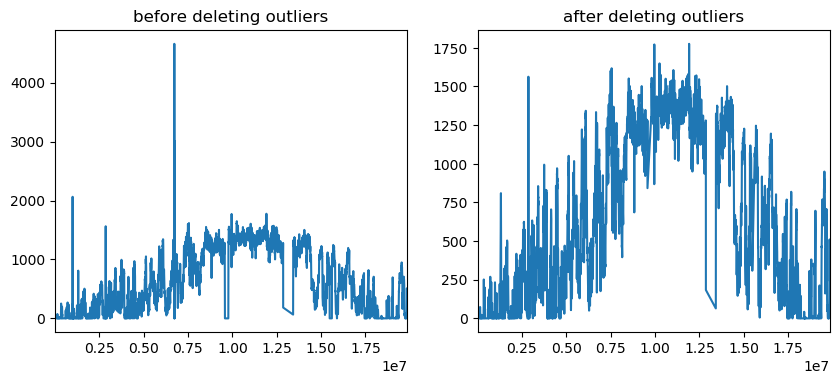

In [384]:
building_id = 961
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 2000 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

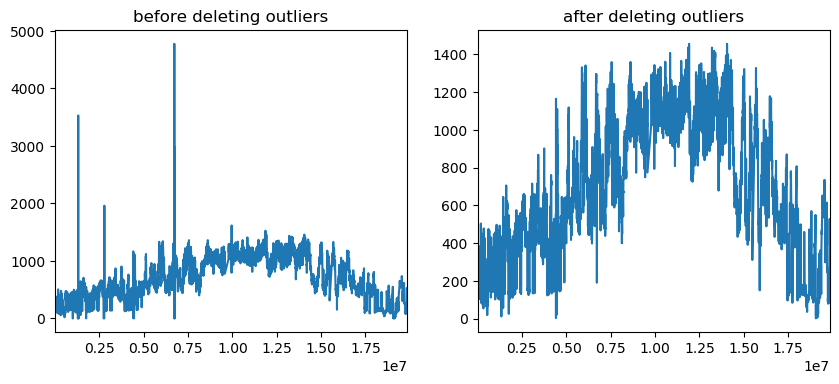

In [388]:
building_id = 971
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

0

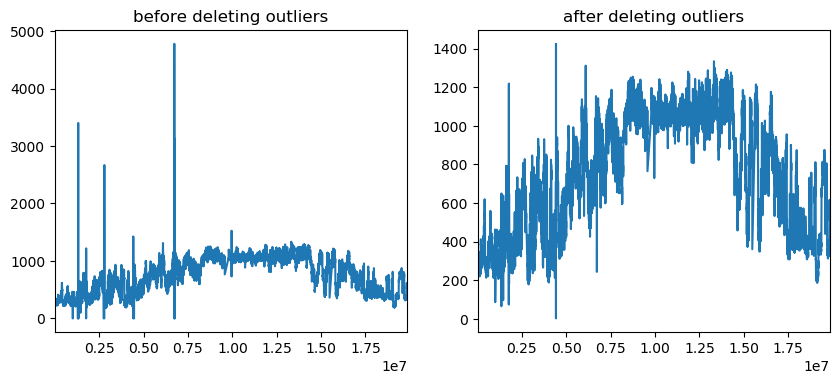

In [392]:
building_id = 987
meter = 1

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=100)

train_df_cp = train_df.copy()
single_building_plot_df(train_df_cp, building_id, meter, axes[0], 'before deleting outliers')
train_df_cp.drop(train_df_cp.query('building_id == @building_id and meter == @meter and (meter_reading > 1500 or meter_reading == 0)').index, inplace=True)
single_building_plot_df(train_df_cp, building_id, meter, axes[1], 'after deleting outliers')
del train_df_cp

gc.collect()

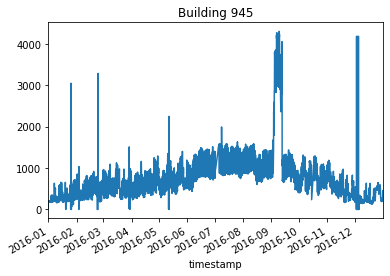

In [395]:
# [932, 962, 966, 903] > 10000
# [883, 911, 913, 945, 993, 928, 955] > 8000
# [890, 946, 972, 993, 924, 958, 879, 914, 921, 953, 954] > 6000
# [886, 896, 968, 964, 993, 927, 931, 961, 971, 987, 954, 913, 945] > 4000

fig = plt.plot()
ax = plt.gca()
building_id = 945
meter = 1

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

In [398]:
train_df.loc[train_df.query('building_id == 903 and meter == 1 and (meter_reading > 4000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 966 and meter == 1 and (meter_reading > 3000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 962 and meter == 1 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 932 and meter == 1 and (meter_reading > 2500 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 883 and meter == 1 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 911 and meter == 1 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 913 and meter == 1 and (meter_reading > 4200)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 945 and meter == 1 and (meter_reading > 5000)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 928 and meter == 1 and (meter_reading > 3000)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 955 and meter == 1 and (meter_reading > 3500)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 890 and meter == 1 and (meter_reading > 3000)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 946 and meter == 1 and (meter_reading > 2000)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 972 and meter == 1 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 924 and meter == 1 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 958 and meter == 1 and (meter_reading > 4000)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 879 and meter == 1 and (meter_reading > 3000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 914 and meter == 1 and (meter_reading > 3000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 921 and meter == 1 and (meter_reading > 3000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 953 and meter == 1 and (meter_reading > 3000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 987 and meter == 1 and (meter_reading > 1500 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 971 and meter == 1 and (meter_reading > 1500 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 961 and meter == 1 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 931 and meter == 1 and (meter_reading > 2000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 927 and meter == 1 and (meter_reading > 4000 or meter_reading == 0)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 964 and meter == 1 and (meter_reading > 1500)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 968 and meter == 1 and (meter_reading > 1500)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 896 and meter == 1 and (meter_reading > 1500)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 886 and meter == 1 and (meter_reading > 1500 or meter_reading == 0)').index, 'IsFiltered'] = 1

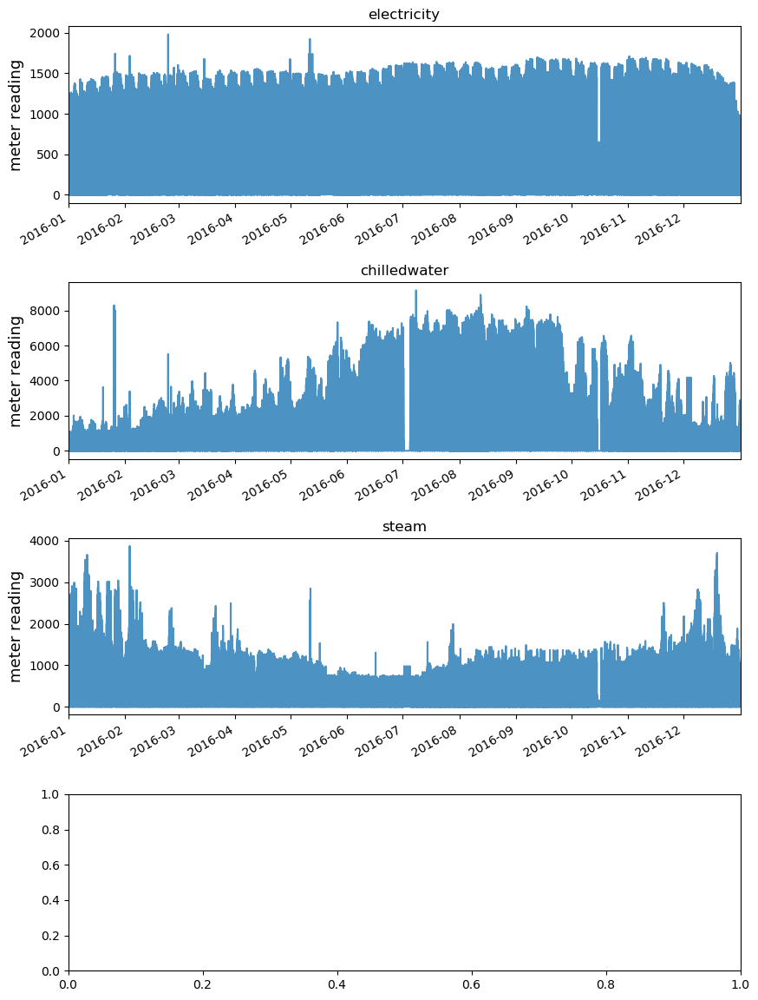

In [397]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(9)

## Site 10

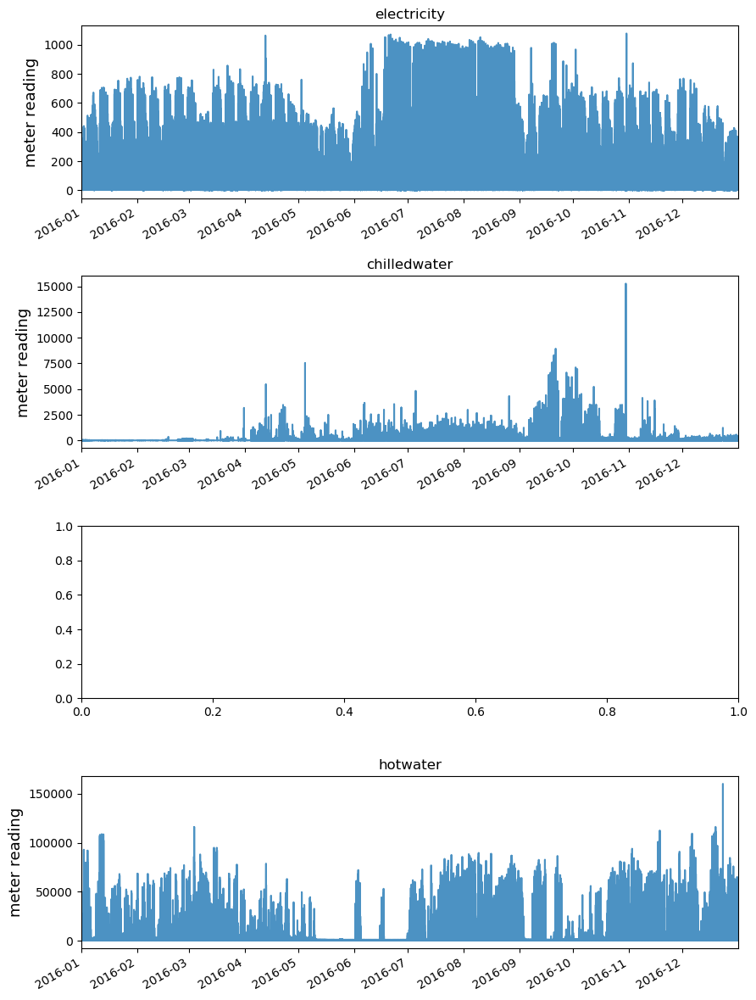

In [186]:
site_plot(10)

### Meter 0

In [399]:
print('[Site 10 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 998 and meter == 0 and meter_reading > 300').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1000 and meter == 0 and meter_reading > 300').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1006 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1008 and meter == 0 and (meter_reading > 250 or meter_reading < 5)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1019 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1025 and meter == 0 and meter_reading < 20').index, 'IsFiltered'] = 1

[Site 10 - Electricity] Filtering outliers


### Meter 1

In [400]:
print('[Site 10 - Chilled Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 1003 and meter == 1 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1017 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1

[Site 10 - Chilled Water] Filtering outliers


### Meter 3

In [401]:
print('[Site 10 - Hot Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 1000 and meter == 3 and meter_reading > 5000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1003 and meter == 3 and meter_reading > 40 and ("2016-06-01" < timestamp < "2016-08-01")').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1012 and meter == 3 and meter_reading > 500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1017 and meter == 3 and meter_reading > 5000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1018 and meter == 3 and meter_reading > 10000').index, 'IsFiltered'] = 1

[Site 10 - Hot Water] Filtering outliers


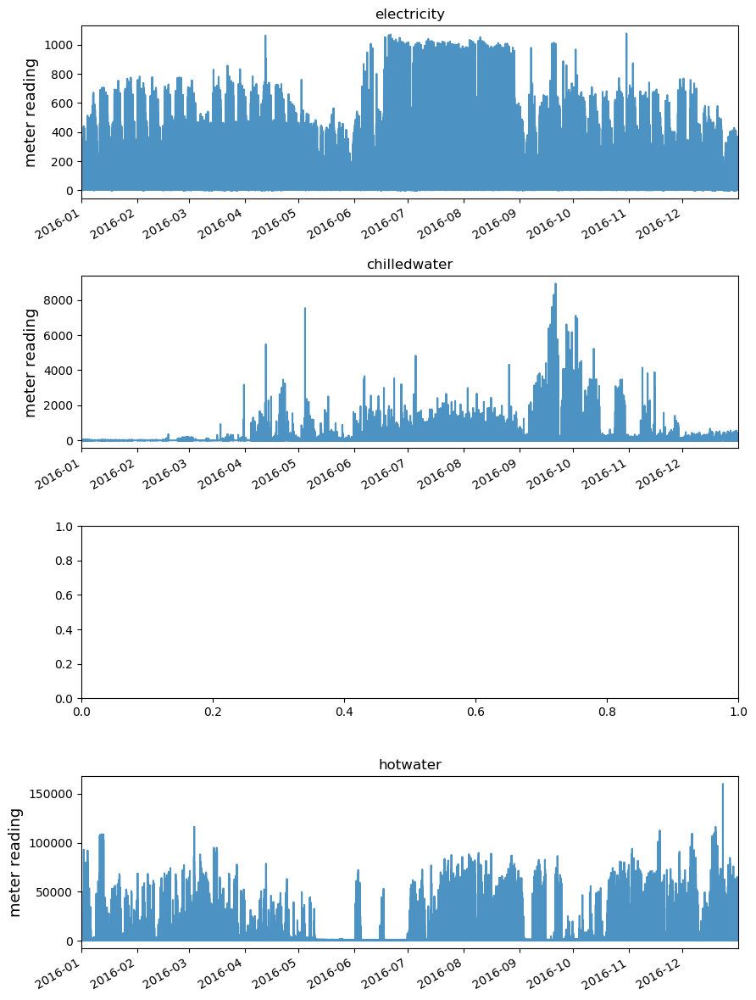

In [403]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(10)

In [404]:
train_df.query('site_id == 10 and meter == 3 and meter_reading > 150000')

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,IsFiltered
19365172,1021,3,2016-12-23 10:00:00,160187.0,10,Entertainment/public assembly,213762,NaN,2.0,NaN


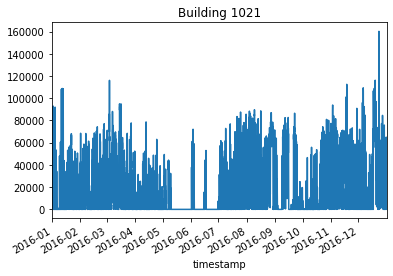

In [405]:
fig = plt.plot()
ax = plt.gca()
building_id = 1021
meter = 3

single_building_plot(building_id, meter, ax, 'Building {}'.format(building_id))

## Site 12

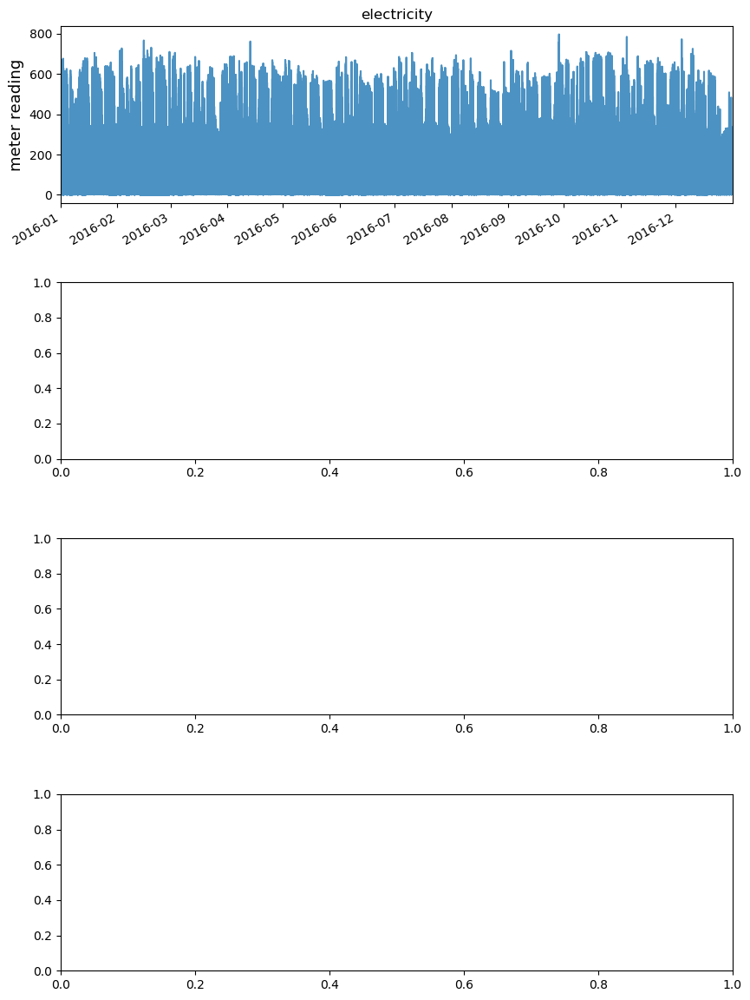

In [406]:
site_plot(12)

In [407]:
print('[Site 12 - Electricity] Filtering leading constant values')
site12_meter0_thresholds = {
    50: [1066]
}

for threshold in site12_meter0_thresholds:
    for building_id in site12_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 12 - Electricity] Filtering leading constant values


### Site 13

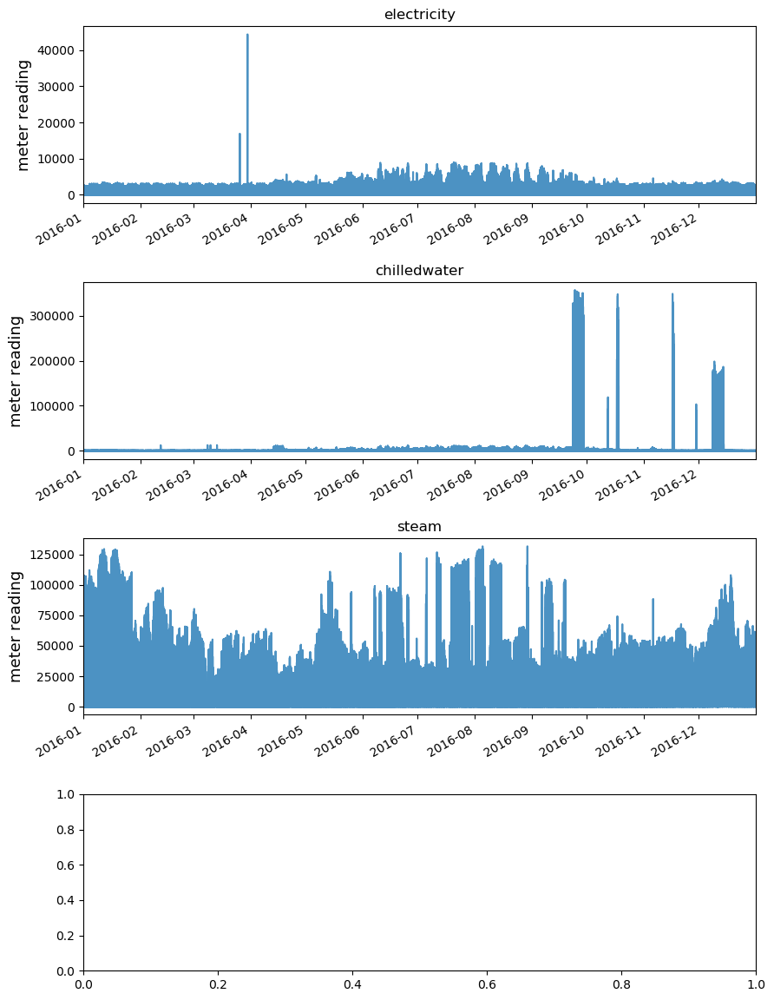

In [408]:
site_plot(13)

### Meter 0

In [409]:
print('[Site 13 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 1070 and meter == 0 and (meter_reading < 0 or meter_reading > 200)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1073 and meter == 0 and (meter_reading < 60 or meter_reading > 800)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1073 and meter == 0 and timestamp < "2016-08-01" and meter_reading > 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1082 and meter == 0 and (meter_reading < 5 or meter_reading > 200)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1088 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1098 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1100 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1119 and meter == 0 and meter_reading < 30').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1128 and meter == 0 and (meter_reading < 25 or meter_reading > 175)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1153 and meter == 0 and (meter_reading < 90 or meter_reading > 250)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1157 and meter == 0 and (meter_reading < 110 or meter_reading > 200)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1162 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1163 and meter == 0 and meter_reading < 30').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1165 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1167 and meter == 0 and (meter_reading == 0 or meter_reading > 250)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1168 and meter == 0 and meter_reading > 6000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1172 and meter == 0 and meter_reading < 100').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1177 and meter == 0 and meter_reading < 15').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1185 and meter == 0 and (meter_reading > 300 or meter_reading < 10)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1202 and meter == 0 and (meter_reading < 50 or meter_reading > 300)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1203 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1206 and meter == 0 and meter_reading < 40').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1207 and meter == 0 and meter_reading < 100').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1208 and meter == 0 and meter_reading < 100').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1209 and meter == 0 and (meter_reading > 350 or meter_reading < 175)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1210 and meter == 0 and (meter_reading > 225 or meter_reading < 75)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1212 and meter == 0 and meter_reading < 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1219 and meter == 0 and (meter_reading < 35 or meter_reading > 300)').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1222 and meter == 0 and meter_reading < 100').index, 'IsFiltered'] = 1

[Site 13 - Electricity] Filtering outliers


In [410]:
print('[Site 13 - Electricity] Filtering leading constant values')
site13_meter0_thresholds = {
    40: [1079, 1096, 1113, 1154, 1160, 1169, 1170, 1189, 1221]
}

for threshold in site13_meter0_thresholds:
    for building_id in site13_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 13 - Electricity] Filtering leading constant values


### Meter 1

In [411]:
print('[Site 13 - Chilled Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 1088 and meter == 1 and meter_reading > 10000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1220 and meter == 1 and meter_reading > 4000').index, 'IsFiltered'] = 1

[Site 13 - Chilled Water] Filtering outliers


In [412]:
print('[Site 13 - Chilled Water] Filtering leading constant values')
site13_meter1_thresholds = {
    40: [1130, 1160]
}

for threshold in site13_meter1_thresholds:
    for building_id in site13_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 13 - Chilled Water] Filtering leading constant values


### Meter 2

In [413]:
print('[Site 13 - Steam] Filtering outliers')
train_df.loc[train_df.query('building_id == 1075 and meter == 2 and meter_reading > 3500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1099 and meter == 2 and meter_reading > 30000').index, 'IsFiltered'] = 1

[Site 13 - Steam] Filtering outliers


In [414]:
print('[Site 13 - Steam] Filtering leading constant values')
site13_meter2_thresholds = {
    40: [1072, 1098, 1158],
    100: [1111],
    500: [1129, 1176, 1189]
}

for threshold in site13_meter2_thresholds:
    for building_id in site13_meter2_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 2, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 13 - Steam] Filtering leading constant values


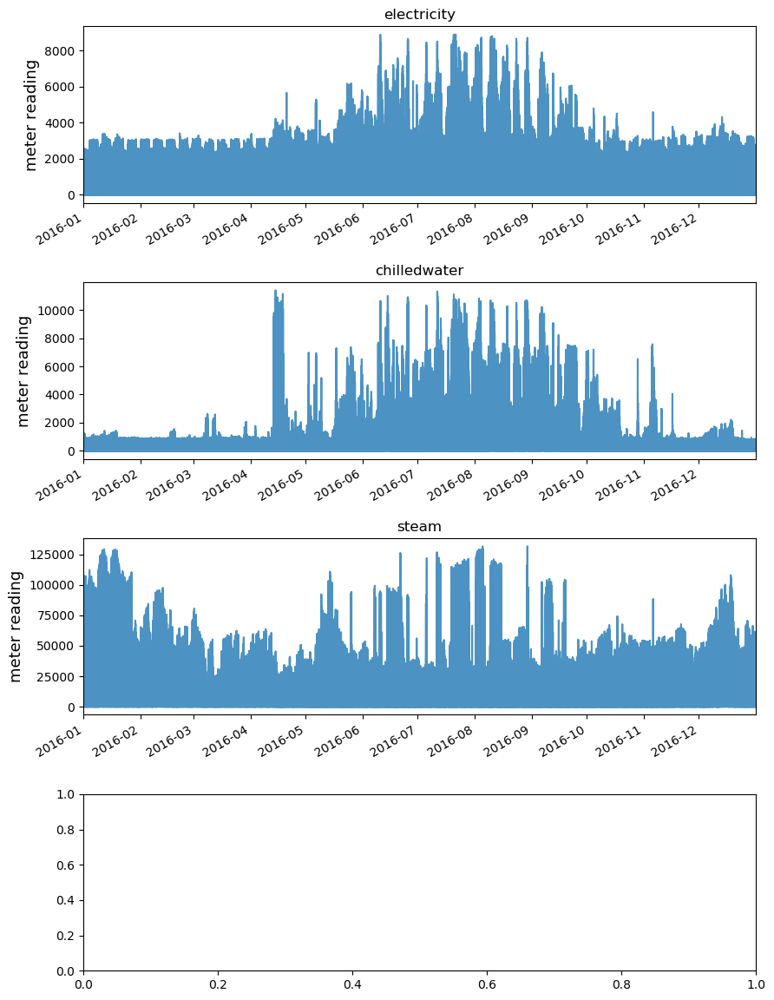

In [415]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(13)

## Site 14

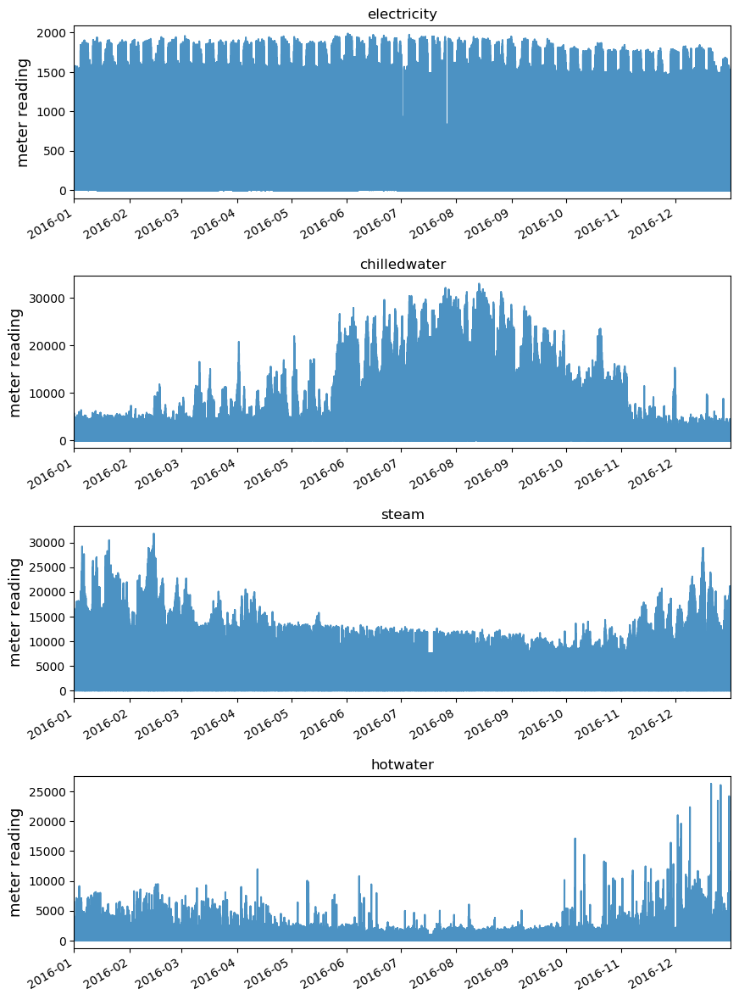

In [416]:
site_plot(14)

### meter 0

In [417]:
print('[Site 14 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 1252 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1258 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1263 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1284 and meter == 0 and meter_reading == 0').index, 'IsFiltered'] = 1

[Site 14 - Electricity] Filtering outliers


In [418]:
print('[Site 14 - Electricity] Filtering leading constant values')
site14_meter0_thresholds = {
    100: [1223, 1225, 1226, 1240, 1241, 1250, 1255, 1264, 1265, 1272, 1275, 1276, 1277, 1278, 1279, 1280, 1283,
          1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1302, 1303, 1317, 1322],
    300: [1319],
    500: [1233, 1234]
}

for threshold in site14_meter0_thresholds:
    for building_id in site14_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 14 - Electricity] Filtering leading constant values


### Meter 1

In [419]:
print('[Site 14 - Chilled Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 1236 and meter == 1 and meter_reading > 2000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1242 and meter == 1 and meter_reading > 800').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1276 and meter == 1 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1280 and meter == 1 and meter_reading > 120').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1311 and meter == 1 and meter_reading > 1100').index, 'IsFiltered'] = 1

[Site 14 - Chilled Water] Filtering outliers


In [420]:
print('[Site 14 - Chilled Water] Filtering leading constant values')
site14_meter1_thresholds = {
    50: [1239, 1245, 1247, 1248, 1254, 1287, 1295, 1307, 1308],
    100: [1225, 1226, 1227, 1230, 1232, 1233, 1234, 1237, 1240, 1246, 1260, 1263, 1264, 1272, 1276, 
          1280, 1288, 1290, 1291, 1292, 1293, 1294, 1296, 1297, 1300, 1302, 1303, 1310, 1311, 1312, 
          1317],
    500: [1223]
}

for threshold in site14_meter1_thresholds:
    for building_id in site14_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 14 - Chilled Water] Filtering leading constant values


### Meter 2

In [421]:
print('[Site 14 - Steam] Filtering outliers')
train_df.loc[train_df.query('building_id == 1249 and meter == 2 and meter_reading > 4000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1254 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1256 and meter == 2 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1263 and meter == 2 and meter_reading > 9000').index, 'IsFiltered'] = 1

[Site 14 - Steam] Filtering outliers


In [422]:
print('[Site 14 - Steam] Filtering leading constant values')
site14_meter2_thresholds = {
    50: [1225, 1226, 1239, 1254, 1284, 1285, 1286, 1287, 1289, 1290,
         1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1301,
         1303, 1305, 1308, 1309, 1310],
    100: [1238, 1243, 1245, 1247, 1248, 1249, 1250, 1263, 1307]
}

for threshold in site14_meter2_thresholds:
    for building_id in site14_meter2_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 2, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 14 - Steam] Filtering leading constant values


### Meter 3

In [423]:
print('[Site 14 - Hot Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 1231 and meter == 3 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1232 and meter == 3 and meter_reading > 4500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1236 and meter == 3 and meter_reading > 600').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1251 and meter == 3 and meter_reading > 3000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1268 and meter == 3 and meter_reading > 1500').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1274 and meter == 3 and meter_reading > 1000').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1298 and meter == 3 and meter_reading > 5000').index, 'IsFiltered'] = 1

[Site 14 - Hot Water] Filtering outliers


In [424]:
print('[Site 14 - Hot Water] Filtering leading constant values')
site14_meter3_thresholds = {
    40: [1270, 1322, 1323],
    50: [1223, 1224, 1227, 1228, 1229, 1231, 1233, 1234, 1235, 1236, 1240, 1242, 1244, 1246, 1251, 1252, 1260, 1262, 1265,
         1266, 1267, 1269, 1271, 1272, 1273, 1274, 1275, 1276, 1312, 1317, 1318, 1319, 1321],
    100: [1231, 1232, 1237]
}

for threshold in site14_meter3_thresholds:
    for building_id in site14_meter3_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 3, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 14 - Hot Water] Filtering leading constant values


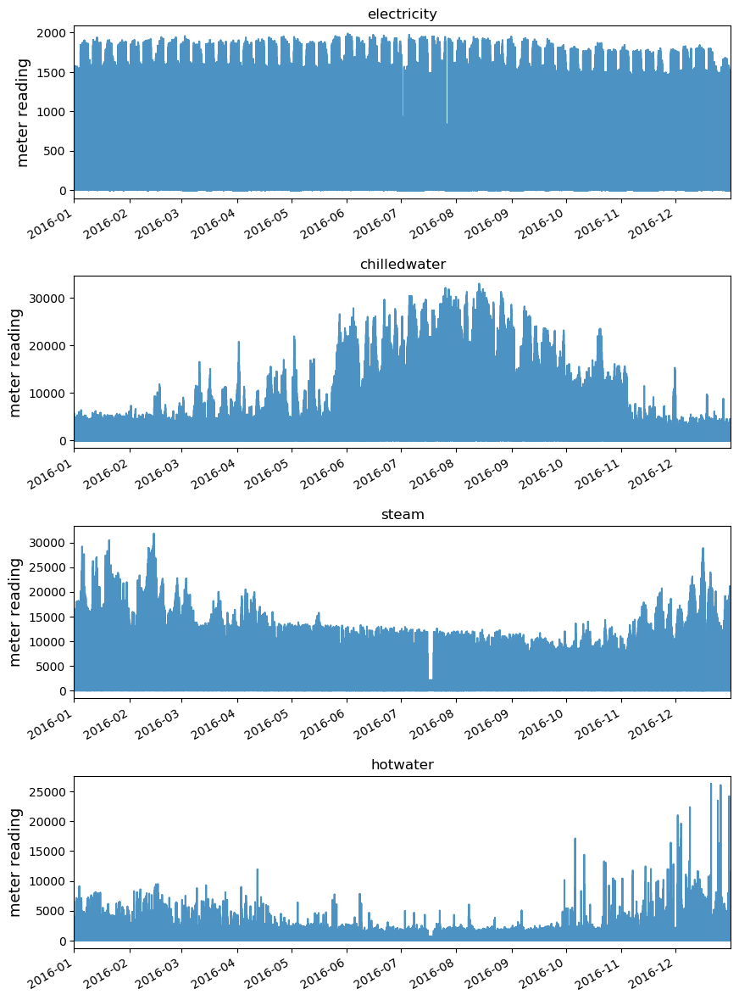

In [425]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(14)

## Site 15

In [426]:
print('[Site 15 - Electricity] Filtering outliers')
train_df.loc[train_df.query('building_id == 1383 and meter == 0 and meter_reading < 60').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1401 and meter == 0 and meter_reading < 10').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1414 and meter == 0 and meter_reading < 30').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1423 and meter == 0 and meter_reading < 5').index, 'IsFiltered'] = 1

[Site 15 - Electricity] Filtering outliers


In [427]:
print('[Site 15 - Electricity] Filtering leading constant values')
site15_meter0_thresholds = {
    50: [1345, 1359, 1446]
}

for threshold in site15_meter0_thresholds:
    for building_id in site15_meter0_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 0, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 15 - Electricity] Filtering leading constant values


### Meter 1

In [428]:
print('[Site 15 - Chilled Water] Filtering outliers')
train_df.loc[train_df.query('building_id == 1349 and meter == 1 and meter_reading > 1000 and timestamp < "2016-04-15"').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1382 and meter == 1 and meter_reading > 300 and timestamp < "2016-02-01"').index, 'IsFiltered'] = 1

[Site 15 - Chilled Water] Filtering outliers


In [429]:
print('[Site 15 - Chilled Water] Filtering leading constant values')
site15_meter1_thresholds = {
    50: [1363, 1410]
}

for threshold in site15_meter1_thresholds:
    for building_id in site15_meter1_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 1, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 15 - Chilled Water] Filtering leading constant values


### Meter 2

In [430]:
print('[Site 15 - Steam] Filtering outliers')
train_df.loc[train_df.query('building_id == 1355 and meter == 2 and meter_reading < 200').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1361 and meter == 2 and meter_reading < 203').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1392 and meter == 2 and meter_reading < 150').index, 'IsFiltered'] = 1
train_df.loc[train_df.query('building_id == 1426 and meter == 2 and meter_reading > 1000').index, 'IsFiltered'] = 1

[Site 15 - Steam] Filtering outliers


In [431]:
print('[Site 15 - Steam] Filtering leading constant values')
site15_meter2_thresholds = {
    20: [1425, 1427],
    40: [1329, 1337, 1338, 1341, 1342, 1344, 1347, 1350, 1351, 1354, 1360, 1364,
         1367, 1377, 1379, 1381, 1382, 1383, 1391, 1396, 1402, 1405, 1406, 1409,
         1414, 1418, 1424, 1430, 1433, 1437]
}

for threshold in site15_meter2_thresholds:
    for building_id in site15_meter2_thresholds[threshold]:
        filtered_idx = find_constant(building_id, 2, threshold)
        train_df.loc[filtered_idx, 'IsFiltered'] = 1

[Site 15 - Steam] Filtering leading constant values


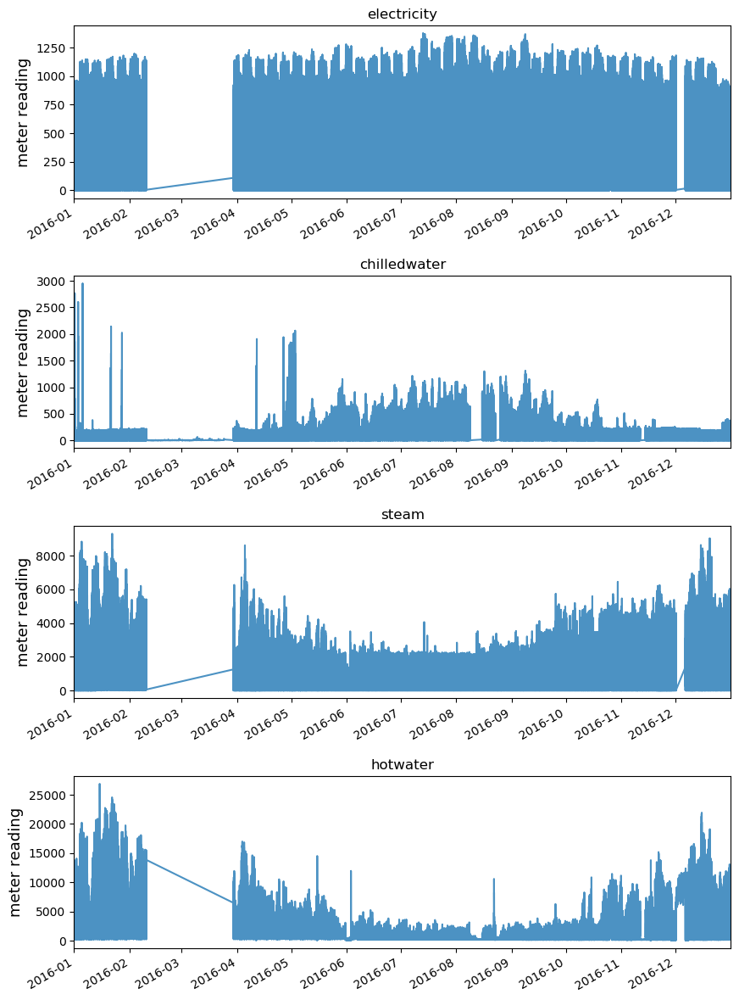

In [432]:
site_plot(15)

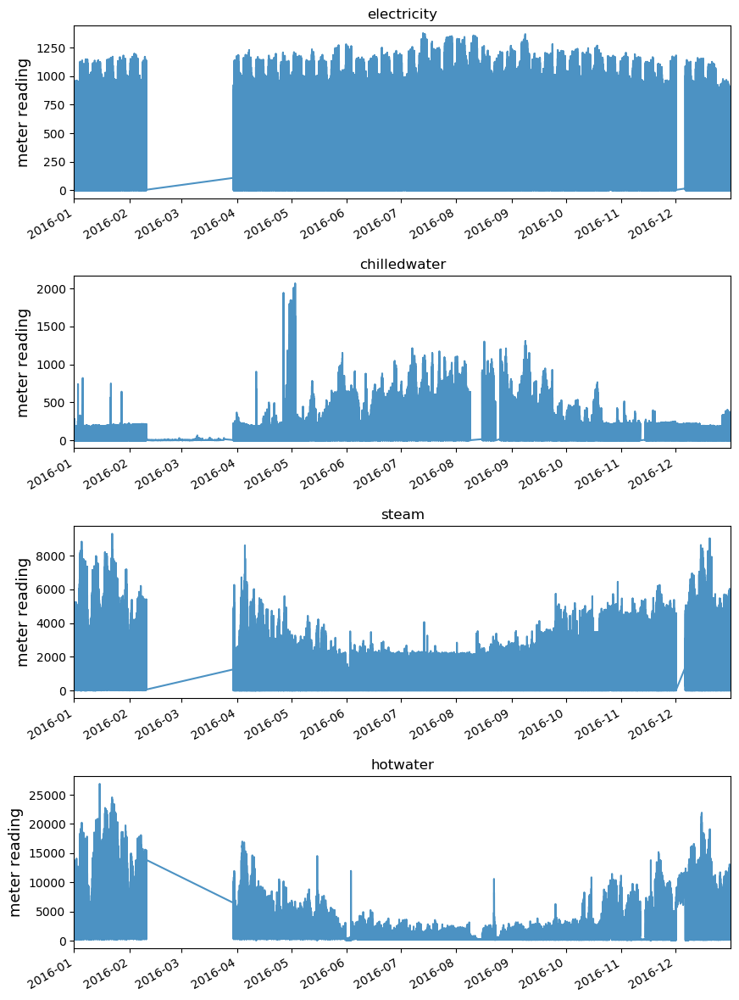

In [433]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
site_plot(15)

# Drop outliers

In [434]:
train_df.drop(train_df.query('IsFiltered == 1').index, inplace=True)
train_df.drop(columns=['IsFiltered'], inplace=True)

In [435]:
gc.collect()

10059